# Path Planning Benchmark

This notebook presents a comprehensive benchmarking framework for evaluating path planning algorithms for autonomous forklifts with four-wheel steering capabilities. 

## 1. Introduction and Setup

The primary objective of this benchmark is to systematically compare our proposed Hamiltonian Fast Marching Method (HFMM) with state-based control against established sampling-based planning algorithms such as RRT, RRT*, Informed-RRT*, and SST. Our evaluation focuses on both two-wheel steering (2WS) and four-wheel steering (4WS) configurations to quantify the benefits of enhanced steering capabilities across different environmental conditions.

### 1.1 Required Libraries

In [1]:
import sys
import os

current_dir = os.path.abspath(os.getcwd())
bench_path = os.path.join(current_dir, 'bench-mr', 'python')
sys.path.append(bench_path)

from agd import Eikonal 
from agd import AutomaticDifferentiation as ad
from agd import Plotting
from scipy import ndimage
import time
import subprocess

Initialize CUDA environment if available. The path planning implementation requires GPU acceleration for efficient computation of the Fast Marching Method

In [2]:
import numpy as np; xp = np

import matplotlib as mpl
mpl.rcParams['mathtext.fontset'] = 'cm'     # Use Computer Modern font for math
mpl.rcParams['pdf.fonttype'] = 42           # Ensure font compatibility 
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import matplotlib.colors as mcolors

try :import cupy
except ModuleNotFoundError: raise ad.DeliberateNotebookError("A cuda enabled gpu is required for this notebook")

xp,plt,Eikonal = map(ad.cupy_friendly,(xp,plt,Eikonal))

Replacing numpy with cupy, set to output 32bit ints and floats by default.
Using cp.asarray(*,dtype=np.float32) as the default caster in ad.array.
Returning a copy of module matplotlib.pyplot whose functions accept cupy arrays as input.
Setting dictIn.default_mode = 'gpu' in module agd.Eikonal .


In [3]:
# Import core benchmark utilities
from plot_env import plot_env
import json
from plot_env import plot_env, plot_env_options
from plot_trajectory import plot_trajectory, plot_nodes, plot_trajectory_options
from color import get_color, get_colors
from mpb import MPB, MultipleMPB
from trajectory import visualize
from plot_stats import plot_planner_stats, plot_smoother_stats
from definitions import steer_functions, robot_models, planner_names
from metrics_bindings import compute_path_length, compute_curvature, compute_smoothness, compute_clearing_distances, compute_aol, compute_clearing_distances

# Configure inline plotting with high DPI
%config InlineBackend.figure_format='retina'

### 1.2 Benchmark Configuration

The Motion Planning Benchmark (MPB) system provides a standardized framework for evaluating and comparing different path planning approaches under consistent conditions. This section implements the configuration settings for our benchmark tests.

#### Benchmark Parameters

The benchmark configuration includes several components like the environement, the robot's model in term of shape and kinematic parameters

The `create_mpb` function serves as the central configuration mechanism, accepting parameters for the planning algorithm, steering function type, vehicle dimensions, and maximum planning time. This function then initializes all necessary components with standardized settings to create a fair comparison framework. Each planner operates with the same robot model, environment representation, and evaluation criteria, allowing us to isolate and measure the specific advantages of different approaches to path planning for autonomous forklifts.

In [4]:
# Create benchmark configuration function
def create_mpb(planner: str, extend_function: str, wheelbase_zoom, planning_time):
    """Create Motion Planning Benchmark configuration.
    
    This function configures a standardized benchmark environment for comparing
    path planning approaches. It sets up consistent parameters for planning time,
    robot model, environment, and collision checking.
    
    Args:
        planner (str): Name of planning algorithm to test
        extend_function (str): Steering function type ('reeds_shepp' etc.)
        wheelbase_zoom (float): Scaled wheelbase length for robot model
        planning_time (float): Maximum allowed planning time in seconds
    
    Returns:
        MPB: Configured benchmark object
    """
    # Initialize benchmark object
    mpb = MPB()
    
    # Set core planning parameters
    mpb["ompl.seed"] = 5  # Fixed seed for reproducibility
    mpb["max_planning_time"] = planning_time
    
    # Configure planner and steering
    mpb.set_planners([planner])
    mpb.set_steer_functions([extend_function])
    
    # Set vehicle model parameters
    mpb["steer.car_turning_radius"] = wheelbase_zoom/(np.tan(0.5))
    mpb["steer.allow_backward_motion"] = True  # Enable reverse motion
    
    # Set robot shape and environment files
    current_dir = os.path.abspath(os.getcwd())
    bot_path = os.path.join(current_dir, "bot_zoom.svg")
    map_path = os.path.join(current_dir, "benoit_world_zoom.png")
    
    # Configure environment grid
    mpb.set_image_grid_env(
        map_path,
        desired_width=200,
        desired_height=200,
        occupancy_threshold=0.5
    )
    mpb["env.collision.collision_model"] = 1
    mpb["env.collision.robot_shape_source"] = bot_path
    
    # Set benchmark identifier
    mpb.set_id('comparison_extend_function_%s_%s' % (planner, extend_function))
    
    # Configure path smoothing options
    mpb.set_smoothers([
        'grips',
        'ompl_bspline',
        'ompl_shortcut',
        'ompl_simplify_max'
    ])
    
    # Set start and goal configurations
    mpb.set_goal(160, 30, np.pi/2)  # Goal position and orientation
    mpb.set_start(130, 140, 0)      # Start position and orientation
    
    return mpb

### 1.3 Robot Configuration 

The forklift robot is characterized by several key physical dimensions that affect its motion planning:

- Length (3.6490m): Total length including forks
- Width (0.7m): Vehicle body width
- Wheelbase (1.38m): Distance between front and rear axles
- Offset (0.4845m): Center of rear axle position relative to vehicle body

We use a zoom factor to scale these physical dimensions to match our discretized environment. This scaling ensures appropriate resolution for collision detection while maintaining computational efficiency.

In [5]:
# Set scaling and discretization parameters
zoom_factor = 8  # Scale factor to match robot dimensions to environment grid
rlength = 3.6490 # Robot length in meters
rwidth = 0.7     # Robot width in meters
wheelbase = 1.38 # Distance between front and rear axles
offset = np.array([0.4845, 0])  # Position of rear axle center along robot length

# Compute scaled dimensions for planning
rlength_zoom = rlength * zoom_factor
rwidth_zoom = rwidth * zoom_factor
wheelbase_zoom = wheelbase * zoom_factor
offset_zoom = offset * zoom_factor


## 2. Running the benchmark

This section executes the benchmark comparison of multiple state-of-the-art path planning algorithms using the standardized configuration established in the previous section. We evaluate several sampling-based planners representing different approaches to the motion planning problem, each with its own strengths and limitations.

Available memory: 13.84 GB, limiting each MPB process to 31.2% usage (4.33 GB).
Creating pool of 5 processes.
Running MPB with ID comparison_extend_function_rrt_reeds_shepp (log file at RC/comparison_extend_function_rrt_reeds_shepp.log)...Running MPB with ID comparison_extend_function_sst_reeds_shepp (log file at RC/comparison_extend_function_sst_reeds_shepp.log)...Running MPB with ID comparison_extend_function_informed_rrt_star_reeds_shepp (log file at RC/comparison_extend_function_informed_rrt_star_reeds_shepp.log)...Running MPB with ID comparison_extend_function_spars_reeds_shepp (log file at RC/comparison_extend_function_spars_reeds_shepp.log)...Running MPB with ID comparison_extend_function_rrt_star_reeds_shepp (log file at RC/comparison_extend_function_rrt_star_reeds_shepp.log)...






comparison_extend_function_rrt_reeds_shepp:   0%|          | 0/2 [00:00<?, ?it/s]

comparison_extend_function_rrt_star_reeds_shepp:   0%|          | 0/2 [00:00<?, ?it/s]

comparison_extend_function_informed_rrt_star_reeds_shepp:   0%|          | 0/2 [00:00<?, ?it/s]

comparison_extend_function_sst_reeds_shepp:   0%|          | 0/2 [00:00<?, ?it/s]

comparison_extend_function_spars_reeds_shepp:   0%|          | 0/2 [00:00<?, ?it/s]

Benchmark 0 (comparison_extend_function_rrt_reeds_shepp) finished successfully.
Benchmark 2 (comparison_extend_function_rrt_star_reeds_shepp) finished successfully.
Benchmark 4 (comparison_extend_function_spars_reeds_shepp) finished successfully.
Benchmark 3 (comparison_extend_function_informed_rrt_star_reeds_shepp) finished successfully.
Benchmark 1 (comparison_extend_function_sst_reeds_shepp) finished successfully.
All benchmarks succeeded.
Successfully merged [RC/comparison_extend_function_rrt_reeds_shepp_results.json, RC/comparison_extend_function_sst_reeds_shepp_results.json, RC/comparison_extend_function_rrt_star_reeds_shepp_results.json, RC/comparison_extend_function_informed_rrt_star_reeds_shepp_results.json, RC/comparison_extend_function_spars_reeds_shepp_results.json] into comparison_extend_functions_RC.json.


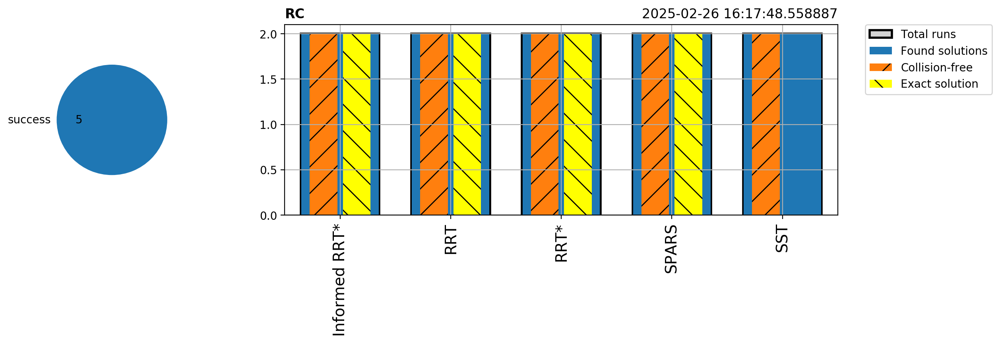

In [6]:
# Initialize parallel benchmark pool
pool = MultipleMPB()

# Define planners to compare
planners = [
    'rrt',              # Basic RRT
    'sst',              # Stable Sparse RRT
    'rrt_star',         # RRT*
    'informed_rrt_star', # Informed RRT*
    'spars'             # Sparse Roadmap
]

# Add each planner to the benchmark pool
for planner in planners:
    pool.benchmarks.append(
        create_mpb(
            planner=planner,
            extend_function='reeds_shepp',
            wheelbase_zoom=wheelbase_zoom,
            planning_time=15
        )
    )

# Run benchmarks in parallel with multiple trials
pool.run_parallel(runs=2, id='RC', show_plot=True)

# Merge results into single output file
pool.merge('comparison_extend_functions_RC.json')

Visualizing comparison_extend_functions_RC.json


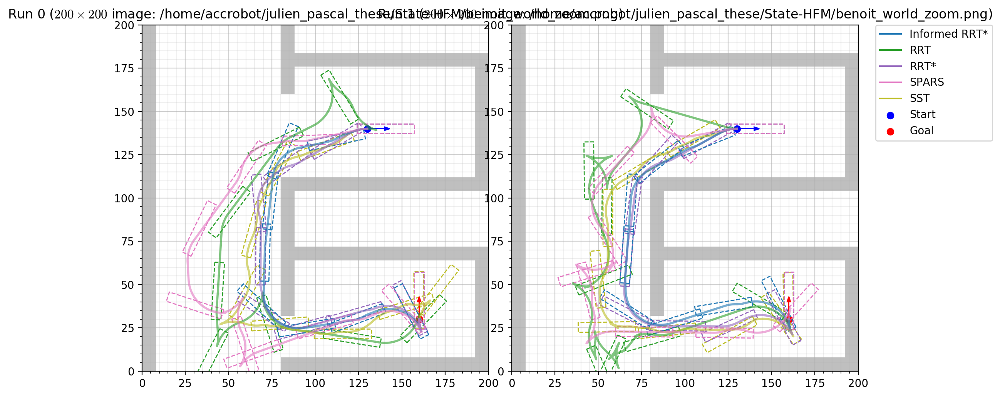

In [7]:
# Visualize paths with robot configurations
visualize(
    'comparison_extend_functions_RC.json',
    plot_every_nth_polygon=60,
    draw_start_goal_thetas=True
)

Visualizing comparison_extend_functions_RC.json...


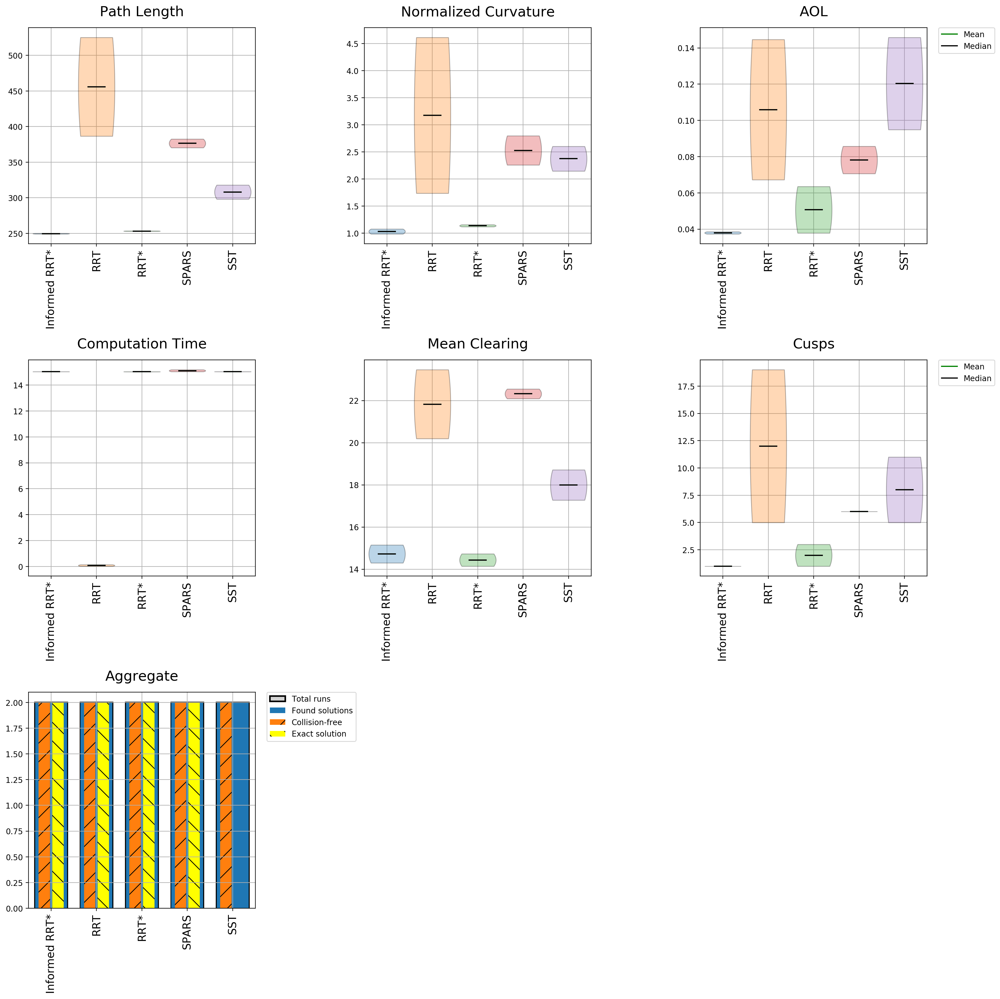

In [8]:
# Generate statistical analysis plots
plot_planner_stats(
    'comparison_extend_functions_RC.json',
    num_colors=10
)

## 3. State-HFM setting 

In this section, we implement the State-based Hamiltonian Fast Marching Method (State-HFM) for path planning. The implementation requires specialized utility functions and parameter selection to properly represent the forklift's motion capabilities and shape within the 3D configuration space.

### 3.1 Utility function and computational parameters

 - `draw_bot`: Visualizes the forklift configuration along computed paths
 - `show_vehicle` : Visualizes vehicle position and orientation using an arrow.
 - `extract_env`: Extract the environment configuration from the previous test run
 - `unitvec`: Determine a unit vector for given angle
 - `calculate_balls_positions`: Calculate centers of balls approximating robot shape
 - `calculate_min_radius`: Calculate minimum ball radius needed for complete coverage
 - `build_3d`: Compute the 3D environment and associated costs functions

We also specify missing pramaters needed for State-HFM : $Nθ$ the number of dicretized points on the third dimension and the number of balls to approximate the shape of our robot. 

In [9]:
Nθ = 100  # Number of angular discretization points
Θ = np.linspace(0,2*np.pi,Nθ,endpoint=False)

balls_number = 12

In [10]:
def draw_bot(gamma,
             nb_pt = 10, 
             zoom_factor = 1., 
             bot_dim=np.array([3.6490,0.7000]),
             offset = np.array([0.4845,0]),
             wheelbase = 1.38,
             colors=['g','y','r']):
    """
    Draw the figure of the robot allong the path.
    Args :
     - gamma : the path
     - nb_pt : number of points where the robot is drawn
     - zoom_factor : multiplicative factor to scale the shape of robot
     - bot_dim : dimension of the robot when 1 pixel length = 1 meter
     - offset : position of the center of the rear axle along the length of the robot in m
     - wheelbase : distance between the front and the rear axle in m
     - colors : colors of the first position, intermediary positions and the final position
    """
    offset_zoom = offset*zoom_factor
    bot_dim_zoom = bot_dim*zoom_factor
    wheelbase_zoom = wheelbase*zoom_factor
    
    rlength = bot_dim_zoom[0]-offset_zoom[0]
    rwidth = bot_dim_zoom[1]
    bot_dim_zoom = [rlength,offset_zoom[0],0.5*rwidth,0.5*rwidth]
    
    length_front = bot_dim_zoom[0] #length between the center of the rear axle and the front of the robot
    length_back = bot_dim_zoom[1] #length between the center of the rear axle and the back of the robot
    width_left = bot_dim_zoom[2] #length between the center of the rear axle and the left of the robot
    width_right = bot_dim_zoom[3] #length between the center of the rear axle and the right of the robot
    
    bot = [-length_front-width_left*1j,-length_front+width_right*1j,length_back-width_left*1j,length_back+width_right*1j]
    # coordinates of each corner of the rectangular shape of the robot using complex number
    
    pt = []
    for i in range(len(gamma[0])): # For each points in the path we calculate the position of the four corners and of the center of the center and extrems points of the front axle
        xx = bot[0]*(np.cos(gamma[2,i])+np.sin(gamma[2,i])*1j)+gamma[0,i]+1j*gamma[1,i]
        xy = bot[1]*(np.cos(gamma[2,i])+np.sin(gamma[2,i])*1j)+gamma[0,i]+1j*gamma[1,i]
        yx = bot[2]*(np.cos(gamma[2,i])+np.sin(gamma[2,i])*1j)+gamma[0,i]+1j*gamma[1,i]
        yy = bot[3]*(np.cos(gamma[2,i])+np.sin(gamma[2,i])*1j)+gamma[0,i]+1j*gamma[1,i]
        lfcenter = (-bot_dim_zoom[0]/2.+bot_dim_zoom[2]*1j)*(np.cos(gamma[2,i])+np.sin(gamma[2,i])*1j)+gamma[0,i]+1j*gamma[1,i]
        rfcenter = (-bot_dim_zoom[0]/2.-bot_dim_zoom[3]*1j)*(np.cos(gamma[2,i])+np.sin(gamma[2,i])*1j)+gamma[0,i]+1j*gamma[1,i]
        fcenter = (-wheelbase_zoom)*(np.cos(gamma[2,i])+np.sin(gamma[2,i])*1j)+gamma[0,i]+1j*gamma[1,i]
        pt.append([xx,yx,xy,yy,lfcenter,rfcenter,fcenter])
    pt = xp.array(pt)
    pt = pt.get()
    
    w=(np.linspace(0,len(gamma[0])-1,nb_pt)).astype(int) #selecting the points on the path where to plot the robot shape
    #plotting the robot
    for c in w :
        plt.plot(np.real([pt[c,0],pt[c,1]]),np.imag([pt[c,0],pt[c,1]]),colors[1])
        plt.plot(np.real([pt[c,2],pt[c,3]]),np.imag([pt[c,2],pt[c,3]]),colors[1])
        plt.plot(np.real([pt[c,1],pt[c,3]]),np.imag([pt[c,1],pt[c,3]]),colors[1])
        plt.plot(np.real([pt[c,1],pt[c,3]]),np.imag([pt[c,1],pt[c,3]]),colors[1])
        plt.plot(np.real([pt[c,4],pt[c,5]]),np.imag([pt[c,4],pt[c,5]]),colors[1])
    #plotting start and finish positions of the robot
    if len(w)!= 0: 
        plt.plot(np.real([pt[-1,0],pt[-1,1]]),np.imag([pt[c,0],pt[c,1]]),colors[2])
        plt.plot(np.real([pt[-1,2],pt[-1,3]]),np.imag([pt[c,2],pt[c,3]]),colors[2])
        plt.plot(np.real([pt[-1,1],pt[-1,3]]),np.imag([pt[c,1],pt[c,3]]),colors[2])
        plt.plot(np.real([pt[-1,1],pt[-1,3]]),np.imag([pt[c,1],pt[c,3]]),colors[2])
        plt.plot(np.real([pt[-1,4],pt[-1,5]]),np.imag([pt[c,4],pt[c,5]]),colors[2])
        
        plt.plot(np.real([pt[0,0],pt[0,1]]),np.imag([pt[0,0],pt[0,1]]),colors[0])
        plt.plot(np.real([pt[0,2],pt[0,3]]),np.imag([pt[0,2],pt[0,3]]),colors[0])
        plt.plot(np.real([pt[0,1],pt[0,3]]),np.imag([pt[0,1],pt[0,3]]),colors[0])
        plt.plot(np.real([pt[0,1],pt[0,3]]),np.imag([pt[0,1],pt[0,3]]),colors[0])
        plt.plot(np.real([pt[0,4],pt[0,5]]),np.imag([pt[0,4],pt[0,5]]),colors[0])

In [11]:
def show_vehicle(x, y, θ, **kwargs):
    """Visualizes vehicle position and orientation using an arrow.
    
    Args:
     - x : X-coordinate of vehicle reference point
     - y : Y-coordinate of vehicle reference point
     - θ : Vehicle orientation angle
        
    The arrow represents:
     - Base point: Center of rear axle
     - Direction: Vehicle's heading
     - Length: Scaled vehicle length
    """
    # Calculate offset based on vehicle orientation
    # Rotation matrix: [cos θ  -sin θ]
    #                 [sin θ   cos θ]
    offset_θ = offset.dot(np.array([[np.cos(θ),np.sin(θ)],
                                   [-np.sin(θ),np.cos(θ)]])) 
    
    # Calculate arrow vector components
    # Arrow starts at rear axle center and extends to front of vehicle
    c, s = rlength_zoom*unitvec(θ) - offset_θ
    
    # Draw arrow with corrected starting point
    plt.arrow(x-offset_θ[0], y-offset_θ[1],  # Start at rear axle
             c, s,                            # Arrow vector
             width=0.5,                       # Arrow width
             length_includes_head=True,       # Arrow length includes head
             **kwargs)                        # Additional styling

In [12]:
def extract_env(run):
    """Extract and process environment data from benchmark run.
    
    Args:
        run: Benchmark run data containing environment description
        
    Returns:
        walls: Binary obstacle map
        X: Coordinate meshgrid
        walls_dist: Distance transform of free space
        [dx,dy]: Grid spacing
        [Nx,Ny]: Grid dimensions
    """
    # Extract map data
    map_string = run["environment"]["map"]
    width = run["environment"]["width"]
    height = len(map_string) // width
    walls = np.array([int(char) for char in map_string]).reshape(height, width).T
    
    # Calculate grid parameters
    dx = walls.shape[0]/width  # Grid spacing
    dy = walls.shape[1]/height
    
    # Resample to desired resolution
    walls = ndimage.zoom(walls.astype(float), 1/dx, order=1) > 0.5
    
    # Create coordinate system
    X = np.meshgrid(
        np.arange(walls.shape[0])*dx,
        np.arange(walls.shape[1])*dy,
        indexing='ij'
    )
    
    # Compute distance transform
    walls_dist = ndimage.distance_transform_edt(
        np.logical_not(walls),
        sampling=dx
    )
    
    return walls, X, walls_dist, [dx,dy], [width,height]

def unitvec(θ): 
    """
    Returns unit vector for given angle θ
    """
    return np.array([np.cos(θ),np.sin(θ)])

def calculate_balls_positions(rlenght,offset,balls_number) : 
    """
    Calculate the positions of ball centers for robot approximation
    Args : 
     - rlength : length of the robot in m
     - offset : position of the center of the rear axle along the length of the robot
     - balls_number : number of balls in the approximation of the robot
     
    Returns :
     - array of 2*balls_number with coordinates of each center
    """
    return np.array([(rlenght/(balls_number+1) * (i+1), 0) for i in range(balls_number)] - offset)

def calculate_min_radius(rwidth,x_ball_0,offset): 
    """
    Calculate the minimum ball radius needed for complete robot coverage
    Args :
     - rwidth : width of the robot
     - x_ball_0 : position of the first ball lengthwise
     - offset : position of the center of the rear axle along the length of the robot
     
    Returns :
     - minimum required radius for coverage balls
    """
    return np.sqrt((rwidth/2)**2+(x_ball_0+offset[0])**2)

def build_3d(balls_number, walls_dist, Nxy, Dxy):
    """
    Construct a 3D obstacle map and compute distance transforms.

    Args:
        balls_number: Number of balls used in the robot approximation.
        walls_dist: Distance transform of the free space in the 2D map.
        Nxy: Dimensions of the 2D grid (Nx, Ny).
        Dxy: Grid spacing (dx, dy).

    Returns:
        walls3: 3D binary obstacle map.
        walls3_dist: Distance transform of the free space in the 3D map.
        walls3_dist_saturated: Saturated distance transform of the free space in the 3D map.
    """
    # Initialize a 3D array to store combined walls data
    combined_walls = np.zeros((Nθ, Nxy[0], Nxy[1]))

    # Record the start time for performance measurement
    start_time = time.time()

    # Calculate the positions of the ball centers for the robot approximation
    ball_positions = calculate_balls_positions(rlength_zoom, offset_zoom, balls_number)
    print(ball_positions)

    # Calculate the minimum ball radius needed for complete robot coverage
    ball_radius = calculate_min_radius(rwidth_zoom, ball_positions[0][0], offset_zoom)

    # Iterate over each ball position to construct the 3D obstacle map
    for i in ball_positions:
        # Shift the walls_dist map for each orientation θ
        walls3 = [ndimage.shift(walls_dist, -i[0] * unitvec(θ) / Dxy[0], order=1) for θ in Θ]

        # Create a binary map indicating obstacles within the ball radius
        walls3 = [np.logical_or(walls_dist < ball_radius, w < ball_radius) for w in walls3]

        # Accumulate the binary maps into combined_walls
        combined_walls += walls3

    # Stack the combined walls into a 3D array and convert to boolean type
    walls3 = np.stack(combined_walls, axis=-1).astype(bool)

    # Record the elapsed time for 3D obstacle calculation
    end_time = time.time()
    elapsed_time = end_time - start_time
    print(f"3D obstacles calculation time: {elapsed_time} seconds")

    # Record the start time for distance transform calculation
    start_time = time.time()

    # Compute the distance transform of the free space in the 3D map
    walls3_dist = ndimage.distance_transform_edt(np.logical_not(walls3.copy()), (Dxy[0], Dxy[1], 1e10))

    # Record the elapsed time for distance transform calculation
    end_time = time.time()
    elapsed_time = end_time - start_time
    print(f"3D obstacles distances time: {elapsed_time} seconds")

    # Record the start time for saturated distance transform calculation
    start_time = time.time()

    # Compute the saturated distance transform of the free space in the 3D map
    walls3_dist_saturated = np.minimum(
        ndimage.distance_transform_edt(np.logical_not(walls3.copy()), (Dxy[0], Dxy[1], 1e10)),
        rlength_zoom
    )

    # Record the elapsed time for saturated distance transform calculation
    end_time = time.time()
    elapsed_time = end_time - start_time
    print(f"3D obstacles distances saturated time: {elapsed_time} seconds")

    # Return the 3D obstacle map and distance transforms
    return walls3, walls3_dist, walls3_dist_saturated

In [13]:
# Open the data from the benchmark
data = json.load(open('comparison_extend_functions_RC.json', "r"))

# Extract the environment configurations
walls,X,walls_dist,Dxy,Nxy = extract_env(data["runs"][0])

# Build a 3D representation of the environment
walls3, walls3_dist, walls3_dist_saturated = build_3d(balls_number, walls_dist,Nxy,Dxy)

[[-1.63046154  0.        ]
 [ 0.61507692  0.        ]
 [ 2.86061538  0.        ]
 [ 5.10615385  0.        ]
 [ 7.35169231  0.        ]
 [ 9.59723077  0.        ]
 [11.84276923  0.        ]
 [14.08830769  0.        ]
 [16.33384615  0.        ]
 [18.57938462  0.        ]
 [20.82492308  0.        ]
 [23.07046154  0.        ]]
3D obstacles calculation time: 1.260861873626709 seconds
3D obstacles distances time: 0.6380646228790283 seconds
3D obstacles distances saturated time: 0.5866539478302002 seconds


In [14]:
def run_controls(hfmIn, controls, fm2=1., saturation=0, state_transition_costs=5, verbosity=1, **kwargs):
    """Runs the eikonal solver with state-based controls and obstacle avoidance.
    
    Args:
        hfmIn: Input dictionary for FMM solver
        controls: State-dependent control vectors
        fm2: Weight for obstacle proximity penalty
        saturation: Use saturated distance for open spaces
        state_transition_costs: Base cost for state transitions
        verbosity: Output detail level
    
    Returns:
        hfmIn: Updated input dictionary
        hfmOut: Solver output including geodesics
    """
    # Configure control system
    hfmIn['controls'] = controls
    nstates = hfmIn['controls'].shape[-1]
    hfmIn['state_transition_costs'] = state_transition_costs * np.ones((nstates, nstates))
    hfmIn['dims'] = (Nx, Ny, Nθ, nstates)
    
    # Define speed/cost function incorporating obstacles
    if saturation:
        # Use saturated distance to avoid deviation in open spaces
        hfmIn['speed'] = np.broadcast_to(1 + fm2 * xp.array(walls3_dist_saturated)[:, :, :, np.newaxis], hfmIn.shape)
    else:
        # Use full distance transform
        hfmIn['speed'] = np.broadcast_to(1 + fm2 * xp.array(walls3_dist)[:, :, :, np.newaxis], hfmIn.shape)
    
    # Set obstacle regions
    hfmIn['walls'] = np.broadcast_to(xp.array(walls3[:, :, :, np.newaxis]), hfmIn.shape)
    
    # Update parameters and run solver
    hfmIn.update(verbosity=verbosity, **kwargs)
    hfmOut = hfmIn.Run()
    
    
    # Visualization of results
    plt.figure()
    # Set equal aspect ratio for visualization
    plt.axis('equal')
    # Plot environment obstacles using binary colormap
    plt.pcolormesh(*X, walls, cmap='binary')
    
    # Define colors for multiple trajectories
    c = ['tab:blue','tab:orange','tab:purple','tab:brown','tab:pink','tab:gray','tab:olive','tab:cyan']
    
    # Draw starting vehicle configuration in blue
    show_vehicle(*hfmIn0['seed'][:3].get(), color='blue')
    
    # Draw target configurations in red with numeric labels
    for i, tip in enumerate(hfmIn0['tips']):
        show_vehicle(*tip[:3].get(), color='red')
        plt.text(*tip[:2], i)
    
    # Plot trajectories and vehicle configurations along paths
    k = 0  # Color index
    for i, geo in enumerate(hfmOut['geodesics']):
        # Plot rear axle trajectory
        plt.plot(geo[0], geo[1], label=f"rear {i}", c=c[k])
        
        # Plot front axle trajectory (dotted line)
        plt.plot(geo[0] + wheelbase_zoom * np.cos(geo[2]), geo[1] + wheelbase_zoom * np.sin(geo[2]), linestyle=':', label=f"front {i}")
        
        # Adjust orientation for vehicle visualization
        geo[2] = geo[2] + np.pi
        
        # Draw vehicle configurations along trajectory
        draw_bot(geo, 10, zoom_factor, np.array([rlength, rwidth]), offset, wheelbase,colors=['g',c[k],'r'])
        
        # Cycle through colors for multiple trajectories
        k += 1
        k = k % len(c)
    plt.show()
    
    
    
    return hfmIn, hfmOut

In [15]:
def Two_WS_complex_state(θ, wheel_base, rev_ratio=1, ϕ_max=0.5):
    """Implements state-based control scheme for 4WS vehicle.
    
    States:
    1. Forward navigation - Basic 2WS capabilities
    2. Maneuvering forward- 4WS capabilities
    3. Maneuvering backward- 4WS capabilities
    4. Backward navigation - Reverse motion
    
    Args:
        θ: Current orientation
        wheel_base: Vehicle wheelbase
        rev_ratio: Speed ratio for reverse motion (default=1)
        ϕ_max: Maximum front steering angle (default=0.5)
    
    Returns:
        Array of control vectors for each state
    """
    
    ψ_max=0. #Maximum rear steering angle is always 0 for 2WS
    
    zero, one = np.zeros_like(θ), np.ones_like(θ)
    
    # Forward navigation state - higher speed, limited steering
    nav_forward = 1.5*xp.array([
        (np.cos(θ),np.sin(θ),np.tan(ϕ_max) / (wheel_base * one)),    # Left turn
        (np.cos(θ),np.sin(θ),np.tan(-ϕ_max) / (wheel_base * one)),   # Right turn
        (2*np.cos(Θ),2*np.sin(Θ),zero),                              # Straight
        (zero,zero,zero),                                             # null vector so that each states as the same number of vectors
    ])
    
    # Maneuvering states controls (4WS capabilities and lower speed)
    #forward maneuver motions
    maneuver_forward = 0.5*xp.array([
        (np.cos(Θ+ψ_max),np.sin(Θ+ψ_max),( np.tan(ϕ_max)-np.tan(ψ_max))/wheel_base*one),
        (np.cos(Θ-ψ_max),np.sin(Θ-ψ_max),(-np.tan(ϕ_max)+np.tan(ψ_max))/wheel_base*one),
        (np.cos(Θ-ψ_max),np.sin(Θ-ψ_max),( np.tan(ϕ_max)+np.tan(ψ_max))/wheel_base*one),
        (np.cos(Θ+ψ_max),np.sin(Θ+ψ_max),(-np.tan(ϕ_max)-np.tan(ψ_max))/wheel_base*one)
    ])
    # backward motions, mirror of forward maneuver motions
    maneuver_backward = - maneuver_forward
    
    # Backward navigation state - scaled version of forward
    nav_backward = -rev_ratio*nav_forward
    
    return np.stack((nav_forward, maneuver_forward, maneuver_backward, nav_backward), axis=-1)

def Four_WS_complex_state(θ, wheel_base, rev_ratio=1, ϕ_max=0.5, ψ_max=0.5):
    """Implements state-based control scheme for 4WS vehicle.
    
    States:
    1. Forward navigation - Basic 2WS capabilities
    2. Maneuvering forward- 4WS capabilities
    3. Maneuvering backward- 4WS capabilities
    4. Backward navigation - Reverse motion
    
    Args:
        θ: Current orientation
        wheel_base: Vehicle wheelbase
        rev_ratio: Speed ratio for reverse motion (default=1)
        ϕ_max: Maximum front steering angle (default=0.5)
        ψ_max: Maximum rear steering angle (default=0.5)
    
    Returns:
        Array of control vectors for each state
    """
    zero, one = np.zeros_like(θ), np.ones_like(θ)
    
    # Forward navigation state - higher speed, limited steering
    nav_forward = 1.5*xp.array([
        (np.cos(θ),np.sin(θ),np.tan(ϕ_max) / (wheel_base * one)),    # Left turn
        (np.cos(θ),np.sin(θ),np.tan(-ϕ_max) / (wheel_base * one)),   # Right turn
        (2*np.cos(Θ),2*np.sin(Θ),zero),                              # Straight
        (zero,zero,zero),                                             # null vector so that each states as the same number of vectors
    ])
    
    # Maneuvering states controls (4WS capabilities and lower speed)
    #forward maneuver motions
    maneuver_forward = 0.5*xp.array([
        (np.cos(Θ+ψ_max),np.sin(Θ+ψ_max),( np.tan(ϕ_max)-np.tan(ψ_max))/wheel_base*one),
        (np.cos(Θ-ψ_max),np.sin(Θ-ψ_max),(-np.tan(ϕ_max)+np.tan(ψ_max))/wheel_base*one),
        (np.cos(Θ-ψ_max),np.sin(Θ-ψ_max),( np.tan(ϕ_max)+np.tan(ψ_max))/wheel_base*one),
        (np.cos(Θ+ψ_max),np.sin(Θ+ψ_max),(-np.tan(ϕ_max)-np.tan(ψ_max))/wheel_base*one)
    ])
    # backward motions, mirror of forward maneuver motions
    maneuver_backward = - maneuver_forward
    
    # Backward navigation state - scaled version of forward
    nav_backward = -rev_ratio*nav_forward
    
    return np.stack((nav_forward, maneuver_forward, maneuver_backward, nav_backward), axis=-1)

### 3.2 Running State-HFM on the same benchmark conditions

Having established the necessary utility functions and parameters, we now apply the State-HFM algorithm to the same benchmarking environments used for the sampling-based planners. This approach ensures a fair comparison under identical conditions. The following code iterates through multiple benchmark environments, performing path planning with both 2WS and 4WS configurations and collecting the results for analysis.

Run n° 1
[[-1.63046154  0.        ]
 [ 0.61507692  0.        ]
 [ 2.86061538  0.        ]
 [ 5.10615385  0.        ]
 [ 7.35169231  0.        ]
 [ 9.59723077  0.        ]
 [11.84276923  0.        ]
 [14.08830769  0.        ]
 [16.33384615  0.        ]
 [18.57938462  0.        ]
 [20.82492308  0.        ]
 [23.07046154  0.        ]]
3D obstacles calculation time: 1.2889018058776855 seconds
3D obstacles distances time: 0.5307435989379883 seconds
3D obstacles distances saturated time: 0.49257898330688477 seconds
Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 4.032500982284546 seconds, and 312 iterations.
Post-Processing


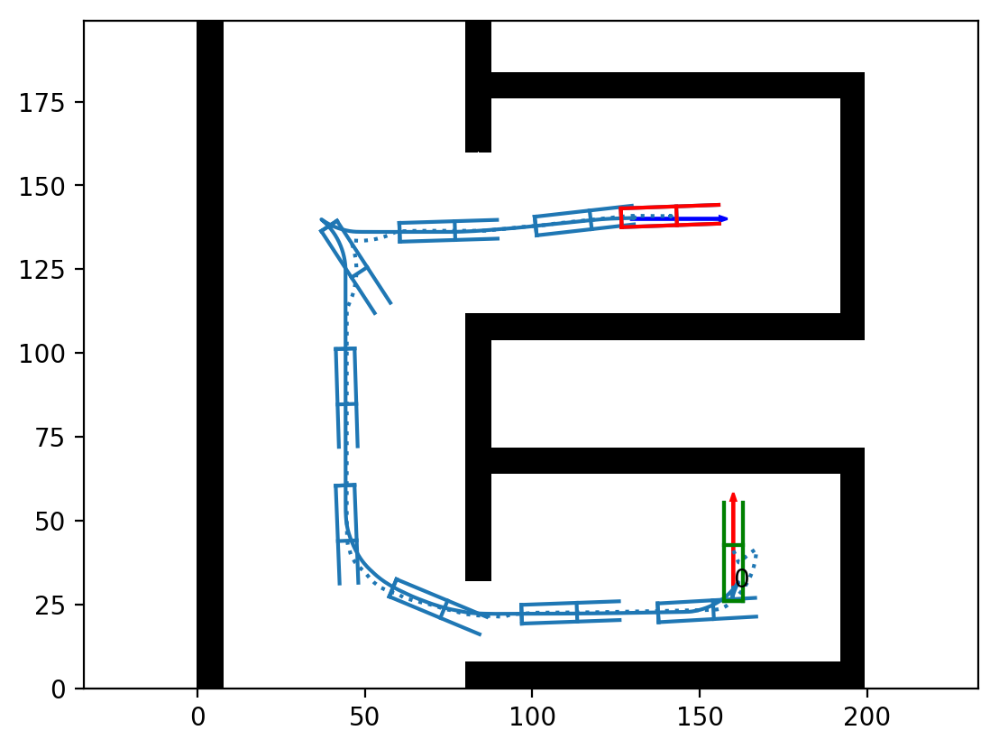

Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 3.900015354156494 seconds, and 330 iterations.
Post-Processing


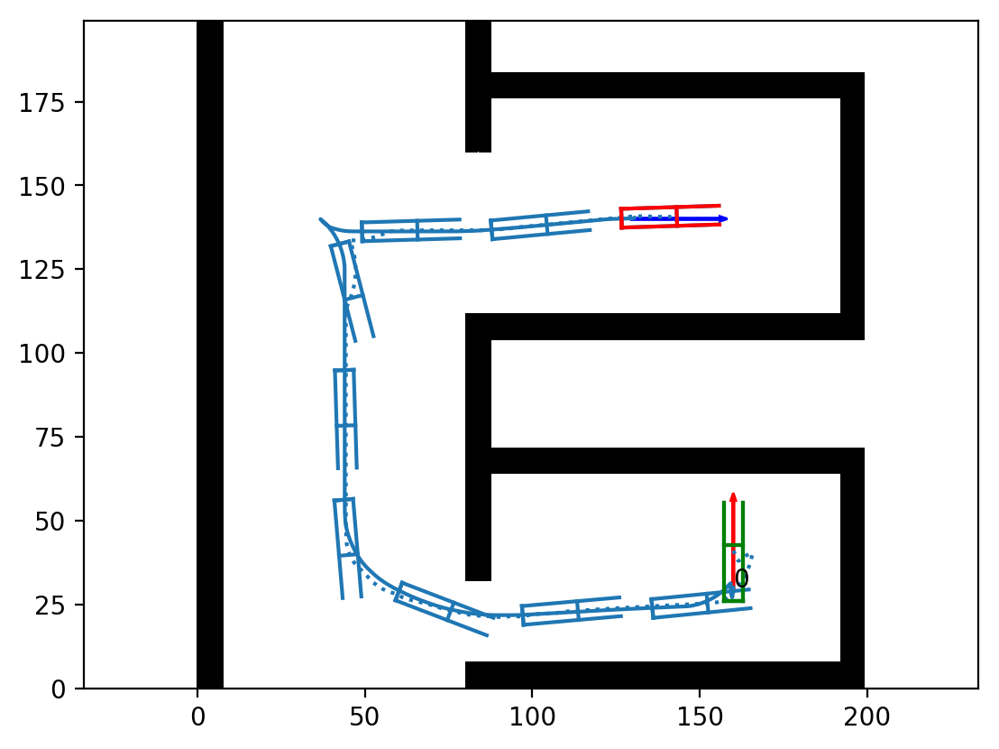

Run n° 2
[[-1.63046154  0.        ]
 [ 0.61507692  0.        ]
 [ 2.86061538  0.        ]
 [ 5.10615385  0.        ]
 [ 7.35169231  0.        ]
 [ 9.59723077  0.        ]
 [11.84276923  0.        ]
 [14.08830769  0.        ]
 [16.33384615  0.        ]
 [18.57938462  0.        ]
 [20.82492308  0.        ]
 [23.07046154  0.        ]]
3D obstacles calculation time: 1.2481322288513184 seconds
3D obstacles distances time: 0.5316071510314941 seconds
3D obstacles distances saturated time: 0.5544643402099609 seconds
Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 4.5541112422943115 seconds, and 312 iterations.
Post-Processing


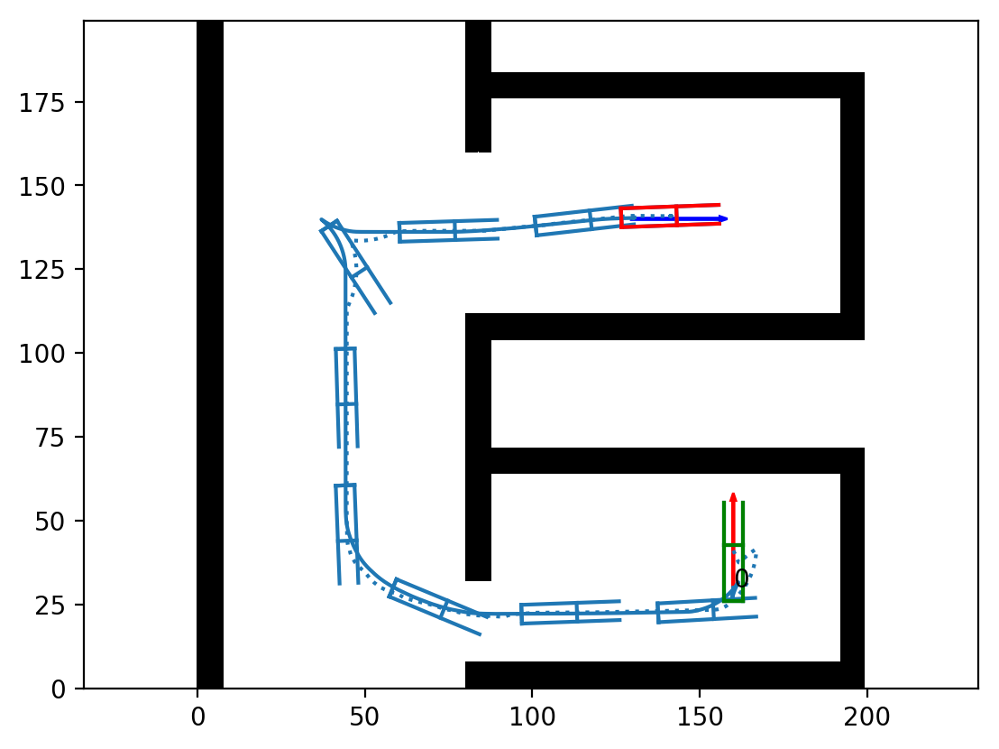

Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 5.888643741607666 seconds, and 329 iterations.
Post-Processing


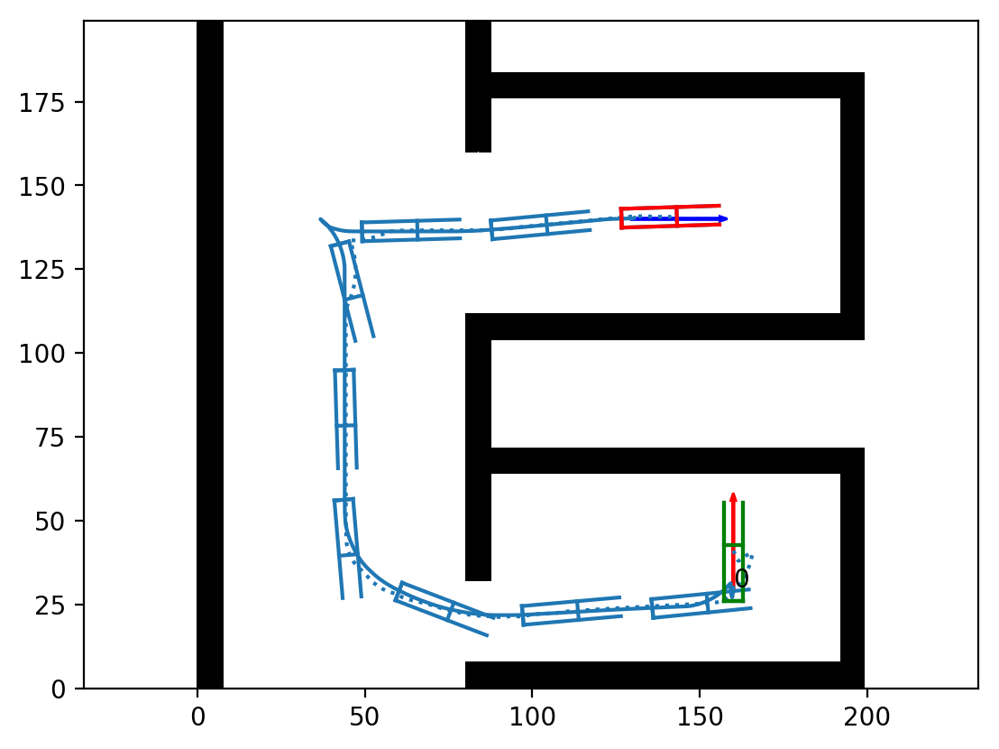

In [16]:
# Initialize result collections
runs = data["runs"]  # Extract benchmark runs from data
geos2WS = []         # Store 2-wheel steering results
geos4WS = []         # Store 4-wheel steering results
list_walls = []      # Store environment maps

# Process each benchmark environment
k = 0
for i in runs:
    k += 1
    print("Run n°", k)
    
    # Process environment data
    walls, X, walls_dist, Dxy, Nxy = extract_env(i)
    
    # Build 3D configuration space with multi-ball approximation
    walls3, walls3_dist, walls3_dist_saturated = build_3d(balls_number, walls_dist, Nxy, Dxy)
    
    # Extract grid dimensions
    Nx = Nxy[0]
    Ny = Nxy[1]
    
    # Extract start and goal configurations
    seed = xp.r_[i["environment"]["start"], 0]  # Append state index 0
    tips = xp.r_[i["environment"]["goal"], 0]   # Append state index 0
    
    # Initialize Fast Marching solver
    hfmIn0 = Eikonal.dictIn({
        'model':'DubinsState4',               # 4D model (x,y,θ,state)
        'seed': seed,                         # Starting configuration
        'tips': [tips],                       # Target configuration
        'origin': (0, 0, 0, -0.5),            # Domain origin
        'gridScales': (Dxy[0], Dxy[1], 2*np.pi/Nθ, 1),  # Grid spacing
        'periodic': [False, False, True, False],  # Angular periodicity
        'exportActiveNeighs': True,           # Export control data
        'verbosity': 1,                       # Output level
        'nitermax_o': 4000,                   # Maximum iterations
        'exportGeodesicFlow': True,           # Export flow field
        'exportValues': True,                 # Export value function
    })
    
    # Run 2WS planning (with parameters tuned for comparison)
    _, hfmOut1 = run_controls(
        hfmIn0.copy(),                        # Fresh solver instance
        Two_WS_complex_state(Θ, wheelbase_zoom, rev_ratio=0.5),  # 2WS controls
        fm2=1,                                # Obstacle cost weighting
        saturation=1.,                        # Use saturated distance
        state_transition_costs=1              # Low state transition cost
    )
    
    # Run 4WS planning (with identical parameters)
    _, hfmOut2 = run_controls(
        hfmIn0.copy(),                        # Fresh solver instance
        Four_WS_complex_state(Θ, wheelbase_zoom, rev_ratio=0.5),  # 4WS controls
        fm2=1,                                # Obstacle cost weighting
        saturation=1.,                        # Use saturated distance
        state_transition_costs=1              # Low state transition cost
    )
    
    # Extract and store results
    path = hfmOut1['geodesics'][0].T         # Extract 2WS path
    geos2WS.append(path.get())               # Store in CPU memory
    
    path = hfmOut2['geodesics'][0].T         # Extract 4WS path
    geos4WS.append(path.get())               # Store in CPU memory
    
    list_walls.append(walls)                 # Store environment map

## 4. Performance Evaluation 

After generating trajectories with both the 2-wheel steering (2WS) and 4-wheel steering (4WS) configurations, we need to quantitatively assess their performance. The relative advantages of each approach can be measured across multiple dimensions including path efficiency, smoothness, and safety.

### 4.1 Evaluation Metrics

We analyze the trajectories using several key metrics:

1. **Path Efficiency**
   - **Path Length**: Total distance traveled, measured in same units as the environment
2. **Path Smoothness**
   - **Angle Over Length (AOL)**: Total angular change divided by path length
   - **Maximum Curvature**: Highest rate of turning along the path
   - **Normalized Curvature**: Curvature scaled by path length for fair comparison
3. **Safety and Clearance**
   - **Minimum Clearing Distance**: Smallest distance to obstacles (critical safety parameter)
   - **Mean Clearing Distance**: Average clearance throughout the trajectory
   - **Median Clearing Distance**: Middle value of all clearance measurements
   - **Maximum Clearing Distance**: Greatest distance from obstacles

These metrics allow us to quantify the trade-offs between path efficiency, motion smoothness, and safety margins for different steering configurations.

In [17]:
# Initialize containers for reformatted trajectories
ngeo2 = []  # Will hold 2WS trajectories in visualization format
ngeo4 = []  # Will hold 4WS trajectories in visualization format

# Process each trajectory pair
for i in range(len(geos2WS)):
    # Process 2WS trajectory
    # 1. Extract x,y coordinates and orientation
    # 2. Apply orientation adjustment (add π)
    # 3. Stack vertically and transpose to get (N,3) format
    ngeo = np.vstack((geos2WS[i][:,0], geos2WS[i][:,1], geos2WS[i][:,2]+np.pi)).T
    ngeo2.append(ngeo)
    
    # Process 4WS trajectory (same procedure)
    ngeo = np.vstack((geos4WS[i][:,0], geos4WS[i][:,1], geos4WS[i][:,2]+np.pi)).T
    ngeo4.append(ngeo)

In [18]:
# Initialize placeholder variables
length_m = 0       # Not used in current implementation
max_curv_m = 0     # Not used in current implementation  
norm_curv_m = 0    # Not used in current implementation
aol_m = 0          # Not used in current implementation

# Create structured dictionary to store performance metrics
stats = {
    'StateHFM_2WS': {  # Metrics for 2-wheel steering implementation
        'path_length': [],              # Total trajectory length
        'aol': [],                      # Amount of linear motion (straightness)
        'normalized_curvature': [],     # Curvature normalized by path length
        'max_curvature': [],            # Maximum curvature along path
        'max_clearing_distance': [],    # Maximum distance to obstacles
        'mean_clearing_distance': [],   # Average distance to obstacles
        'median_clearing_distance': [], # Median distance to obstacles
        'min_clearing_distance': []     # Minimum distance to obstacles (safety metric)
    },
    'StateHFM_4WS': {  # Same metrics for 4-wheel steering implementation
        'path_length': [],
        'aol': [],
        'normalized_curvature': [],
        'max_curvature': [],
        'max_clearing_distance': [],
        'mean_clearing_distance': [],
        'median_clearing_distance': [],
        'min_clearing_distance': []
    }
}

# Process 2WS trajectories (using first 2 for quick analysis)
for i in range(2):  # Limiting to first 2 environments for demonstration
    # Calculate path metrics
    length = compute_path_length(geos2WS[i])                             # Total length
    max_curv, norm_curv = compute_curvature(geos2WS[i])                  # Curvature metrics
    aol = compute_aol(geos2WS[i])                                        # Amount of linear motion
    clearings = compute_clearing_distances(path=geos2WS[i],              # Obstacle clearances
                                          binary_map=list_walls[i].T)
    
    # Store metrics in stats dictionary
    stats['StateHFM_2WS']['path_length'].append(length)
    stats['StateHFM_2WS']['aol'].append(aol)
    stats['StateHFM_2WS']['normalized_curvature'].append(norm_curv)
    stats['StateHFM_2WS']['max_curvature'].append(max_curv)
    stats['StateHFM_2WS']['max_clearing_distance'].append(np.max(clearings))
    stats['StateHFM_2WS']['min_clearing_distance'].append(np.min(clearings))
    stats['StateHFM_2WS']['mean_clearing_distance'].append(np.mean(clearings))
    stats['StateHFM_2WS']['median_clearing_distance'].append(np.median(clearings))

# Process 4WS trajectories (same procedure)
for i in range(2):  # Limiting to first 2 environments for demonstration
    length = compute_path_length(geos4WS[i])
    max_curv, norm_curv = compute_curvature(geos4WS[i])
    aol = compute_aol(geos4WS[i])
    clearings = compute_clearing_distances(path=geos4WS[i], 
                                          binary_map=list_walls[i].T)
    
    stats['StateHFM_4WS']['path_length'].append(length)
    stats['StateHFM_4WS']['aol'].append(aol)
    stats['StateHFM_4WS']['normalized_curvature'].append(norm_curv)
    stats['StateHFM_4WS']['max_curvature'].append(max_curv)
    stats['StateHFM_4WS']['max_clearing_distance'].append(np.max(clearings))
    stats['StateHFM_4WS']['min_clearing_distance'].append(np.min(clearings))
    stats['StateHFM_4WS']['mean_clearing_distance'].append(np.mean(clearings))
    stats['StateHFM_4WS']['median_clearing_distance'].append(np.median(clearings))

Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RECKONING
Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RECKONING
Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RECKONING
Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RECKONING


         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/acc

Visualizing comparison_extend_functions_RC.json


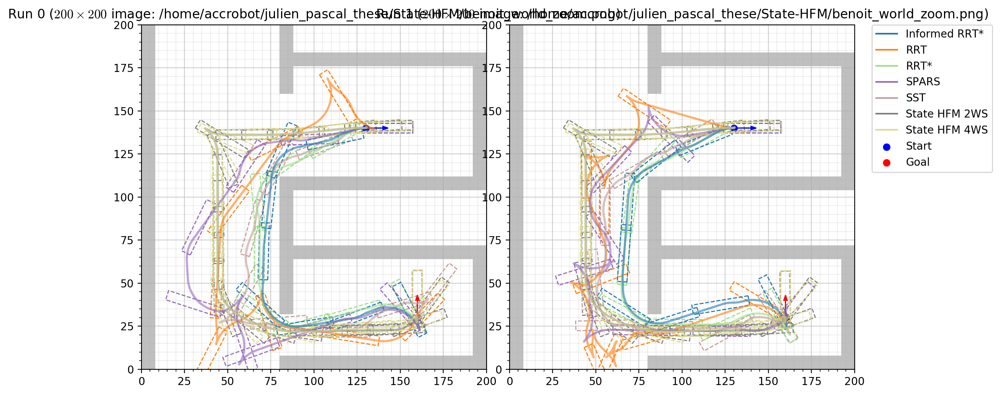

Visualizing comparison_extend_functions_RC.json...


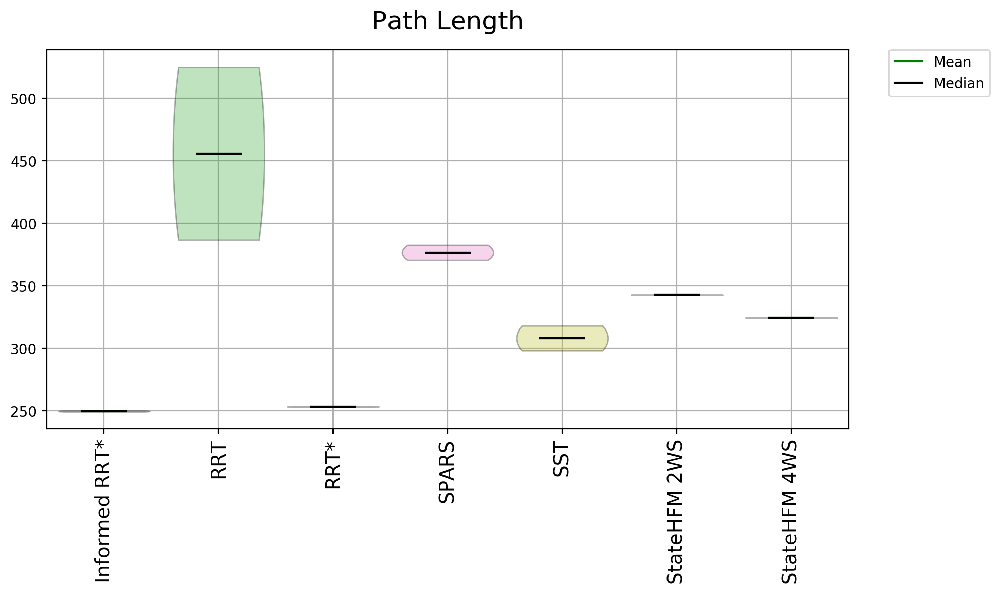

Visualizing comparison_extend_functions_RC.json...


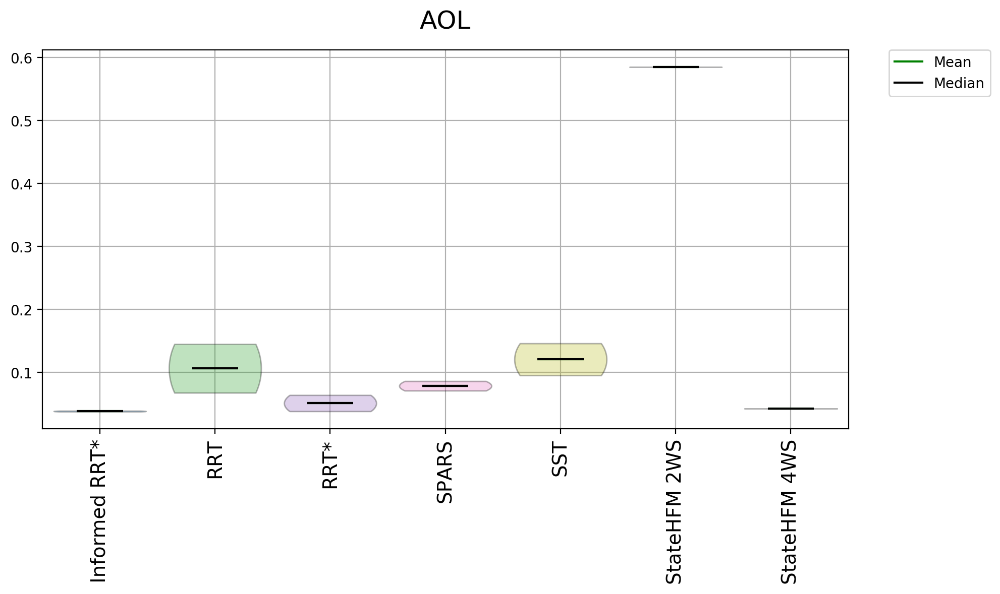

Visualizing comparison_extend_functions_RC.json...


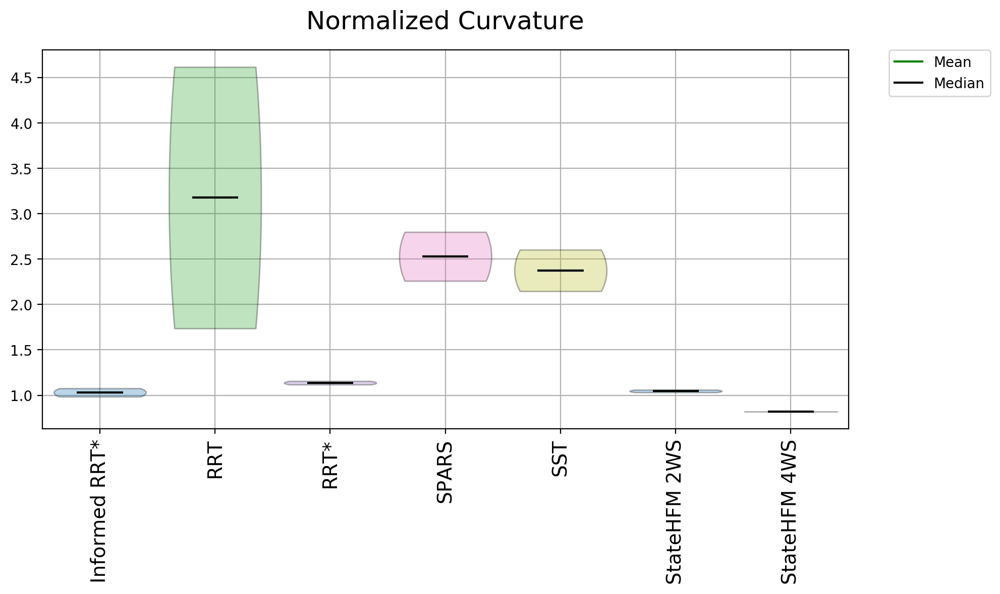

Visualizing comparison_extend_functions_RC.json...


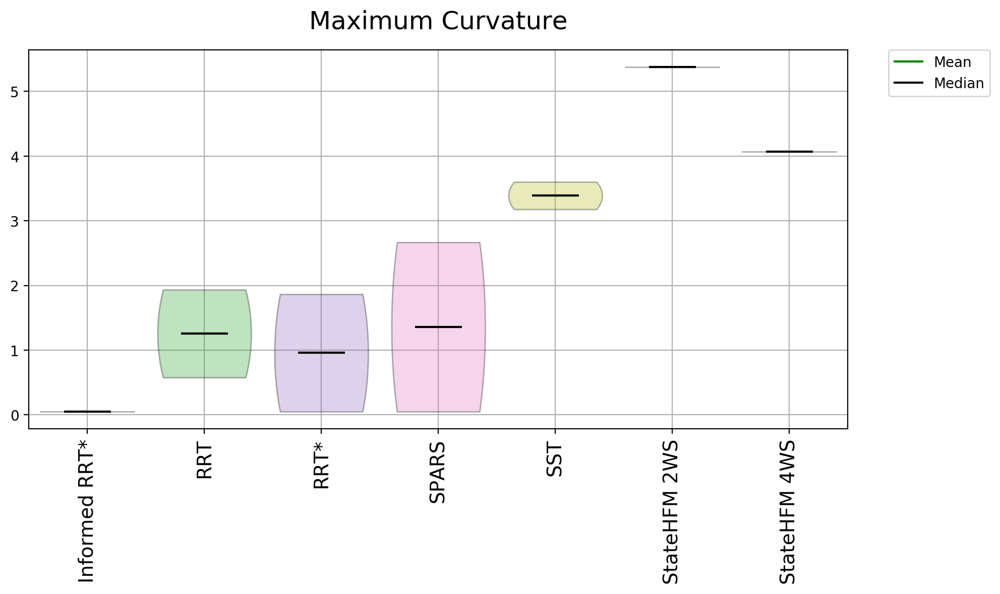

Visualizing comparison_extend_functions_RC.json...


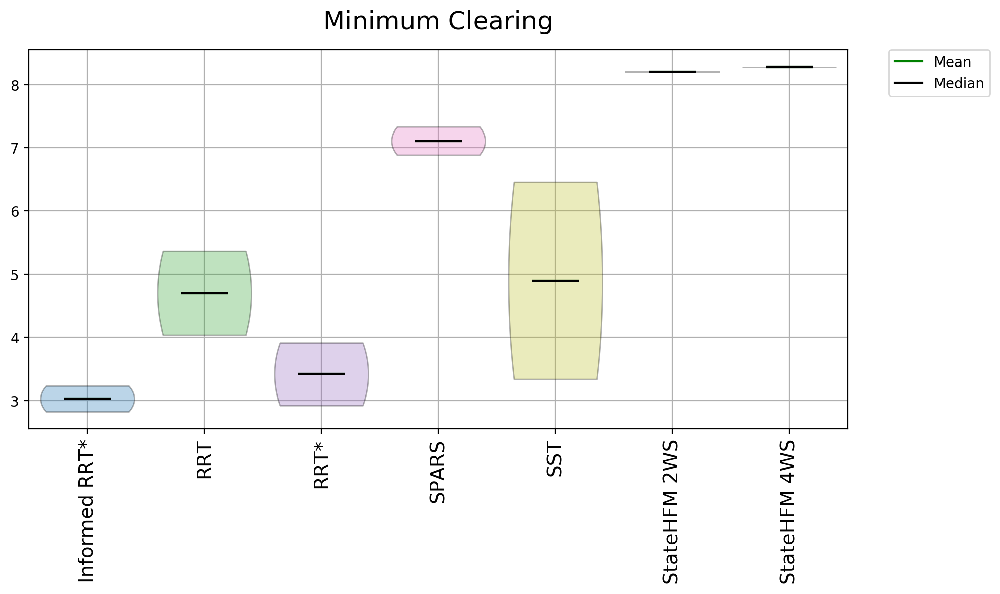

Visualizing comparison_extend_functions_RC.json...


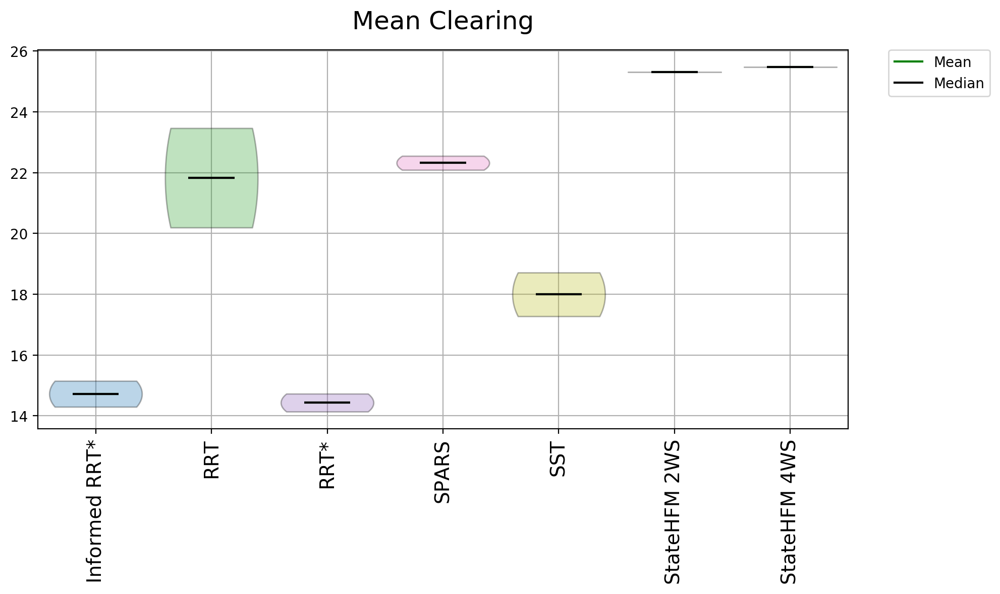

Visualizing comparison_extend_functions_RC.json...


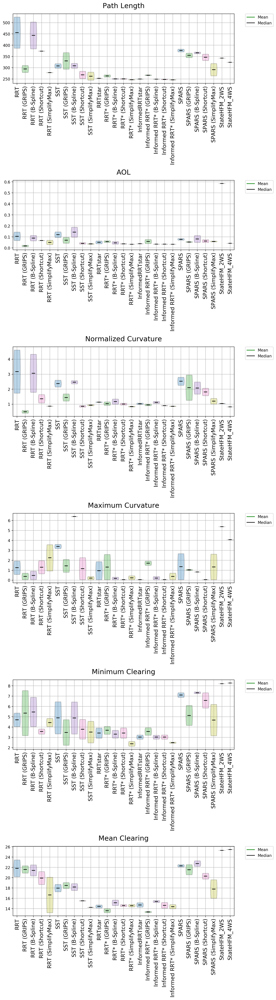

In [19]:
# Visualize trajectories from all planners in the environment
visualize(
    'comparison_extend_functions_RC.json',  # Benchmark results file
    additional_path=[ngeo2, ngeo4],         # Add our custom HFM paths
    plot_every_nth_polygon=60,              # Reduce density for clarity
    draw_start_goal_thetas=True             # Show orientation at endpoints
)


# Detailed analysis of path length performance
plot_planner_stats(
    'comparison_extend_functions_RC.json',
    custom_stats=stats,
    metrics='path_length',                  # Focus on path efficiency
    max_plots_per_line=1,
    combine_views=True,
    plot_violins=True,
    fig_width=10,
    fig_height=6
)

# Analysis of angle of inclination (AOL) - motion smoothness
plot_planner_stats(
    'comparison_extend_functions_RC.json',
    custom_stats=stats,
    metrics='aol',                          # Focus on path smoothness
    max_plots_per_line=1,
    combine_views=True,
    plot_violins=True,
    fig_width=10,
    fig_height=6
)

# Analysis of normalized curvature - balance of turns vs. straight segments
plot_planner_stats(
    'comparison_extend_functions_RC.json',
    custom_stats=stats,
    metrics='normalized_curvature',         # Focus on turn distribution
    max_plots_per_line=1,
    combine_views=True,
    plot_violins=True,
    fig_width=10,
    fig_height=6
)

# Analysis of maximum curvature - sharpest turns required
plot_planner_stats(
    'comparison_extend_functions_RC.json',
    custom_stats=stats,
    metrics='max_curvature',                # Focus on maneuverability requirements
    max_plots_per_line=1,
    combine_views=True,
    plot_violins=True,
    fig_width=10,
    fig_height=6
)

# Analysis of minimum clearing distance - safety margins
plot_planner_stats(
    'comparison_extend_functions_RC.json',
    custom_stats=stats,
    metrics='min_clearing_distance',        # Focus on collision safety
    max_plots_per_line=1,
    combine_views=True,
    plot_violins=True,
    fig_width=10,
    fig_height=6
)

# Analysis of mean clearing distance - overall obstacle avoidance
plot_planner_stats(
    'comparison_extend_functions_RC.json',
    custom_stats=stats,
    metrics='mean_clearing_distance',       # Focus on general obstacle avoidance
    max_plots_per_line=1,
    combine_views=True,
    plot_violins=True,
    fig_width=10,
    fig_height=6
)

# Comparison of post-smoothing performance
plot_smoother_stats(
    'comparison_extend_functions_RC.json',
    custom_stats=stats,
    # Compare across multiple metrics after smoothing
    metrics='path_length, aol, normalized_curvature, max_curvature, min_clearing_distance, mean_clearing_distance',
    max_plots_per_line=1,
    combine_views=True,
    plot_violins=True,
    fig_width=10,
    fig_height=6
)

# Display all figures
plt.show()

### 4.2 Comparative Results Analysis

The benchmark results demonstrate several key advantages of our State-HFM approach over sampling-based methods. In terms of path efficiency, State-HFM (both 2WS and 4WS variants) produces trajectories with competitive lengths, though not always the shortest. The 4WS implementation consistently outperforms its 2WS counterpart in those tight spaces.

For path smoothness, State-HFM excels with lower normalized curvature and AOL values, indicating more natural driving patterns. While State-HFM shows higher maximum curvature values, these occur at specific deliberate turning points rather than throughout the trajectory.

Most notably, State-HFM significantly outperforms in safety metrics, with minimum clearing distances up to twice those of sampling-based methods. This advantage is crucial for industrial applications where collision avoidance is paramount.

Finally, unlike sampling-based approaches that show significant variance across runs, State-HFM delivers consistent, deterministic results - an essential feature for predictable industrial operations.

## 5. Procedural Environment Testing

To establish the robustness and generalizability of our findings, we extend our evaluation beyond fixed test environments to include procedurally generated scenarios. This approach provides several key advantages over testing in predefined environments alone. By generating multiple randomized environments with controlled parameters, we can systematically evaluate how different path planning algorithms perform across a diverse range of spatial configurations while maintaining reproducibility through fixed random seeds.

Unlike manually designed test cases that might inadvertently favor certain algorithmic approaches, procedurally generated environments offer an unbiased testbed that better approximates the variety of situations encountered in real-world applications. These environments feature varying corridor widths, junction configurations, and obstacle arrangements that challenge different aspects of the planning algorithms' capabilities.

In the following sections, we configure the procedural environment generator, run our benchmark suite across these environments, and apply our State-HFM implementation under identical conditions to enable direct comparison with sampling-based approaches. This comprehensive evaluation showcase the consistency, adaptability, and relative performance of different planning strategies across diverse environmental conditions.

### 5.1 Environment generation settings

In [20]:
# Set scaling and discretization parameters
zoom_factor = 2  # Scale factor to match robot dimensions to environment grid
rlength = 3.6490 # Robot length in meters
rwidth = 0.7     # Robot width in meters
wheelbase = 1.38 # Distance between front and rear axles
offset = np.array([0.4845, 0])  # Position of rear axle center along robot length

# Compute scaled dimensions for planning
rlength_zoom = rlength * zoom_factor
rwidth_zoom = rwidth * zoom_factor
wheelbase_zoom = wheelbase * zoom_factor
offset_zoom = offset * zoom_factor

In [21]:
# Create benchmark configuration function
def create_mpb_procedural_envs(planner: str, extend_function: str, wheelbase_zoom, planning_time):
    """Create Motion Planning Benchmark configuration.
    
    This function configures a standardized benchmark environment for comparing
    path planning approaches. It sets up MPB to evaluate path planners in corridor-like
    procedurally generated environments with consistent parameters.
    
    Args:
        planner (str): Name of planning algorithm to test
        extend_function (str): Steering function type ('reeds_shepp' etc.)
        wheelbase_zoom (float): Scaled wheelbase length for robot model
        planning_time (float): Maximum allowed planning time in seconds
    
    Returns:
        MPB: Configured benchmark object
    """
    # Initialize benchmark object
    mpb = MPB()
    
    # Set core planning parameters
    mpb["ompl.seed"] = 5  # Fixed seed for reproducibility
    mpb["max_planning_time"] = planning_time
    
    # Configure planner and steering
    mpb.set_planners([planner])
    mpb.set_steer_functions([extend_function])
    
    # Set vehicle model parameters
    mpb["steer.car_turning_radius"] = wheelbase_zoom/(np.tan(0.5))
    mpb["steer.allow_backward_motion"] = True  # Enable reverse motion
    
    # Setup procedural environment
    mpb.set_corridor_grid_env(                           # Create corridor-like environment
        200, 200,                                       # Environment size (200×200)
        branches=100,                                   # Number of corridor branches
        radius=8                                        # Corridor width
    )
    
    # Set robot shape 
    current_dir = os.path.abspath(os.getcwd())
    bot_path = os.path.join(current_dir, "bot.svg")
    
    mpb["env.collision.collision_model"] = 1
    mpb["env.collision.robot_shape_source"] = bot_path
    
    # Set benchmark identifier
    mpb.set_id('comparison_extend_function_%s_%s' % (planner, extend_function))
    
    # Configure path smoothing options
    mpb.set_smoothers([
        'grips',
        'ompl_bspline',
        'ompl_shortcut',
        'ompl_simplify_max'
    ])
    
    # Set start and goal configurations
    mpb.set_goal(160, 30, np.pi/2)  # Goal position and orientation
    mpb.set_start(130, 140, 0)      # Start position and orientation
    
    return mpb

### 5.2 Running the benchmark

This section executes the benchmark comparison of multiple state-of-the-art path planning algorithms using the configuration established in the previous subsection. We evaluate the same sampling-based planners as before but on new procedurally generated environments

Available memory: 11.40 GB, limiting each MPB process to 31.2% usage (3.56 GB).
Creating pool of 5 processes.
Running MPB with ID comparison_extend_function_rrt_star_reeds_shepp (log file at RC/comparison_extend_function_rrt_star_reeds_shepp.log)...Running MPB with ID comparison_extend_function_sst_reeds_shepp (log file at RC/comparison_extend_function_sst_reeds_shepp.log)...Running MPB with ID comparison_extend_function_spars_reeds_shepp (log file at RC/comparison_extend_function_spars_reeds_shepp.log)...Running MPB with ID comparison_extend_function_rrt_reeds_shepp (log file at RC/comparison_extend_function_rrt_reeds_shepp.log)...Running MPB with ID comparison_extend_function_informed_rrt_star_reeds_shepp (log file at RC/comparison_extend_function_informed_rrt_star_reeds_shepp.log)...






comparison_extend_function_rrt_reeds_shepp:   0%|          | 0/20 [00:00<?, ?it/s]

comparison_extend_function_rrt_star_reeds_shepp:   0%|          | 0/20 [00:00<?, ?it/s]

comparison_extend_function_spars_reeds_shepp:   0%|          | 0/20 [00:00<?, ?it/s]

comparison_extend_function_sst_reeds_shepp:   0%|          | 0/20 [00:00<?, ?it/s]

comparison_extend_function_informed_rrt_star_reeds_shepp:   0%|          | 0/20 [00:00<?, ?it/s]

Benchmark 0 (comparison_extend_function_rrt_reeds_shepp) finished successfully.
Benchmark 4 (comparison_extend_function_spars_reeds_shepp) finished successfully.
Benchmark 2 (comparison_extend_function_rrt_star_reeds_shepp) finished successfully.
Benchmark 3 (comparison_extend_function_informed_rrt_star_reeds_shepp) finished successfully.
Benchmark 1 (comparison_extend_function_sst_reeds_shepp) finished successfully.
All benchmarks succeeded.
Successfully merged [RC/comparison_extend_function_rrt_reeds_shepp_results.json, RC/comparison_extend_function_sst_reeds_shepp_results.json, RC/comparison_extend_function_rrt_star_reeds_shepp_results.json, RC/comparison_extend_function_informed_rrt_star_reeds_shepp_results.json, RC/comparison_extend_function_spars_reeds_shepp_results.json] into comparison_extend_functions_RC_procedural.json.


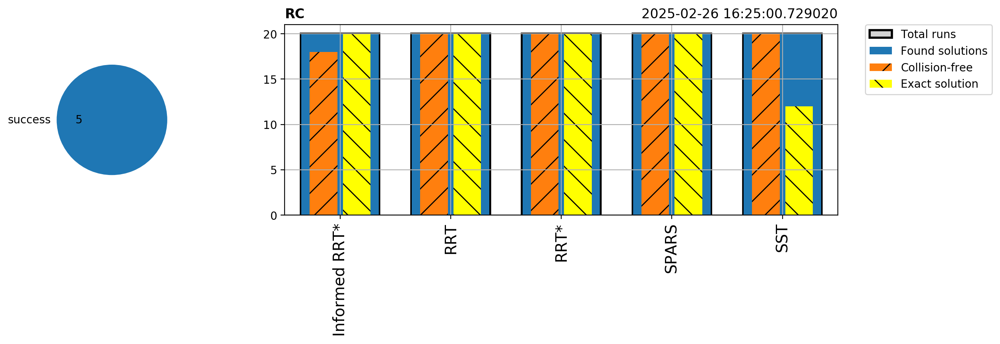

In [22]:
# Initialize parallel benchmark pool
pool = MultipleMPB()

# Define planners to compare
planners = [
    'rrt',              # Basic RRT
    'sst',              # Stable Sparse RRT
    'rrt_star',         # RRT*
    'informed_rrt_star', # Informed RRT*
    'spars'             # Sparse Roadmap
]

# Add each planner to the benchmark pool
for planner in planners:
    pool.benchmarks.append(
        create_mpb_procedural_envs(
            planner=planner,
            extend_function='reeds_shepp',
            wheelbase_zoom=wheelbase_zoom,
            planning_time=15
        )
    )

# Run benchmarks in parallel with multiple trials
pool.run_parallel(runs=20, id='RC', show_plot=True)

# Merge results into single output file
pool.merge('comparison_extend_functions_RC_procedural.json')

Visualizing comparison_extend_functions_RC_procedural.json


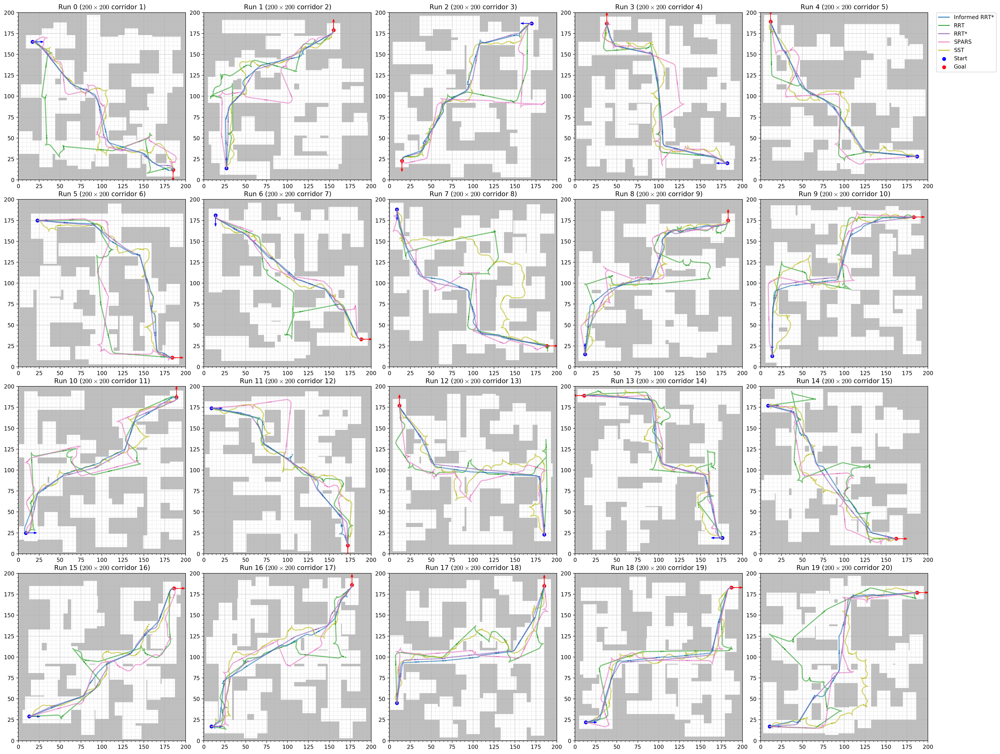

In [23]:
# Visualize paths with robot configurations
visualize(
    'comparison_extend_functions_RC_procedural.json',
    plot_every_nth_polygon=60,
    draw_start_goal_thetas=True
)

Visualizing comparison_extend_functions_RC_procedural.json...


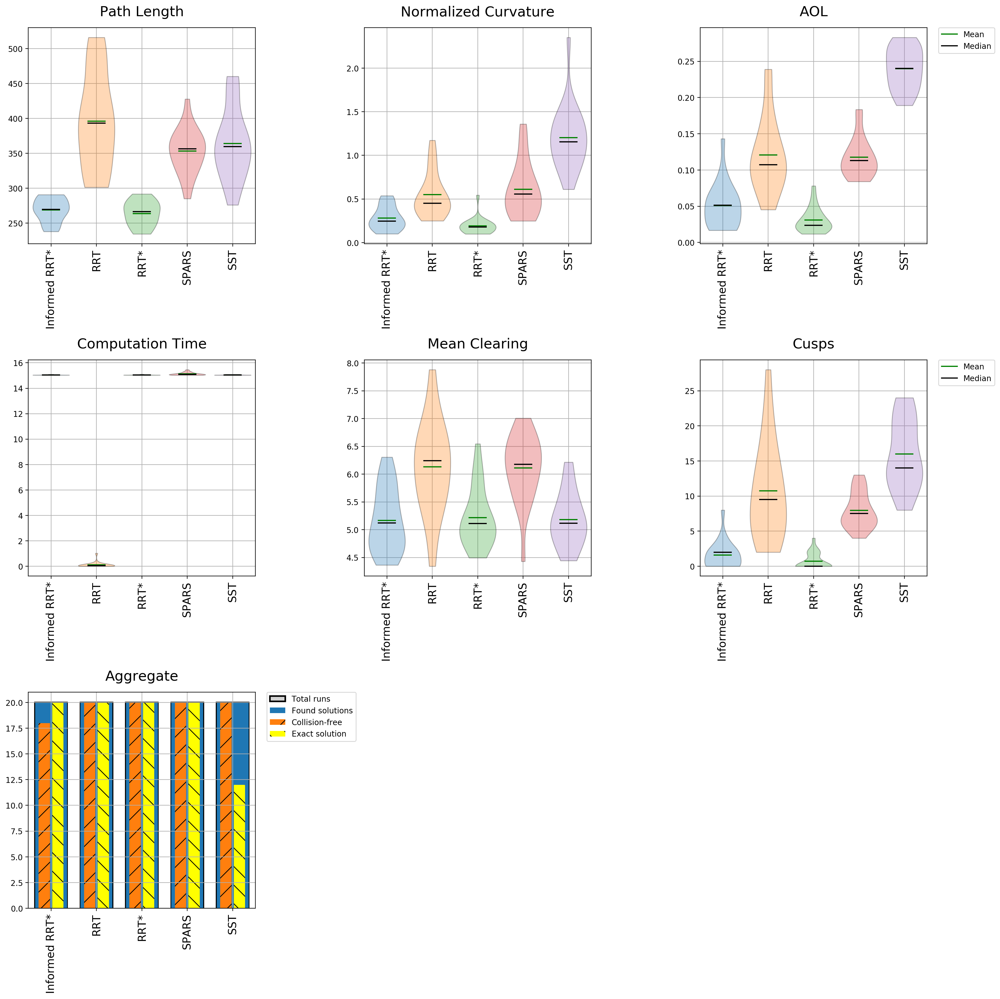

In [24]:
# Generate statistical analysis plots
plot_planner_stats(
    'comparison_extend_functions_RC_procedural.json',
    num_colors=10
)

### 5.3 State-HFM configuration and execution

In this section, we apply our State-HFM algorithm to the procedurally generated environments, maintaining the same parameters and configuration approach used in the earlier benchmark to ensure fair comparison. We execute both 2WS and 4WS variants across all test scenarios to systematically evaluate their performance characteristics in these diverse environments.

In [25]:
Nθ = 100  # Number of angular discretization points
Θ = np.linspace(0,2*np.pi,Nθ,endpoint=False)

balls_number = 12

In [26]:
data = json.load(open('comparison_extend_functions_RC_procedural.json', "r"))

walls3, walls3_dist, walls3_dist_saturated = build_3d(balls_number, walls_dist,Nxy,Dxy)

[[-0.40761538  0.        ]
 [ 0.15376923  0.        ]
 [ 0.71515385  0.        ]
 [ 1.27653846  0.        ]
 [ 1.83792308  0.        ]
 [ 2.39930769  0.        ]
 [ 2.96069231  0.        ]
 [ 3.52207692  0.        ]
 [ 4.08346154  0.        ]
 [ 4.64484615  0.        ]
 [ 5.20623077  0.        ]
 [ 5.76761538  0.        ]]
3D obstacles calculation time: 1.2875022888183594 seconds
3D obstacles distances time: 0.5262875556945801 seconds
3D obstacles distances saturated time: 0.516110897064209 seconds


Run n° 1
[[-0.40761538  0.        ]
 [ 0.15376923  0.        ]
 [ 0.71515385  0.        ]
 [ 1.27653846  0.        ]
 [ 1.83792308  0.        ]
 [ 2.39930769  0.        ]
 [ 2.96069231  0.        ]
 [ 3.52207692  0.        ]
 [ 4.08346154  0.        ]
 [ 4.64484615  0.        ]
 [ 5.20623077  0.        ]
 [ 5.76761538  0.        ]]
3D obstacles calculation time: 1.2347338199615479 seconds
3D obstacles distances time: 0.5498011112213135 seconds
3D obstacles distances saturated time: 0.5591082572937012 seconds
Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 5.3463475704193115 seconds, and 339 iterations.
Post-Processing


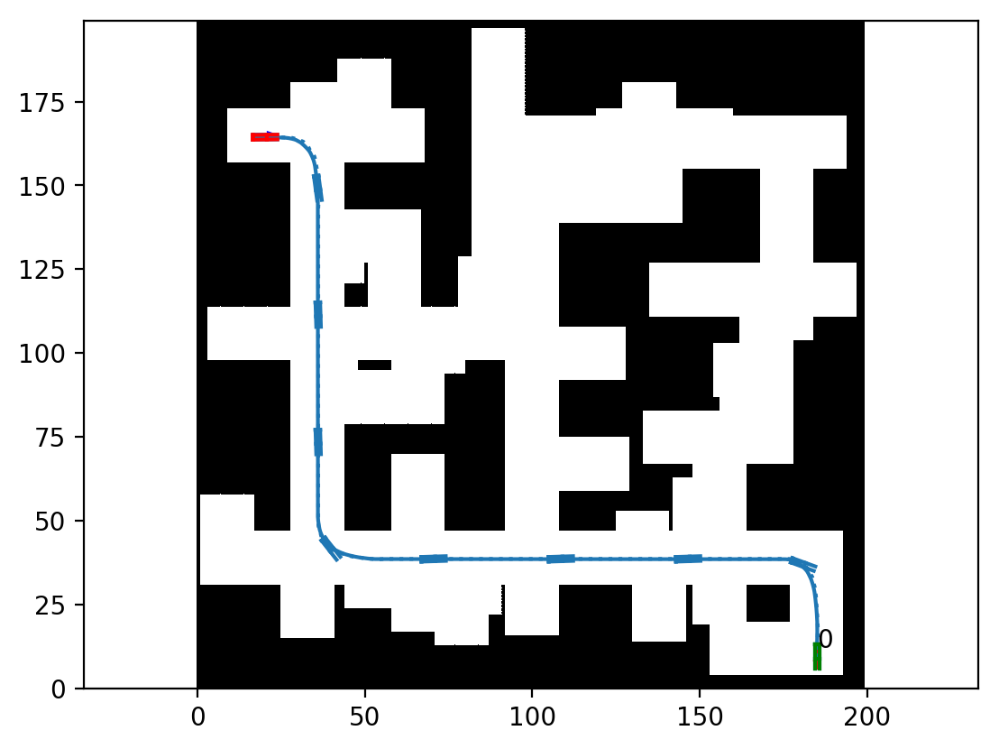

Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 4.608543634414673 seconds, and 369 iterations.
Post-Processing


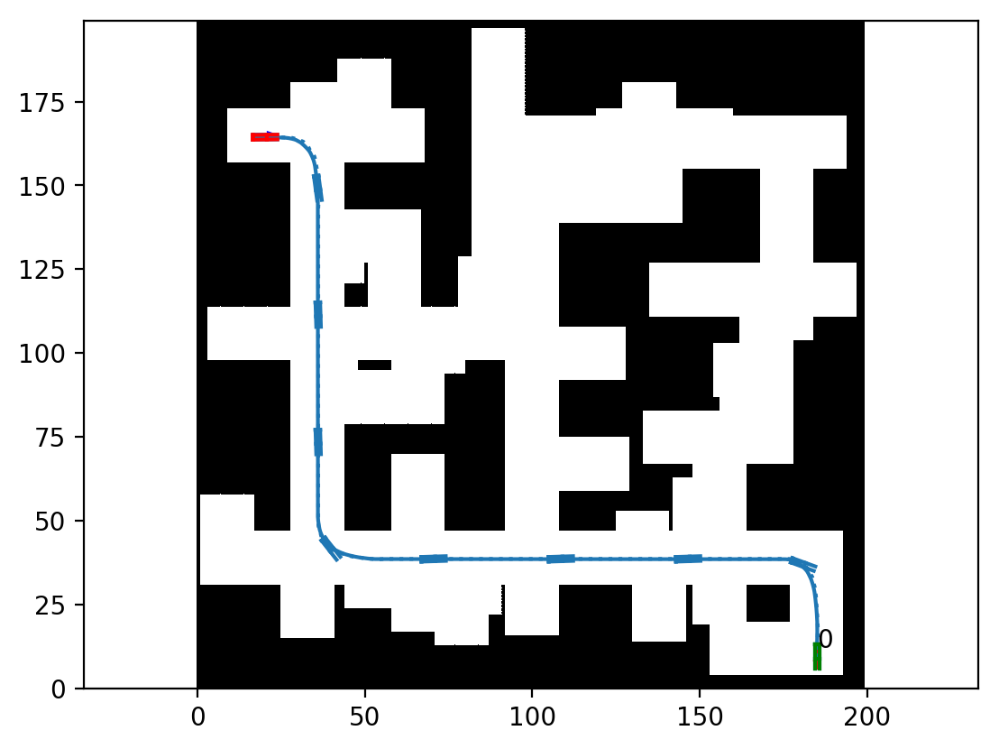

Run n° 2
[[-0.40761538  0.        ]
 [ 0.15376923  0.        ]
 [ 0.71515385  0.        ]
 [ 1.27653846  0.        ]
 [ 1.83792308  0.        ]
 [ 2.39930769  0.        ]
 [ 2.96069231  0.        ]
 [ 3.52207692  0.        ]
 [ 4.08346154  0.        ]
 [ 4.64484615  0.        ]
 [ 5.20623077  0.        ]
 [ 5.76761538  0.        ]]
3D obstacles calculation time: 1.3562712669372559 seconds
3D obstacles distances time: 0.5311052799224854 seconds
3D obstacles distances saturated time: 0.5479843616485596 seconds
Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 5.4096457958221436 seconds, and 317 iterations.
Post-Processing


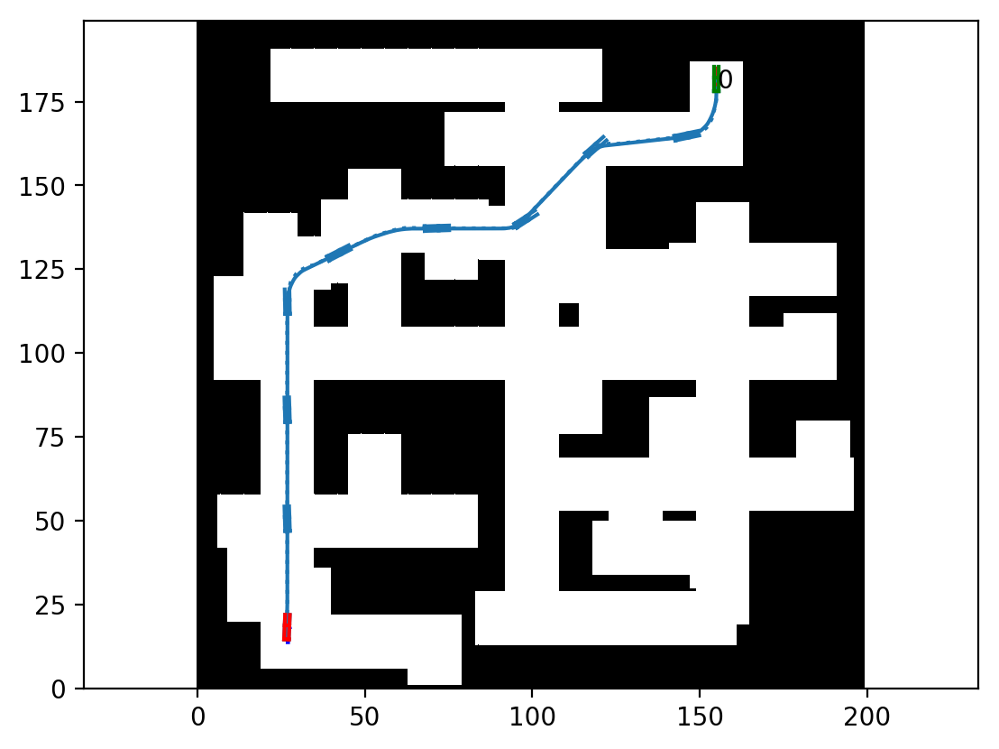

Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 4.901400327682495 seconds, and 343 iterations.
Post-Processing


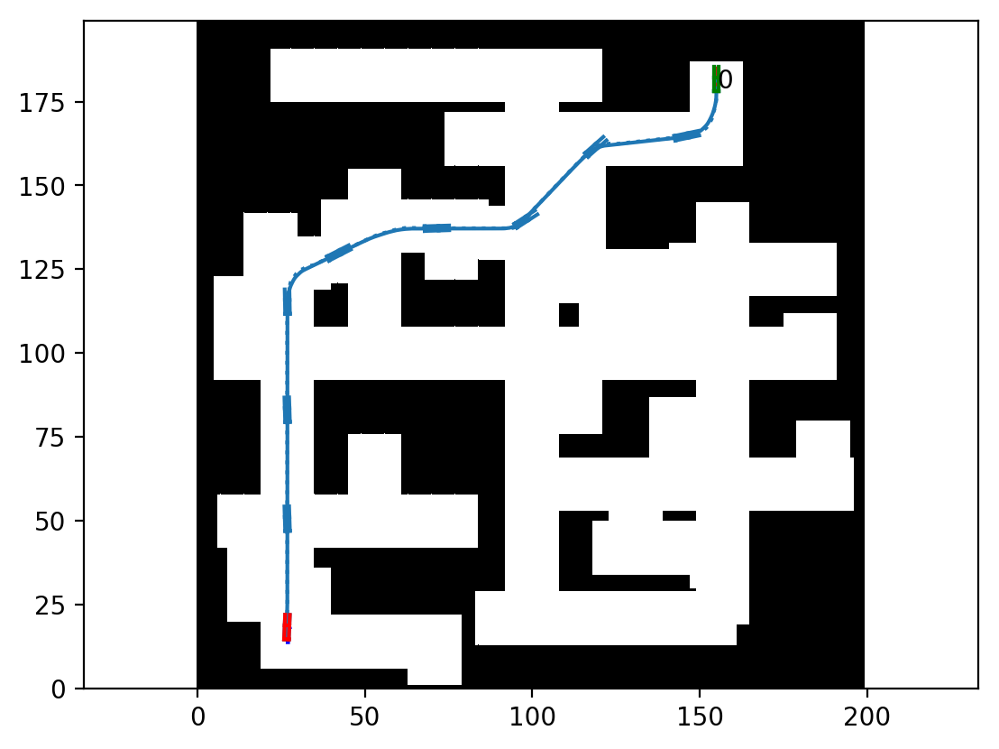

Run n° 3
[[-0.40761538  0.        ]
 [ 0.15376923  0.        ]
 [ 0.71515385  0.        ]
 [ 1.27653846  0.        ]
 [ 1.83792308  0.        ]
 [ 2.39930769  0.        ]
 [ 2.96069231  0.        ]
 [ 3.52207692  0.        ]
 [ 4.08346154  0.        ]
 [ 4.64484615  0.        ]
 [ 5.20623077  0.        ]
 [ 5.76761538  0.        ]]
3D obstacles calculation time: 1.323538064956665 seconds
3D obstacles distances time: 0.5630717277526855 seconds
3D obstacles distances saturated time: 0.5483005046844482 seconds
Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 6.321647644042969 seconds, and 334 iterations.
Post-Processing


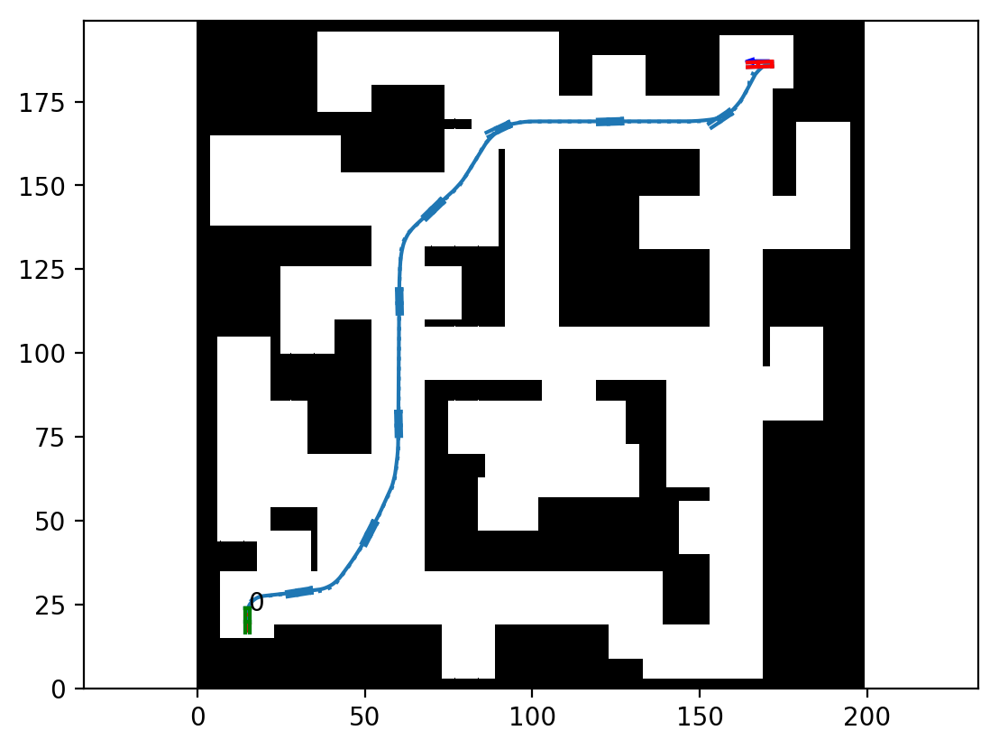

Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 5.412150621414185 seconds, and 357 iterations.
Post-Processing


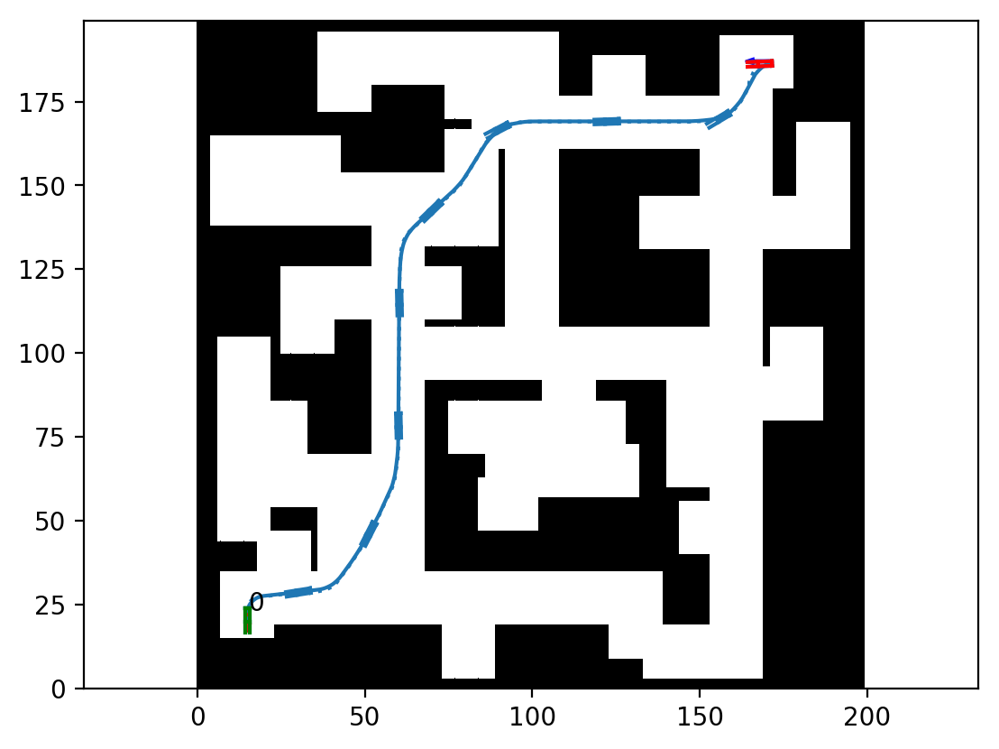

Run n° 4
[[-0.40761538  0.        ]
 [ 0.15376923  0.        ]
 [ 0.71515385  0.        ]
 [ 1.27653846  0.        ]
 [ 1.83792308  0.        ]
 [ 2.39930769  0.        ]
 [ 2.96069231  0.        ]
 [ 3.52207692  0.        ]
 [ 4.08346154  0.        ]
 [ 4.64484615  0.        ]
 [ 5.20623077  0.        ]
 [ 5.76761538  0.        ]]
3D obstacles calculation time: 1.2396659851074219 seconds
3D obstacles distances time: 0.5740127563476562 seconds
3D obstacles distances saturated time: 0.5608847141265869 seconds
Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 6.7159600257873535 seconds, and 370 iterations.
Post-Processing


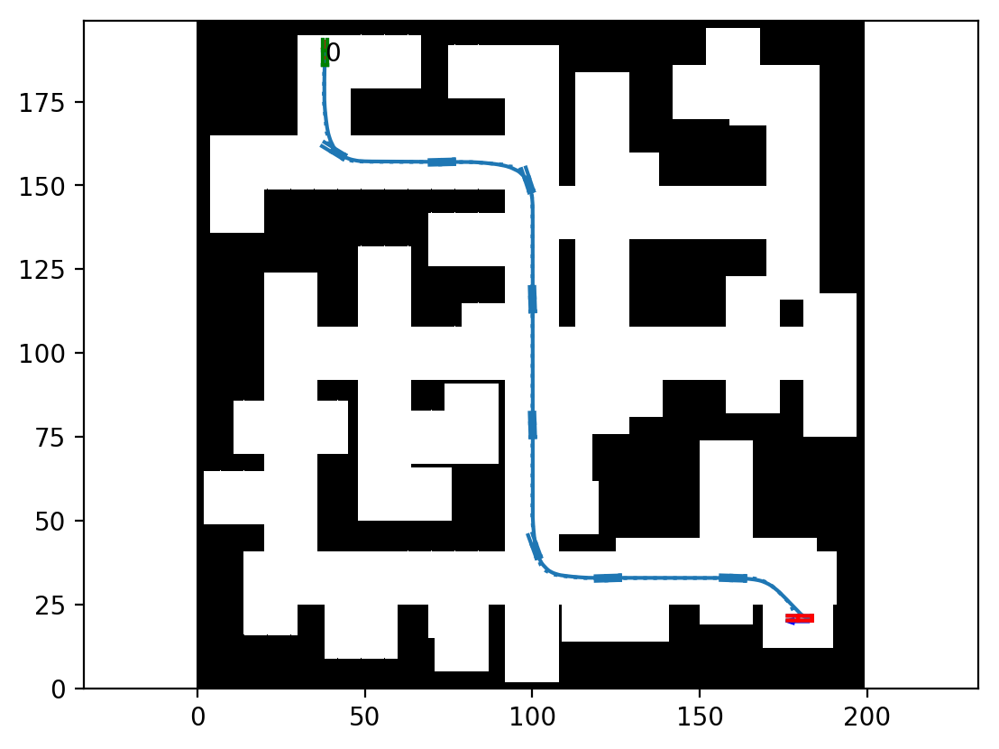

Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 5.74876070022583 seconds, and 394 iterations.
Post-Processing


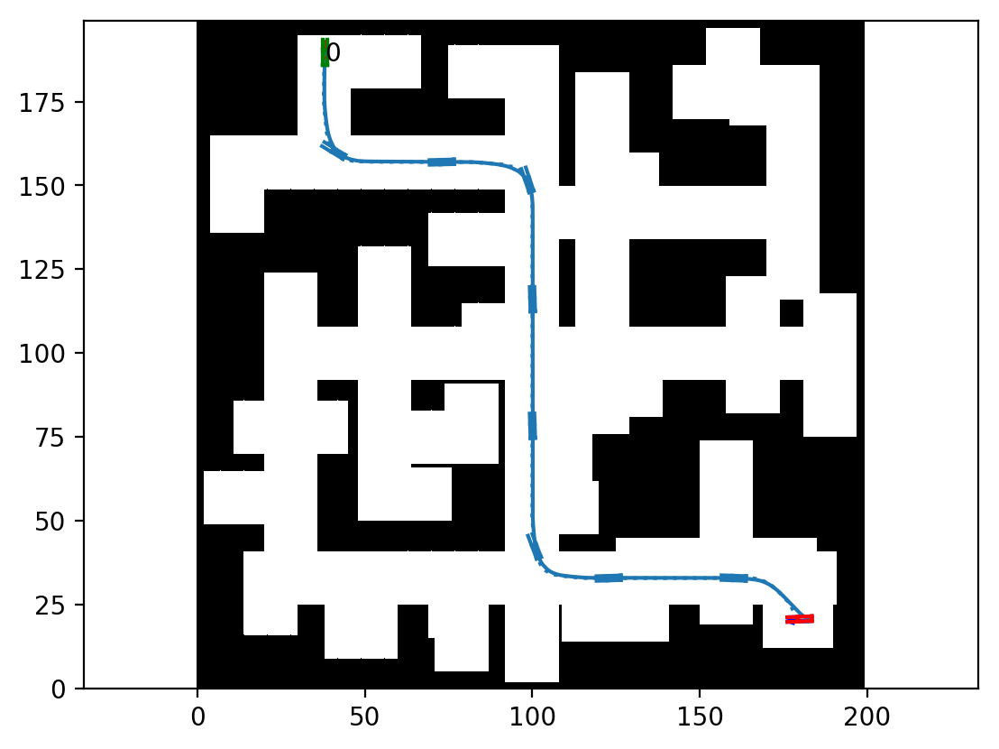

Run n° 5
[[-0.40761538  0.        ]
 [ 0.15376923  0.        ]
 [ 0.71515385  0.        ]
 [ 1.27653846  0.        ]
 [ 1.83792308  0.        ]
 [ 2.39930769  0.        ]
 [ 2.96069231  0.        ]
 [ 3.52207692  0.        ]
 [ 4.08346154  0.        ]
 [ 4.64484615  0.        ]
 [ 5.20623077  0.        ]
 [ 5.76761538  0.        ]]
3D obstacles calculation time: 1.3196797370910645 seconds
3D obstacles distances time: 0.5856573581695557 seconds
3D obstacles distances saturated time: 0.5389611721038818 seconds
Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 5.186801195144653 seconds, and 317 iterations.
Post-Processing


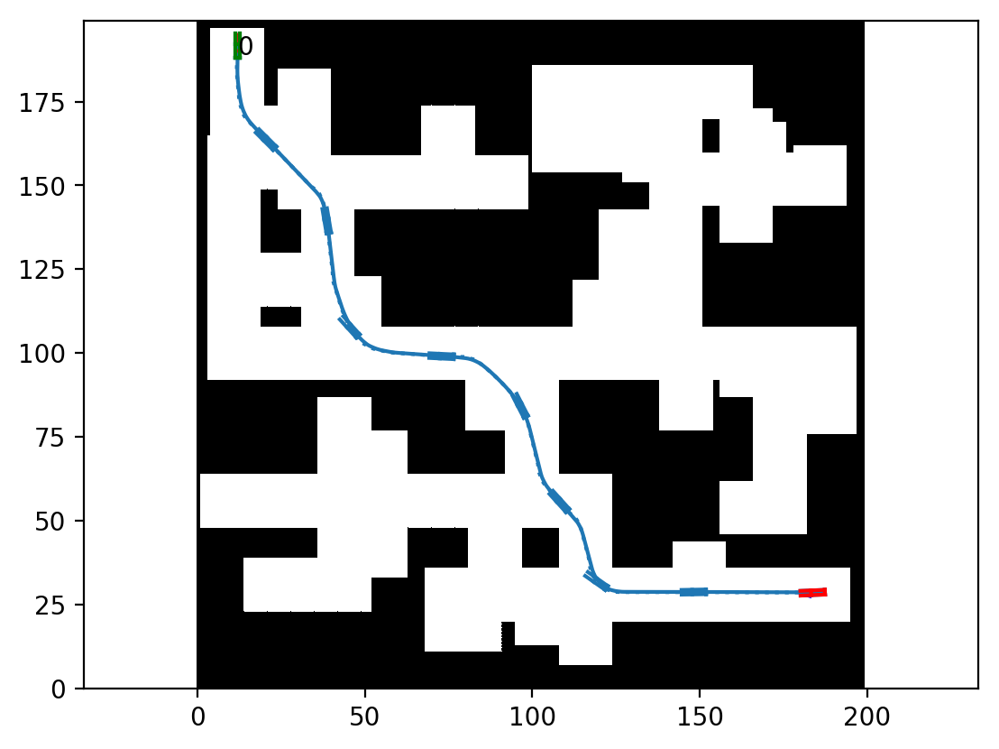

Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 4.559326887130737 seconds, and 333 iterations.
Post-Processing


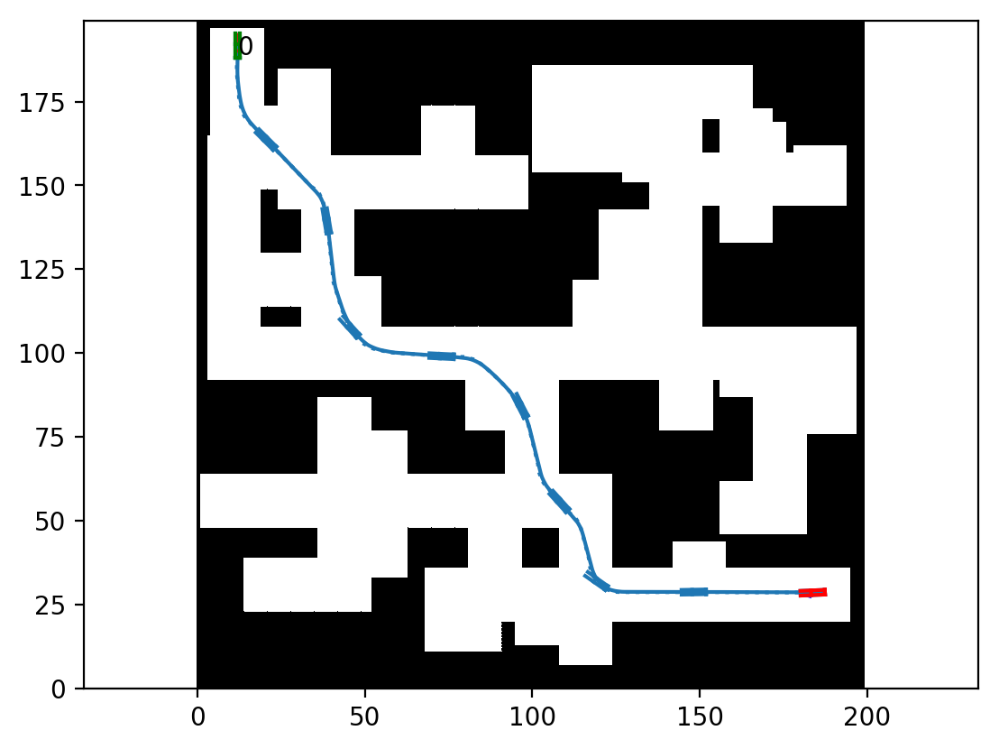

Run n° 6
[[-0.40761538  0.        ]
 [ 0.15376923  0.        ]
 [ 0.71515385  0.        ]
 [ 1.27653846  0.        ]
 [ 1.83792308  0.        ]
 [ 2.39930769  0.        ]
 [ 2.96069231  0.        ]
 [ 3.52207692  0.        ]
 [ 4.08346154  0.        ]
 [ 4.64484615  0.        ]
 [ 5.20623077  0.        ]
 [ 5.76761538  0.        ]]
3D obstacles calculation time: 1.2573225498199463 seconds
3D obstacles distances time: 0.5682611465454102 seconds
3D obstacles distances saturated time: 0.5639669895172119 seconds
Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 6.121079921722412 seconds, and 340 iterations.
Post-Processing


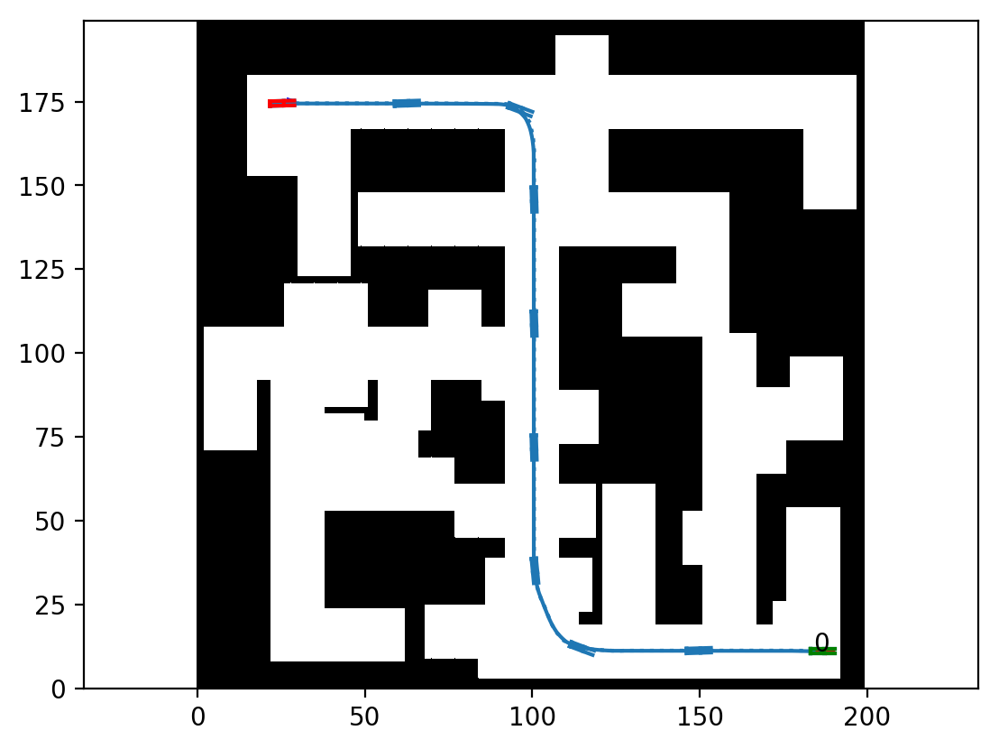

Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 5.111539363861084 seconds, and 377 iterations.
Post-Processing


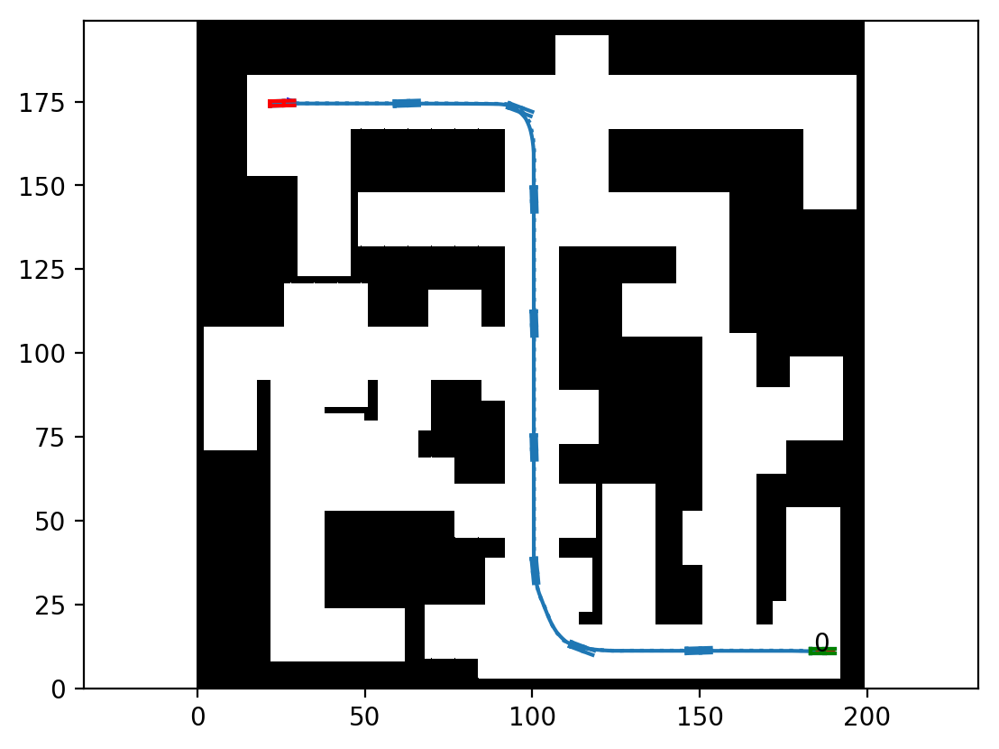

Run n° 7
[[-0.40761538  0.        ]
 [ 0.15376923  0.        ]
 [ 0.71515385  0.        ]
 [ 1.27653846  0.        ]
 [ 1.83792308  0.        ]
 [ 2.39930769  0.        ]
 [ 2.96069231  0.        ]
 [ 3.52207692  0.        ]
 [ 4.08346154  0.        ]
 [ 4.64484615  0.        ]
 [ 5.20623077  0.        ]
 [ 5.76761538  0.        ]]
3D obstacles calculation time: 1.2678537368774414 seconds
3D obstacles distances time: 0.5988390445709229 seconds
3D obstacles distances saturated time: 0.556328296661377 seconds
Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 6.2141687870025635 seconds, and 335 iterations.
Post-Processing


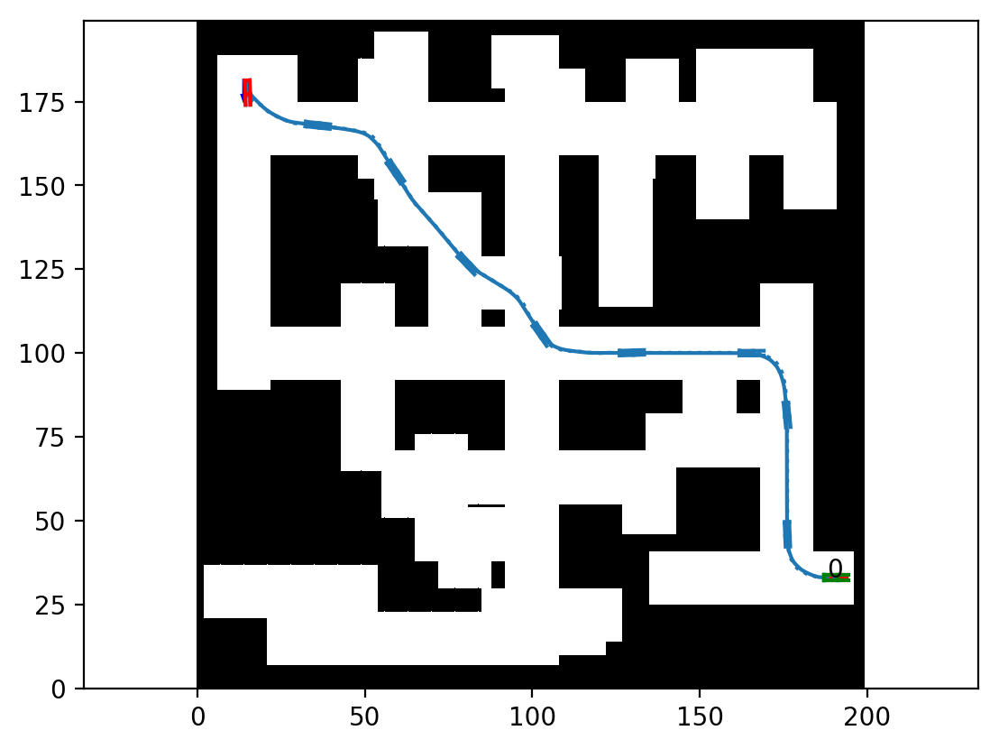

Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 5.206997632980347 seconds, and 366 iterations.
Post-Processing


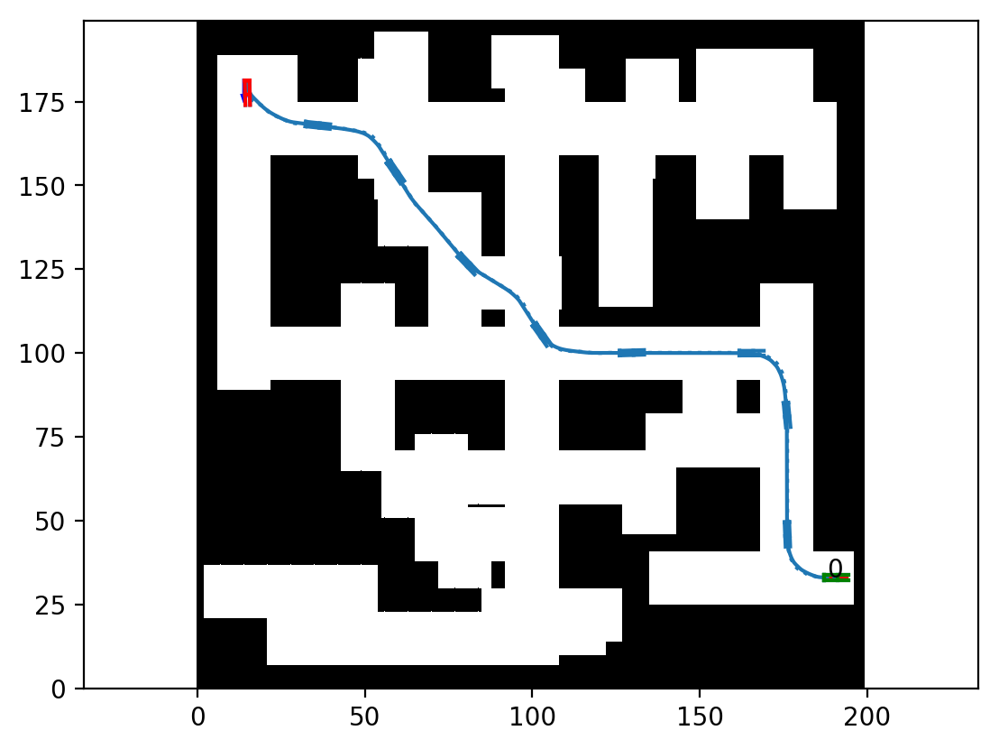

Run n° 8
[[-0.40761538  0.        ]
 [ 0.15376923  0.        ]
 [ 0.71515385  0.        ]
 [ 1.27653846  0.        ]
 [ 1.83792308  0.        ]
 [ 2.39930769  0.        ]
 [ 2.96069231  0.        ]
 [ 3.52207692  0.        ]
 [ 4.08346154  0.        ]
 [ 4.64484615  0.        ]
 [ 5.20623077  0.        ]
 [ 5.76761538  0.        ]]
3D obstacles calculation time: 1.226668357849121 seconds
3D obstacles distances time: 0.5572493076324463 seconds
3D obstacles distances saturated time: 0.520186185836792 seconds
Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 5.775353908538818 seconds, and 333 iterations.
Post-Processing


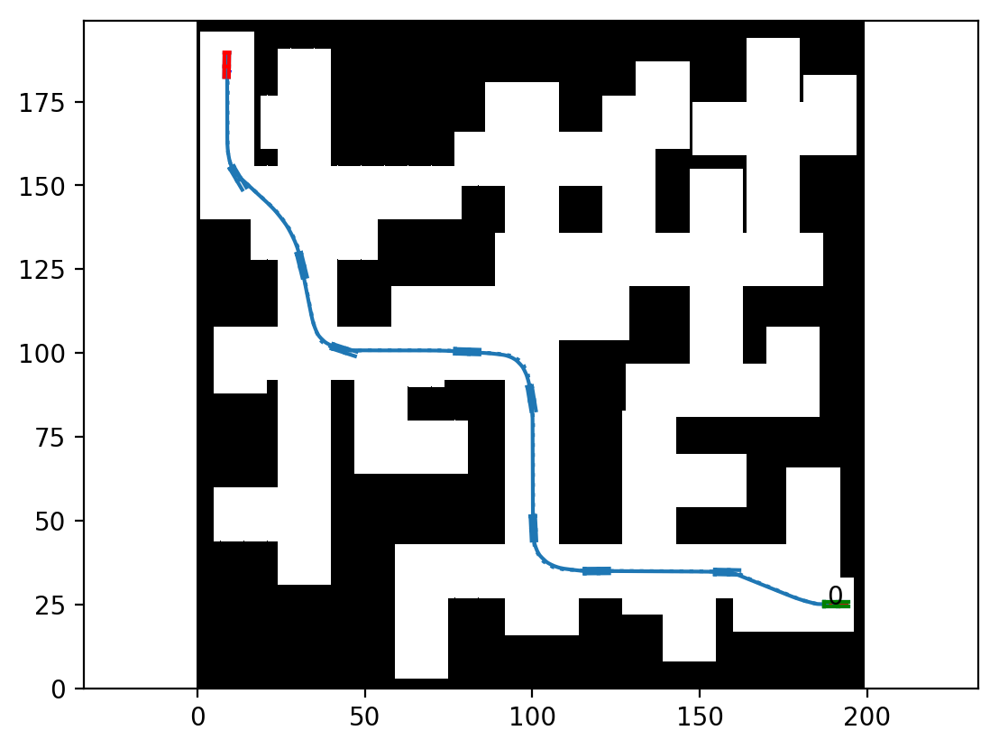

Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 4.984330415725708 seconds, and 349 iterations.
Post-Processing


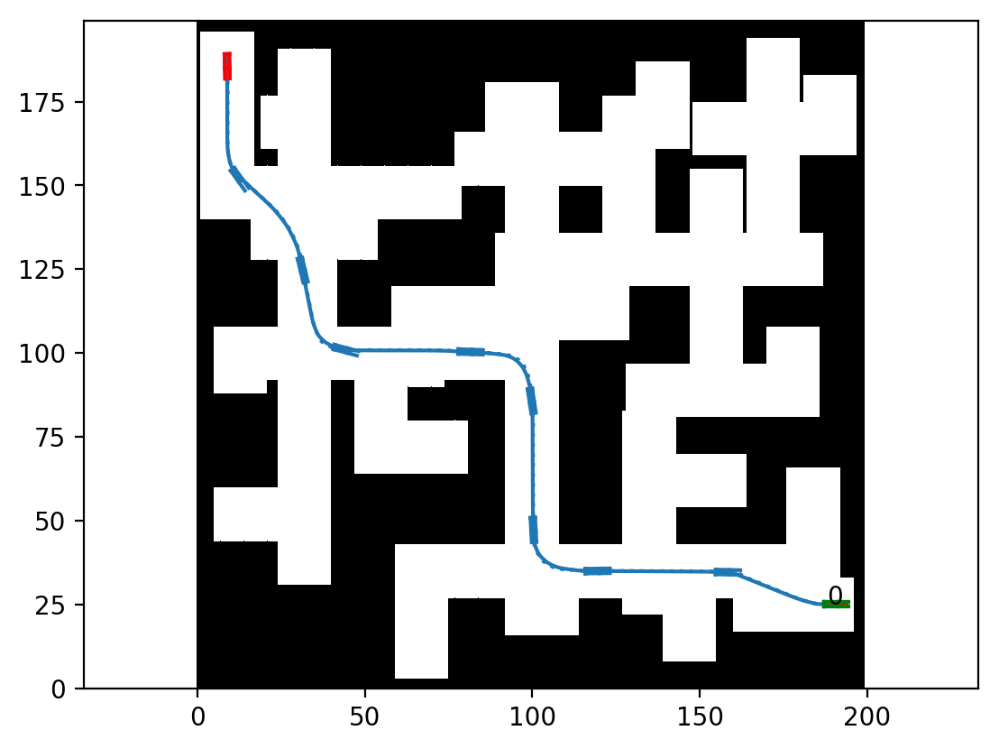

Run n° 9
[[-0.40761538  0.        ]
 [ 0.15376923  0.        ]
 [ 0.71515385  0.        ]
 [ 1.27653846  0.        ]
 [ 1.83792308  0.        ]
 [ 2.39930769  0.        ]
 [ 2.96069231  0.        ]
 [ 3.52207692  0.        ]
 [ 4.08346154  0.        ]
 [ 4.64484615  0.        ]
 [ 5.20623077  0.        ]
 [ 5.76761538  0.        ]]
3D obstacles calculation time: 1.1501400470733643 seconds
3D obstacles distances time: 0.4745030403137207 seconds
3D obstacles distances saturated time: 0.4843153953552246 seconds
Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 4.957507610321045 seconds, and 320 iterations.
Post-Processing


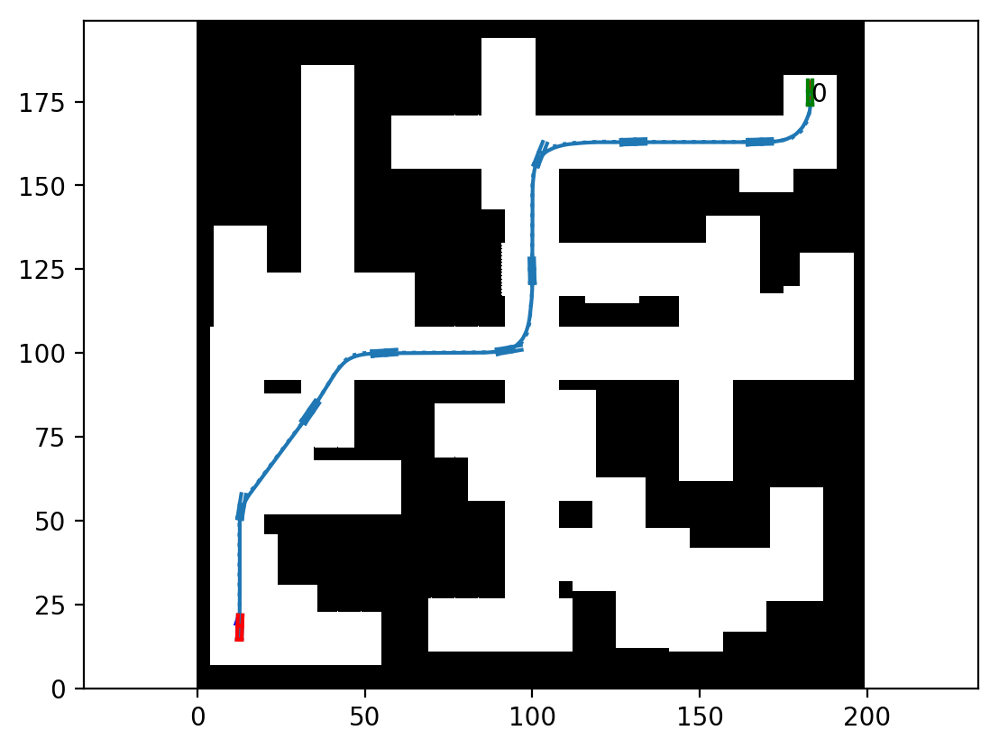

Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 4.393944501876831 seconds, and 332 iterations.
Post-Processing


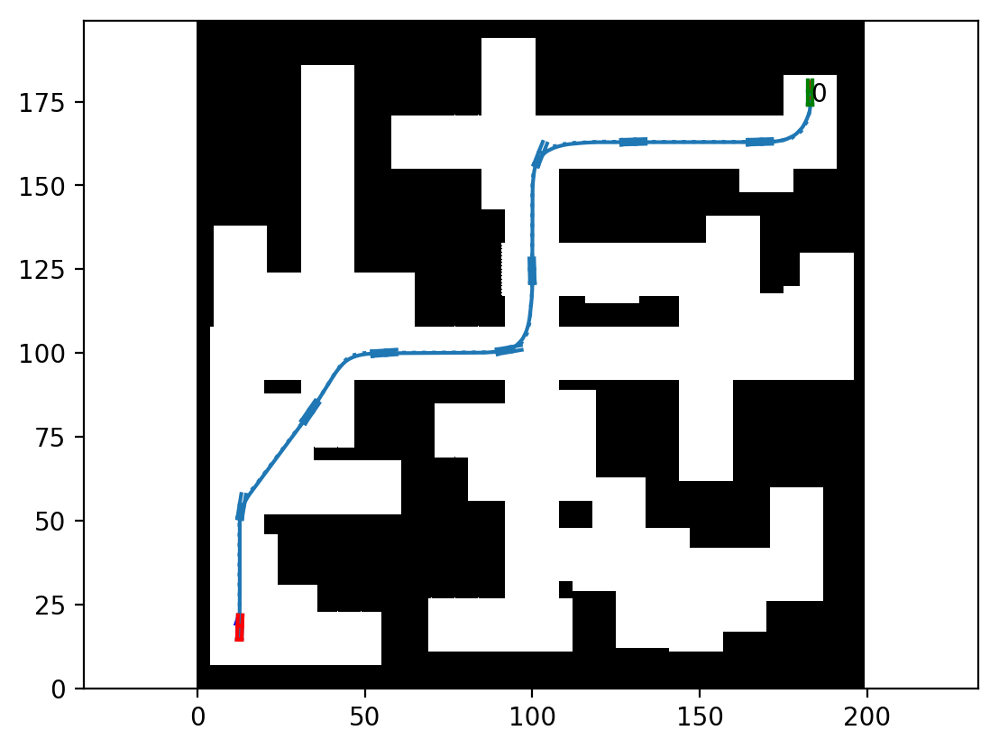

Run n° 10
[[-0.40761538  0.        ]
 [ 0.15376923  0.        ]
 [ 0.71515385  0.        ]
 [ 1.27653846  0.        ]
 [ 1.83792308  0.        ]
 [ 2.39930769  0.        ]
 [ 2.96069231  0.        ]
 [ 3.52207692  0.        ]
 [ 4.08346154  0.        ]
 [ 4.64484615  0.        ]
 [ 5.20623077  0.        ]
 [ 5.76761538  0.        ]]
3D obstacles calculation time: 1.3016808032989502 seconds
3D obstacles distances time: 0.5816864967346191 seconds
3D obstacles distances saturated time: 0.5938394069671631 seconds
Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 5.868690252304077 seconds, and 344 iterations.
Post-Processing


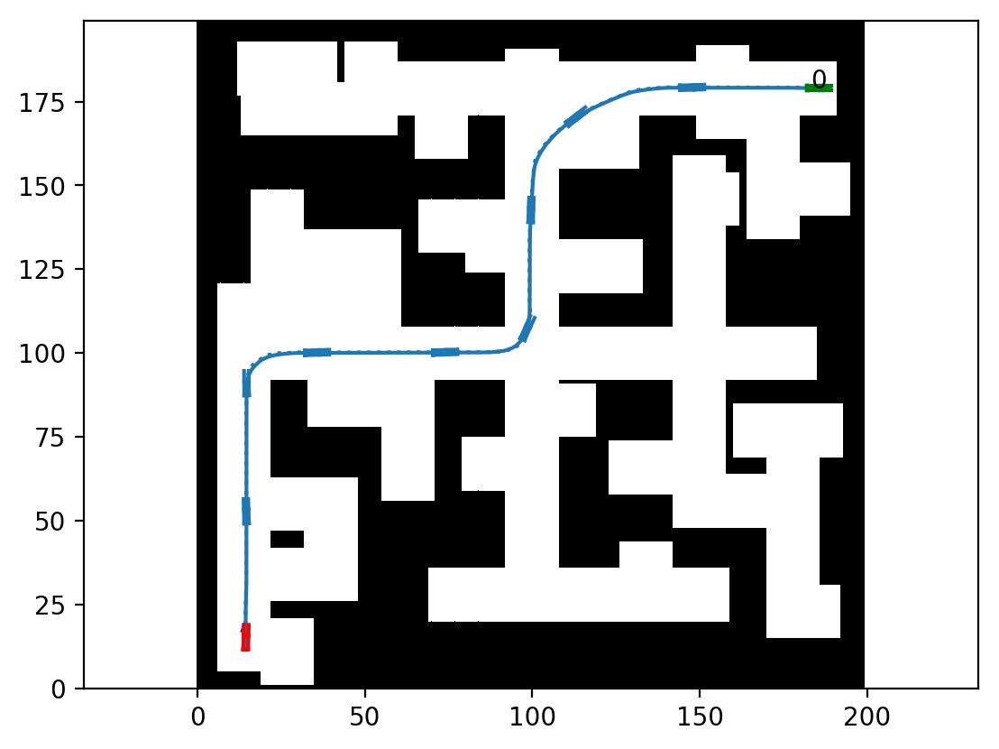

Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 5.1394712924957275 seconds, and 366 iterations.
Post-Processing


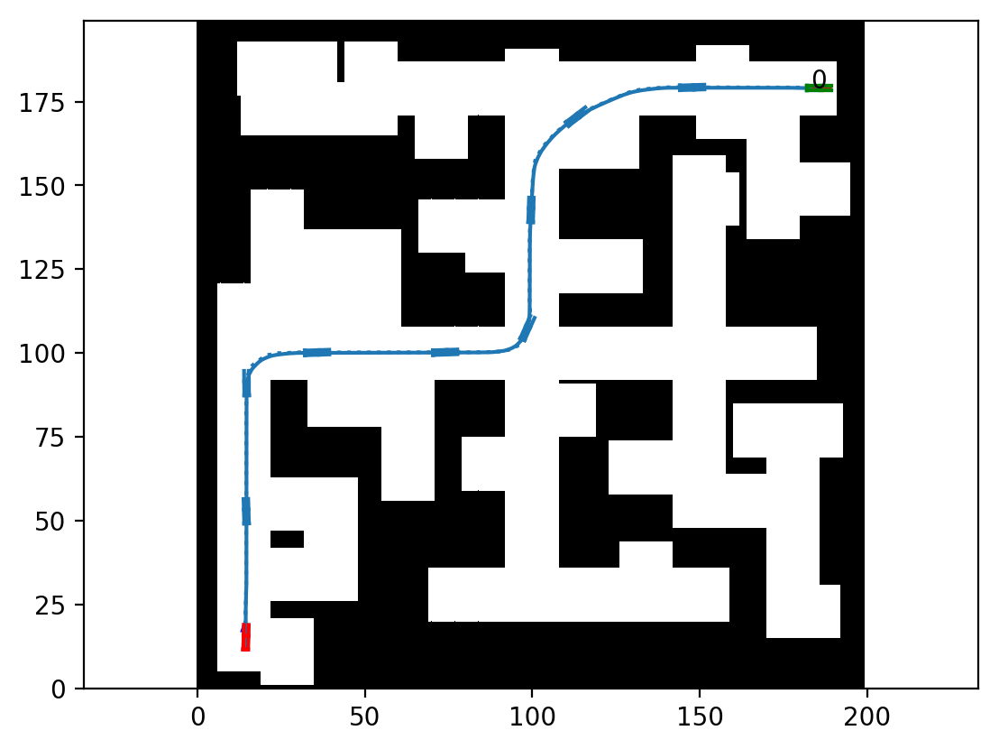

Run n° 11
[[-0.40761538  0.        ]
 [ 0.15376923  0.        ]
 [ 0.71515385  0.        ]
 [ 1.27653846  0.        ]
 [ 1.83792308  0.        ]
 [ 2.39930769  0.        ]
 [ 2.96069231  0.        ]
 [ 3.52207692  0.        ]
 [ 4.08346154  0.        ]
 [ 4.64484615  0.        ]
 [ 5.20623077  0.        ]
 [ 5.76761538  0.        ]]
3D obstacles calculation time: 1.2058601379394531 seconds
3D obstacles distances time: 0.5496301651000977 seconds
3D obstacles distances saturated time: 0.5301976203918457 seconds
Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 5.9179887771606445 seconds, and 334 iterations.
Post-Processing


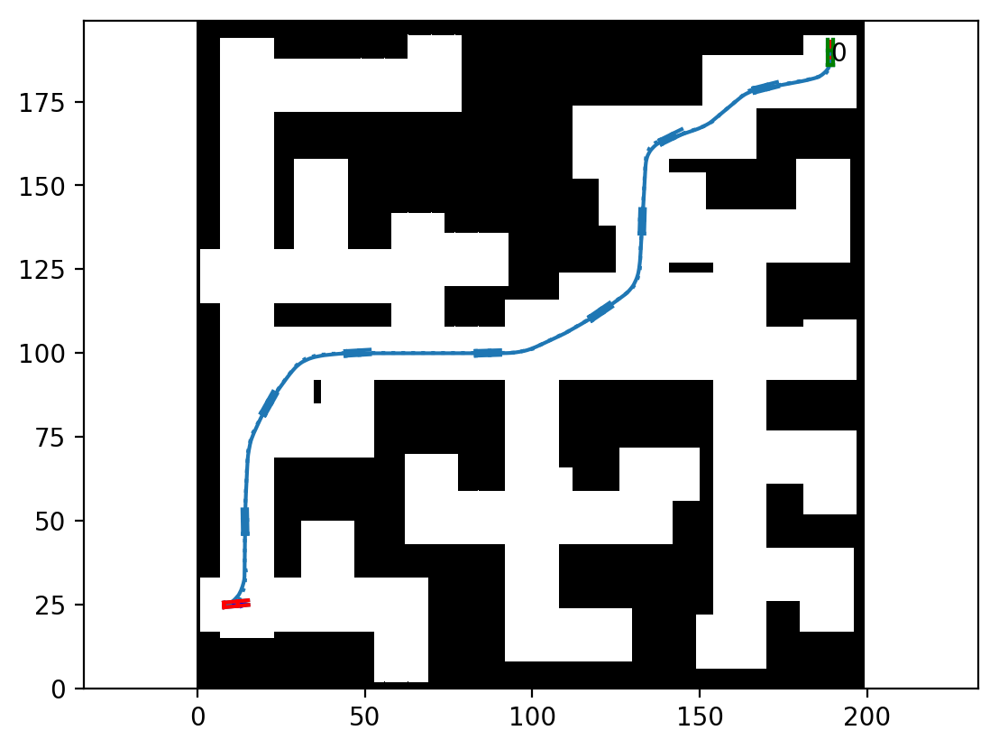

Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 5.131241083145142 seconds, and 352 iterations.
Post-Processing


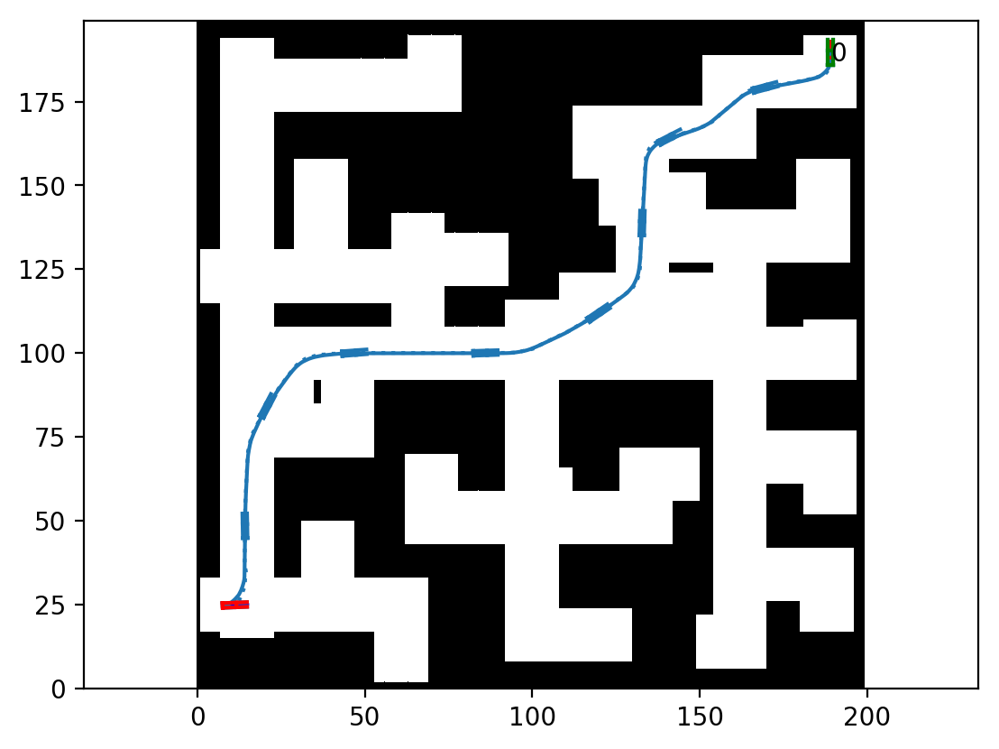

Run n° 12
[[-0.40761538  0.        ]
 [ 0.15376923  0.        ]
 [ 0.71515385  0.        ]
 [ 1.27653846  0.        ]
 [ 1.83792308  0.        ]
 [ 2.39930769  0.        ]
 [ 2.96069231  0.        ]
 [ 3.52207692  0.        ]
 [ 4.08346154  0.        ]
 [ 4.64484615  0.        ]
 [ 5.20623077  0.        ]
 [ 5.76761538  0.        ]]
3D obstacles calculation time: 1.1303377151489258 seconds
3D obstacles distances time: 0.47037291526794434 seconds
3D obstacles distances saturated time: 0.4857501983642578 seconds
Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 6.081141948699951 seconds, and 320 iterations.
Post-Processing


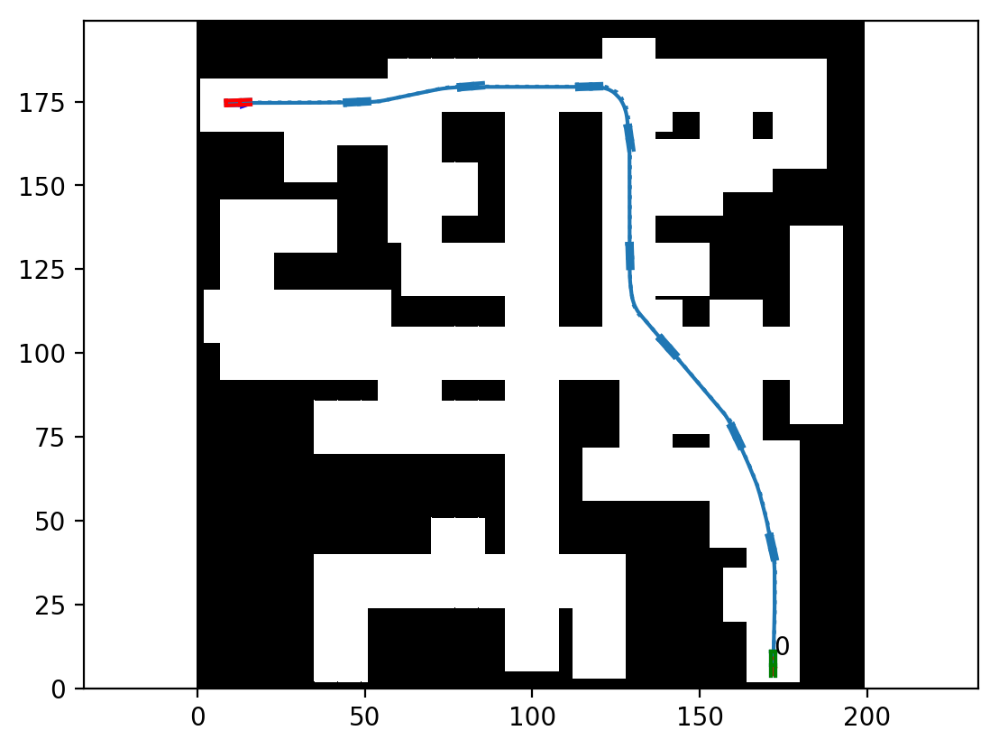

Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 5.093603134155273 seconds, and 343 iterations.
Post-Processing


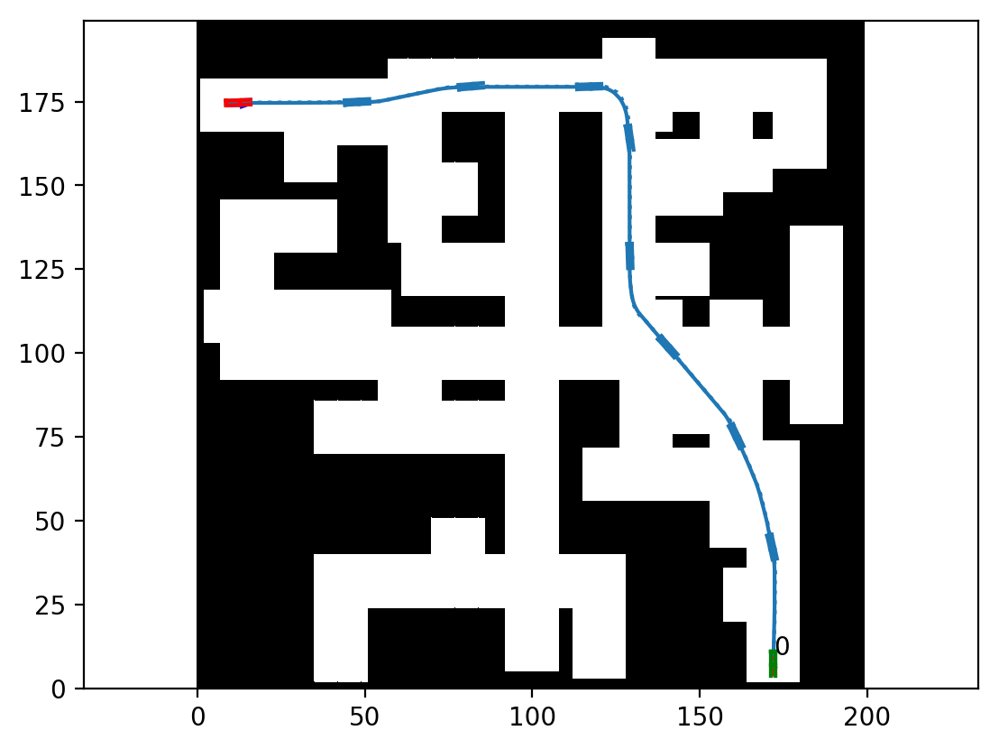

Run n° 13
[[-0.40761538  0.        ]
 [ 0.15376923  0.        ]
 [ 0.71515385  0.        ]
 [ 1.27653846  0.        ]
 [ 1.83792308  0.        ]
 [ 2.39930769  0.        ]
 [ 2.96069231  0.        ]
 [ 3.52207692  0.        ]
 [ 4.08346154  0.        ]
 [ 4.64484615  0.        ]
 [ 5.20623077  0.        ]
 [ 5.76761538  0.        ]]
3D obstacles calculation time: 1.2445456981658936 seconds
3D obstacles distances time: 0.5588147640228271 seconds
3D obstacles distances saturated time: 0.5504274368286133 seconds
Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 6.198146343231201 seconds, and 378 iterations.
Post-Processing


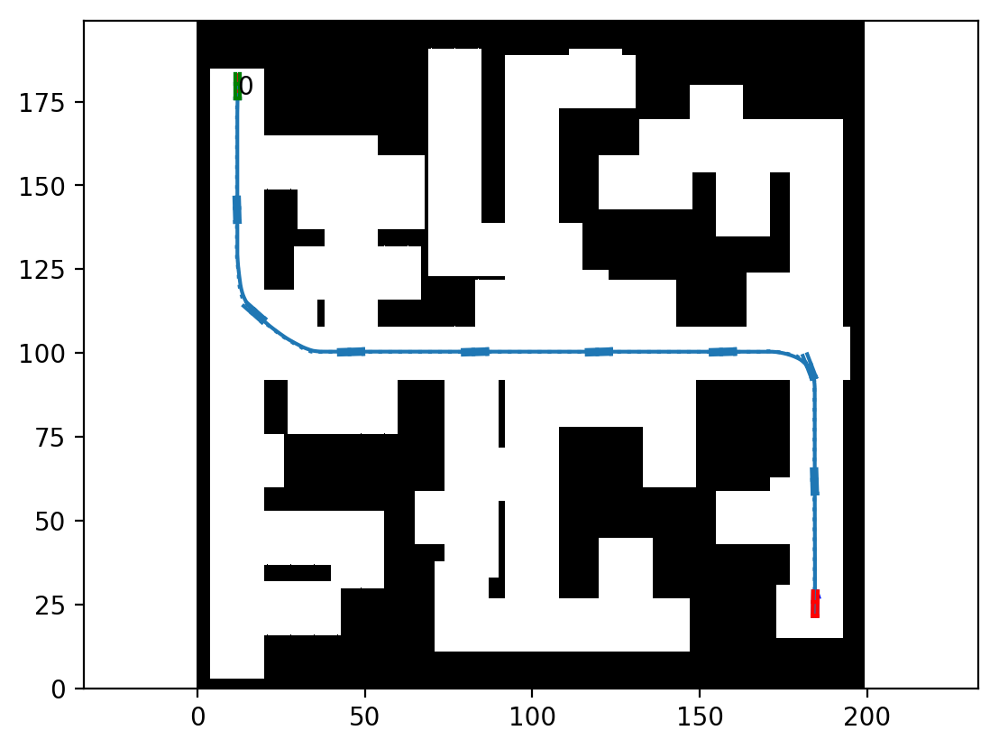

Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 5.18973183631897 seconds, and 391 iterations.
Post-Processing


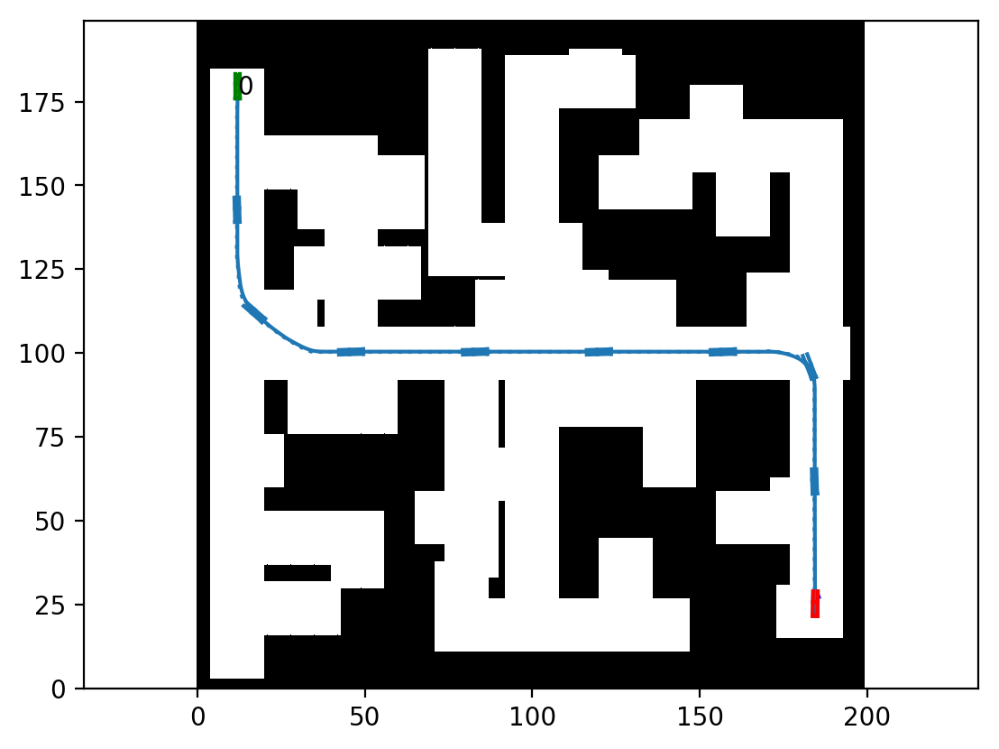

Run n° 14
[[-0.40761538  0.        ]
 [ 0.15376923  0.        ]
 [ 0.71515385  0.        ]
 [ 1.27653846  0.        ]
 [ 1.83792308  0.        ]
 [ 2.39930769  0.        ]
 [ 2.96069231  0.        ]
 [ 3.52207692  0.        ]
 [ 4.08346154  0.        ]
 [ 4.64484615  0.        ]
 [ 5.20623077  0.        ]
 [ 5.76761538  0.        ]]
3D obstacles calculation time: 1.2051632404327393 seconds
3D obstacles distances time: 0.6010184288024902 seconds
3D obstacles distances saturated time: 0.5939550399780273 seconds
Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 5.548898220062256 seconds, and 367 iterations.
Post-Processing


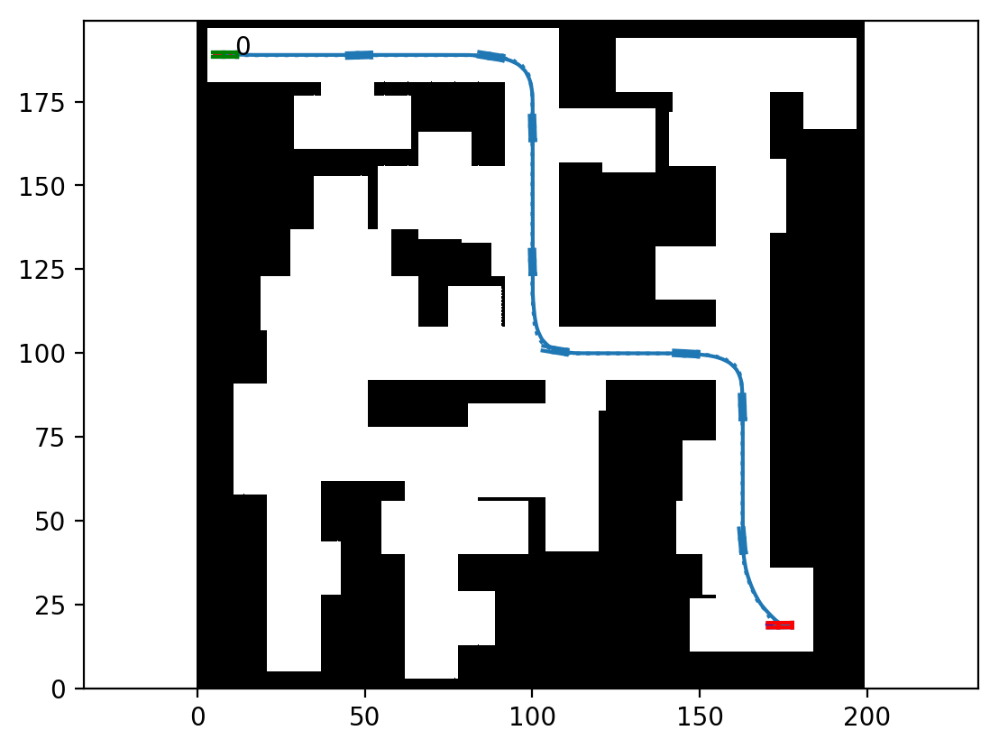

Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 4.6915740966796875 seconds, and 397 iterations.
Post-Processing


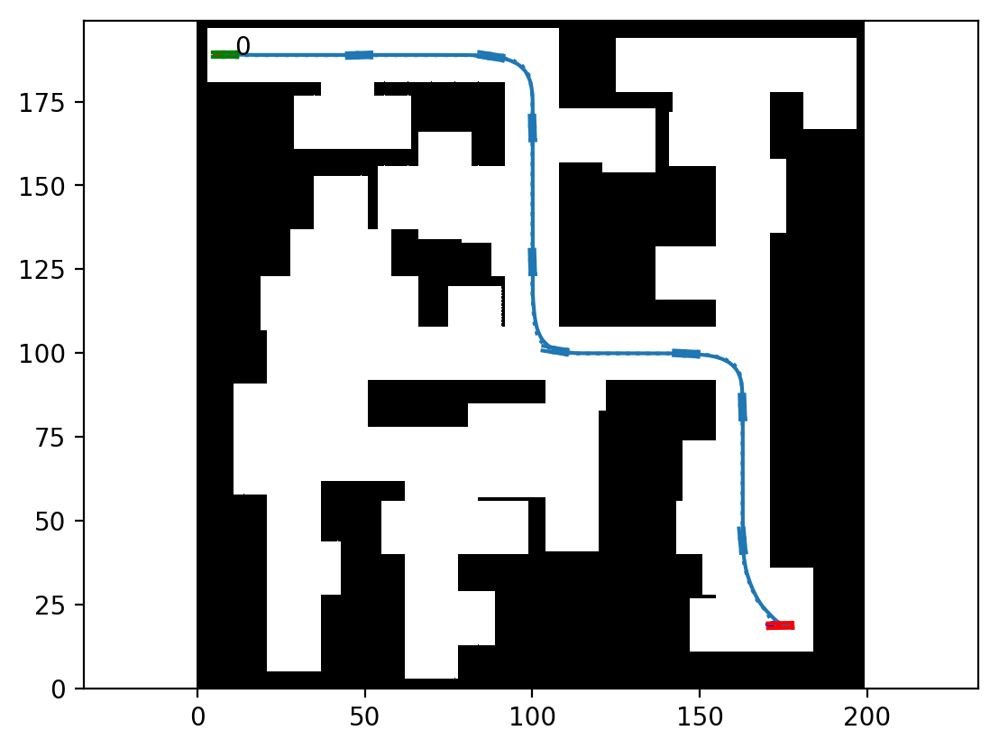

Run n° 15
[[-0.40761538  0.        ]
 [ 0.15376923  0.        ]
 [ 0.71515385  0.        ]
 [ 1.27653846  0.        ]
 [ 1.83792308  0.        ]
 [ 2.39930769  0.        ]
 [ 2.96069231  0.        ]
 [ 3.52207692  0.        ]
 [ 4.08346154  0.        ]
 [ 4.64484615  0.        ]
 [ 5.20623077  0.        ]
 [ 5.76761538  0.        ]]
3D obstacles calculation time: 1.225006341934204 seconds
3D obstacles distances time: 0.49071788787841797 seconds
3D obstacles distances saturated time: 0.5133438110351562 seconds
Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 5.711122751235962 seconds, and 307 iterations.
Post-Processing


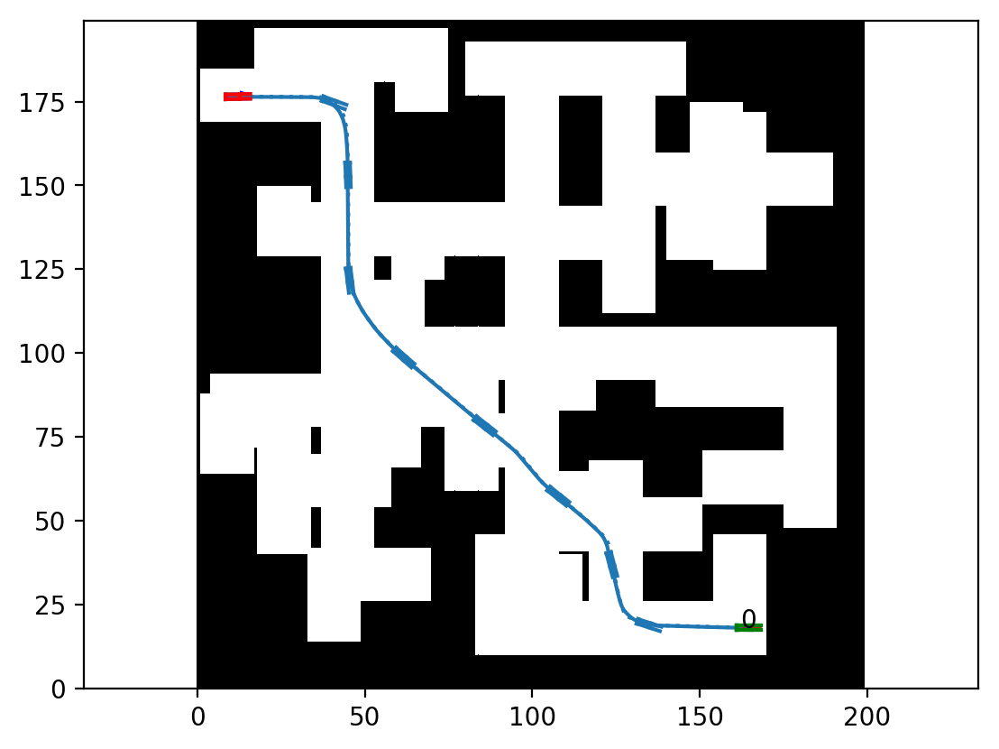

Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 5.00862455368042 seconds, and 322 iterations.
Post-Processing


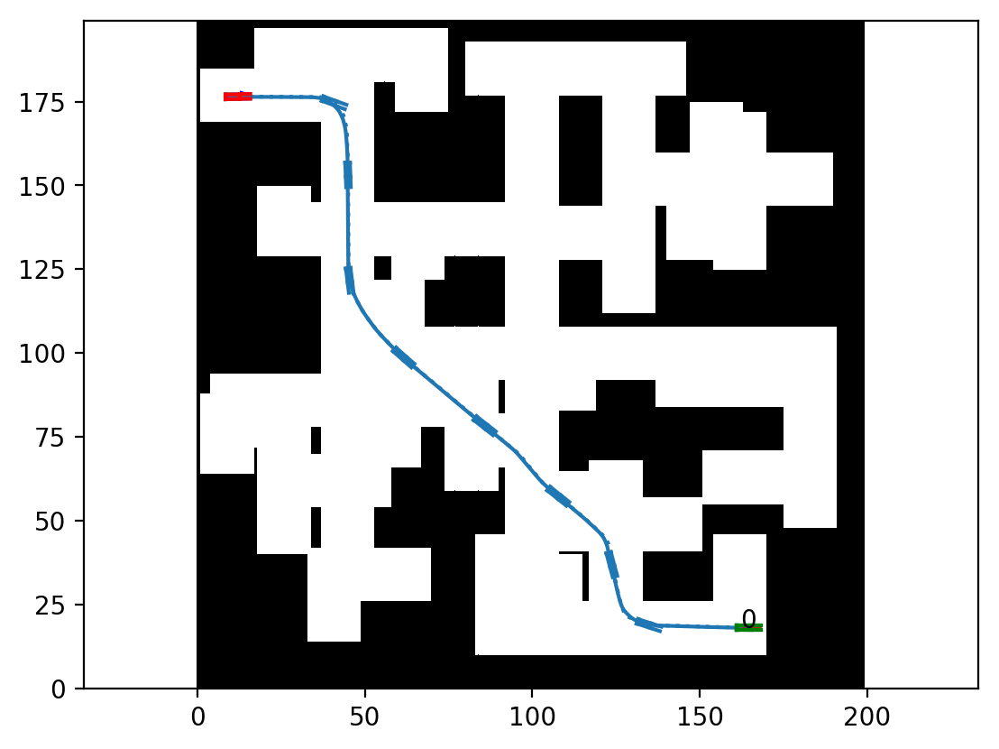

Run n° 16
[[-0.40761538  0.        ]
 [ 0.15376923  0.        ]
 [ 0.71515385  0.        ]
 [ 1.27653846  0.        ]
 [ 1.83792308  0.        ]
 [ 2.39930769  0.        ]
 [ 2.96069231  0.        ]
 [ 3.52207692  0.        ]
 [ 4.08346154  0.        ]
 [ 4.64484615  0.        ]
 [ 5.20623077  0.        ]
 [ 5.76761538  0.        ]]
3D obstacles calculation time: 1.2010314464569092 seconds
3D obstacles distances time: 0.44425511360168457 seconds
3D obstacles distances saturated time: 0.3938636779785156 seconds
Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 5.928390264511108 seconds, and 293 iterations.
Post-Processing


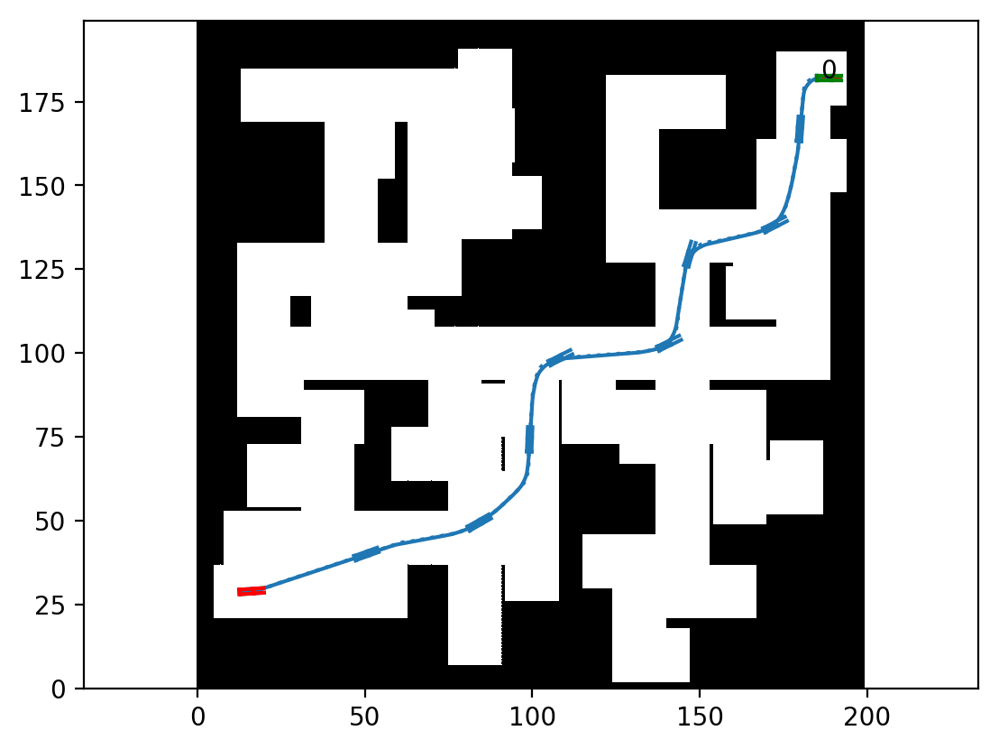

Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 5.198812246322632 seconds, and 318 iterations.
Post-Processing


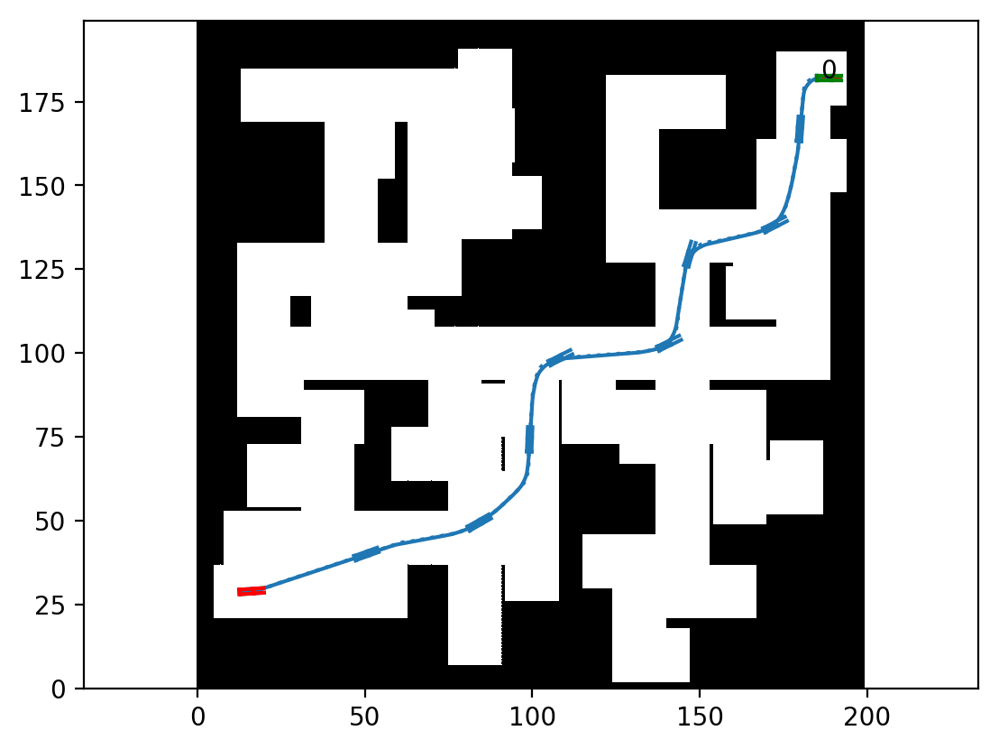

Run n° 17
[[-0.40761538  0.        ]
 [ 0.15376923  0.        ]
 [ 0.71515385  0.        ]
 [ 1.27653846  0.        ]
 [ 1.83792308  0.        ]
 [ 2.39930769  0.        ]
 [ 2.96069231  0.        ]
 [ 3.52207692  0.        ]
 [ 4.08346154  0.        ]
 [ 4.64484615  0.        ]
 [ 5.20623077  0.        ]
 [ 5.76761538  0.        ]]
3D obstacles calculation time: 1.0984344482421875 seconds
3D obstacles distances time: 0.49010539054870605 seconds
3D obstacles distances saturated time: 0.594825029373169 seconds
Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 6.039048910140991 seconds, and 339 iterations.
Post-Processing


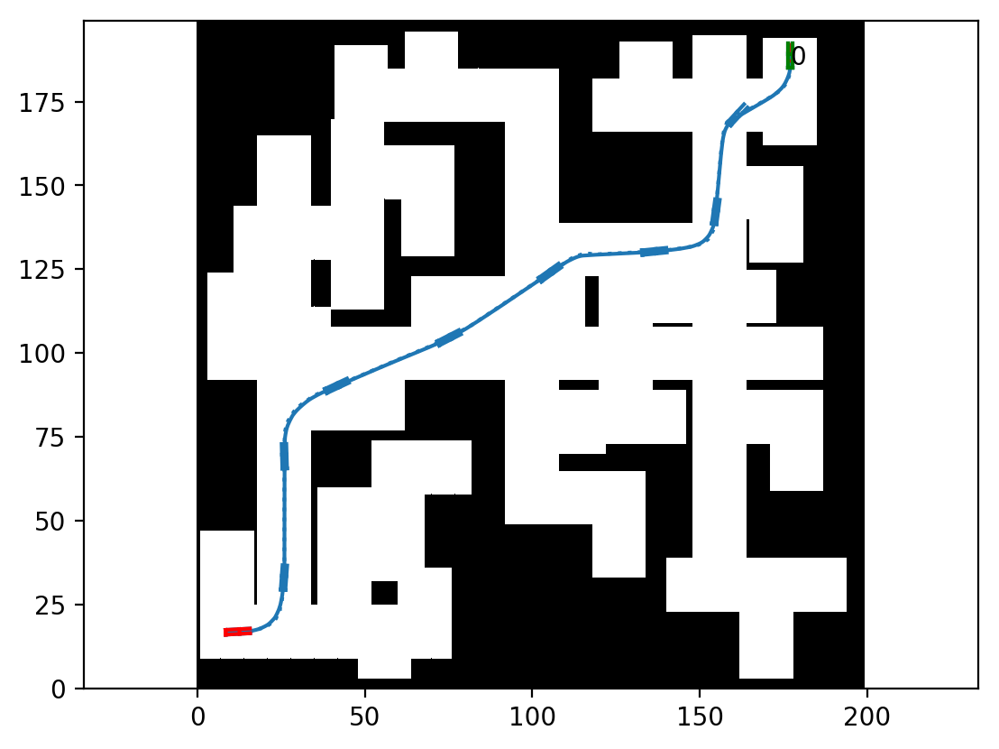

Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 5.450273513793945 seconds, and 355 iterations.
Post-Processing


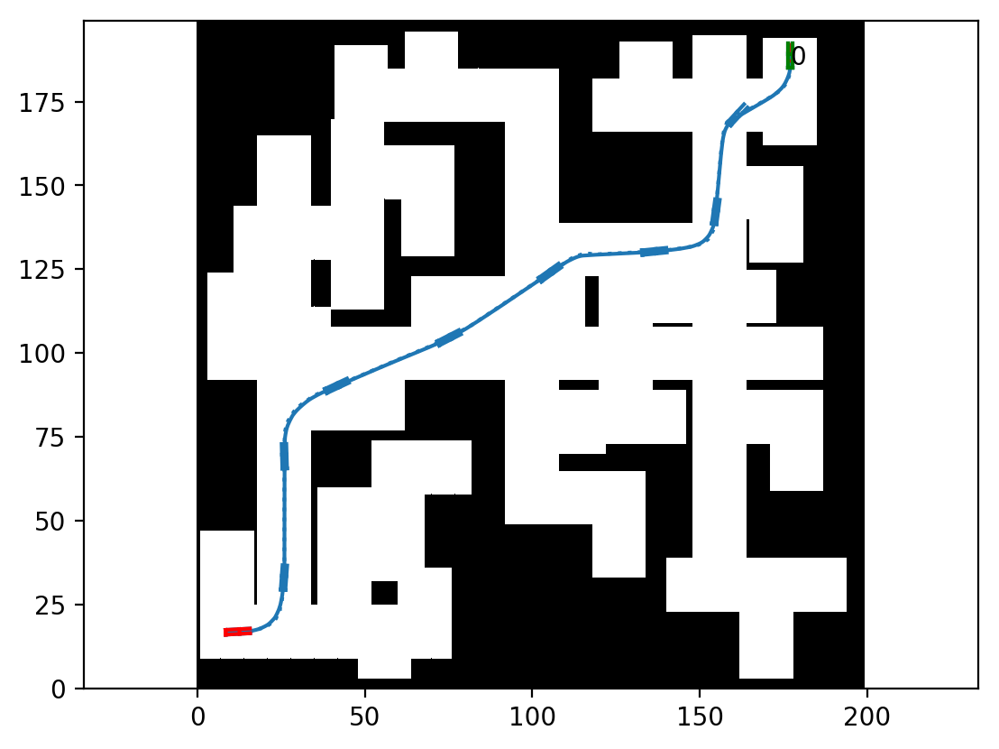

Run n° 18
[[-0.40761538  0.        ]
 [ 0.15376923  0.        ]
 [ 0.71515385  0.        ]
 [ 1.27653846  0.        ]
 [ 1.83792308  0.        ]
 [ 2.39930769  0.        ]
 [ 2.96069231  0.        ]
 [ 3.52207692  0.        ]
 [ 4.08346154  0.        ]
 [ 4.64484615  0.        ]
 [ 5.20623077  0.        ]
 [ 5.76761538  0.        ]]
3D obstacles calculation time: 1.116485834121704 seconds
3D obstacles distances time: 0.4568920135498047 seconds
3D obstacles distances saturated time: 0.5034952163696289 seconds
Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 5.6423773765563965 seconds, and 335 iterations.
Post-Processing


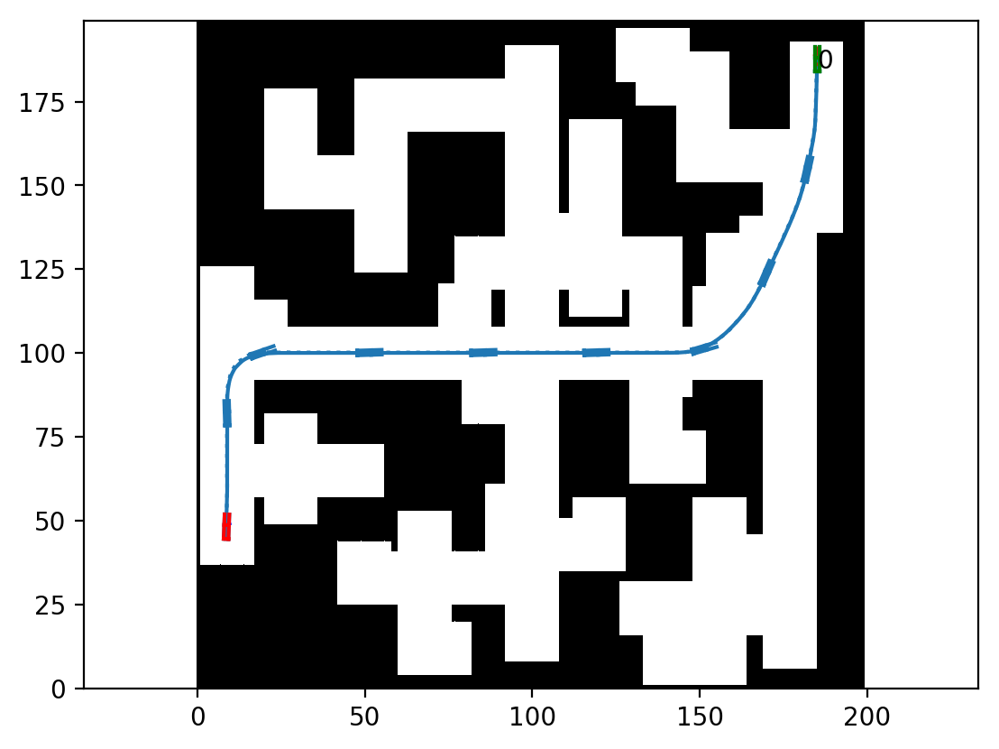

Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 4.9348742961883545 seconds, and 355 iterations.
Post-Processing


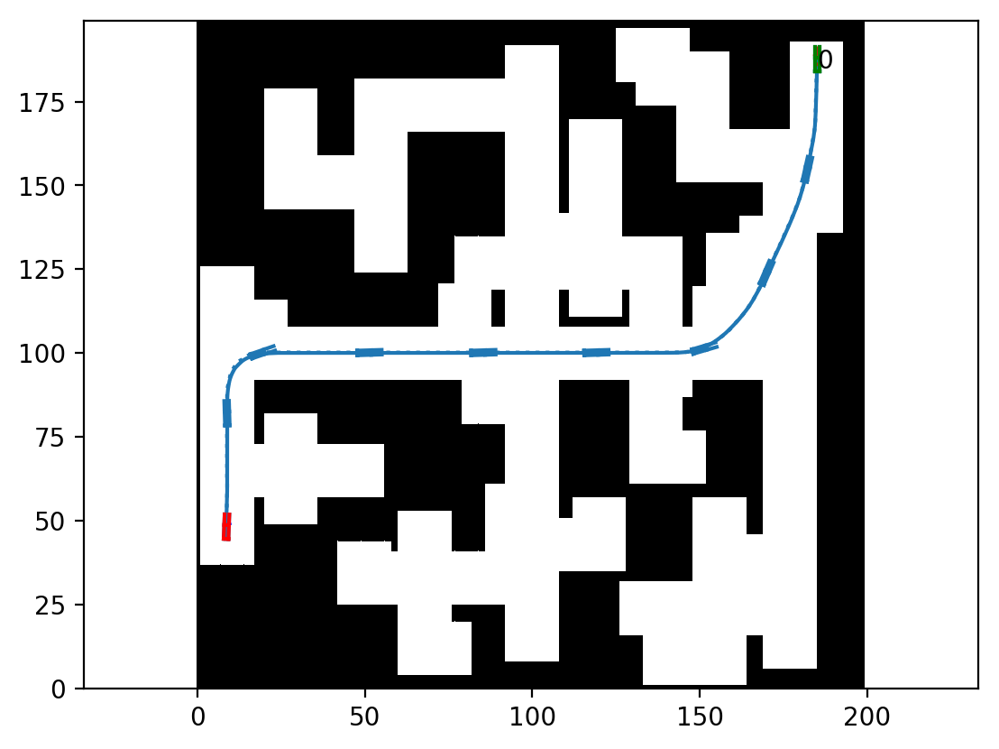

Run n° 19
[[-0.40761538  0.        ]
 [ 0.15376923  0.        ]
 [ 0.71515385  0.        ]
 [ 1.27653846  0.        ]
 [ 1.83792308  0.        ]
 [ 2.39930769  0.        ]
 [ 2.96069231  0.        ]
 [ 3.52207692  0.        ]
 [ 4.08346154  0.        ]
 [ 4.64484615  0.        ]
 [ 5.20623077  0.        ]
 [ 5.76761538  0.        ]]
3D obstacles calculation time: 1.118520975112915 seconds
3D obstacles distances time: 0.45372509956359863 seconds
3D obstacles distances saturated time: 0.4581108093261719 seconds
Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 6.119736909866333 seconds, and 326 iterations.
Post-Processing


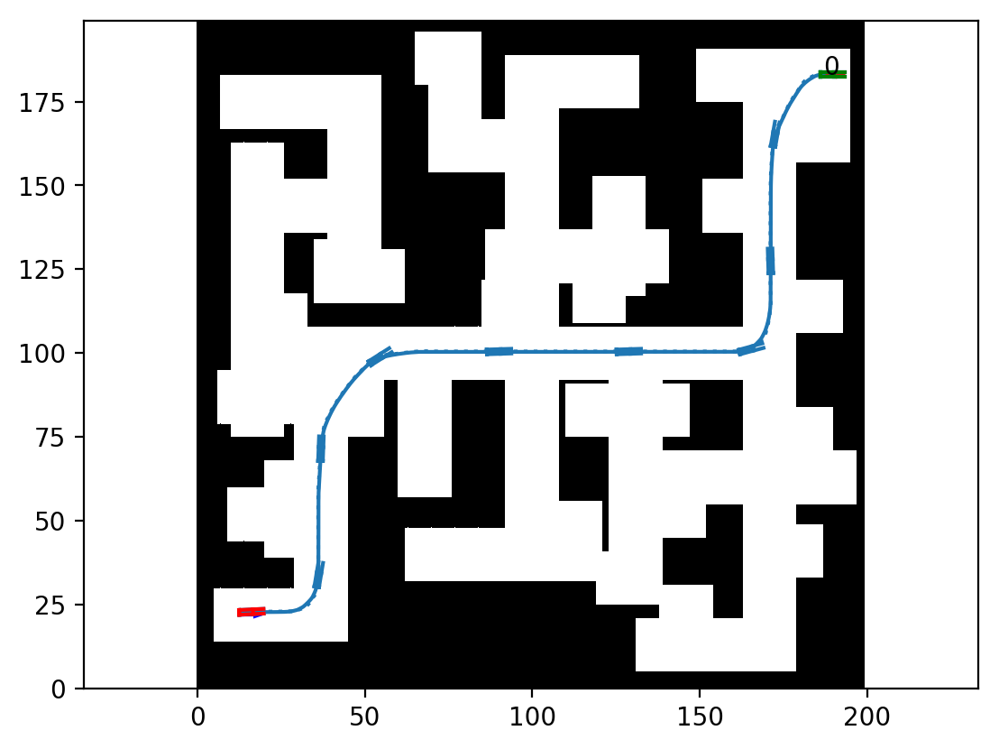

Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 5.337500810623169 seconds, and 345 iterations.
Post-Processing


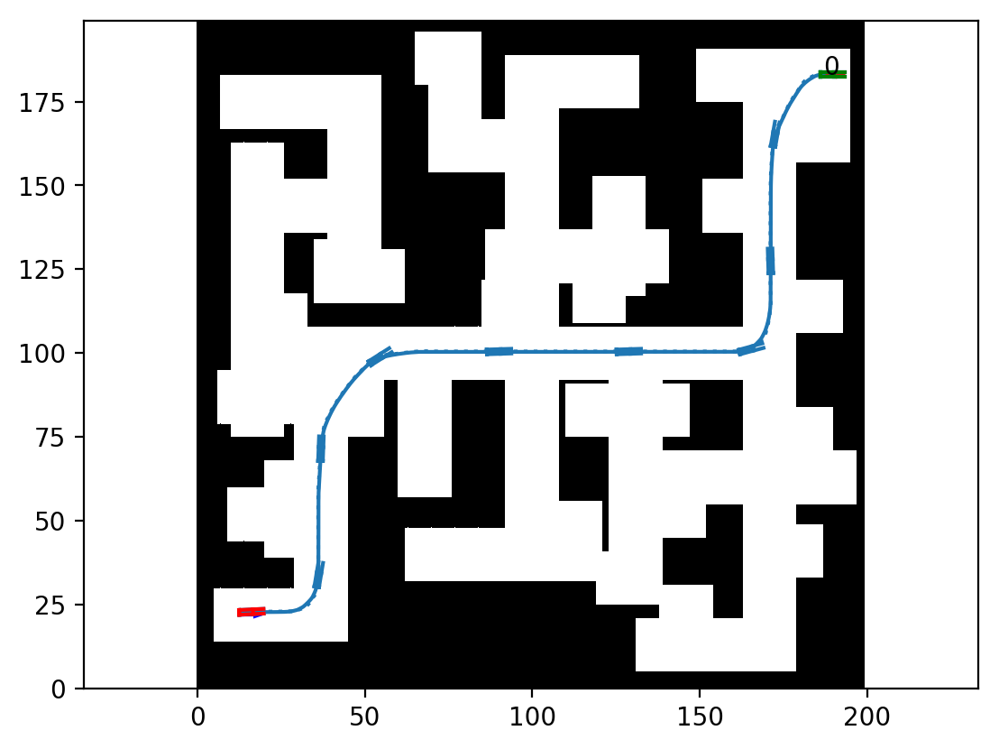

Run n° 20
[[-0.40761538  0.        ]
 [ 0.15376923  0.        ]
 [ 0.71515385  0.        ]
 [ 1.27653846  0.        ]
 [ 1.83792308  0.        ]
 [ 2.39930769  0.        ]
 [ 2.96069231  0.        ]
 [ 3.52207692  0.        ]
 [ 4.08346154  0.        ]
 [ 4.64484615  0.        ]
 [ 5.20623077  0.        ]
 [ 5.76761538  0.        ]]
3D obstacles calculation time: 1.189119815826416 seconds
3D obstacles distances time: 0.5179116725921631 seconds
3D obstacles distances saturated time: 0.5617883205413818 seconds
Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 5.851958274841309 seconds, and 341 iterations.
Post-Processing


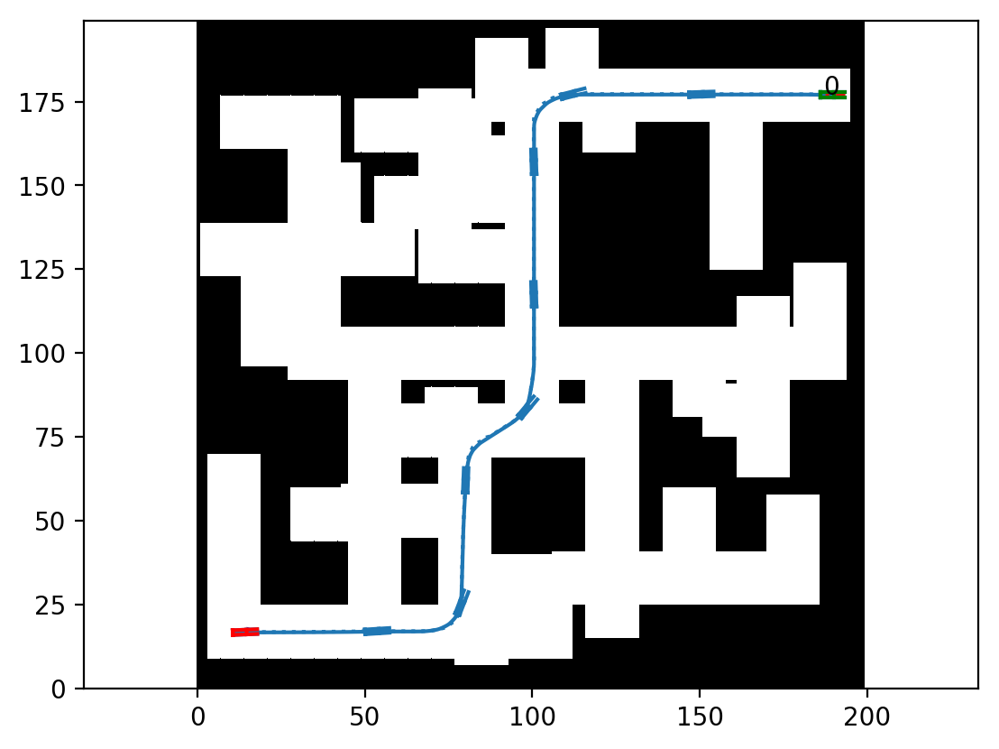

Setting the kernel traits.
Preparing the domain data (shape,metric,...)
Preparing the problem rhs (cost, seeds,...)
Preparing the GPU kernel
Running the eikonal GPU kernel
GPU kernel eikonal ran for 5.11525297164917 seconds, and 376 iterations.
Post-Processing


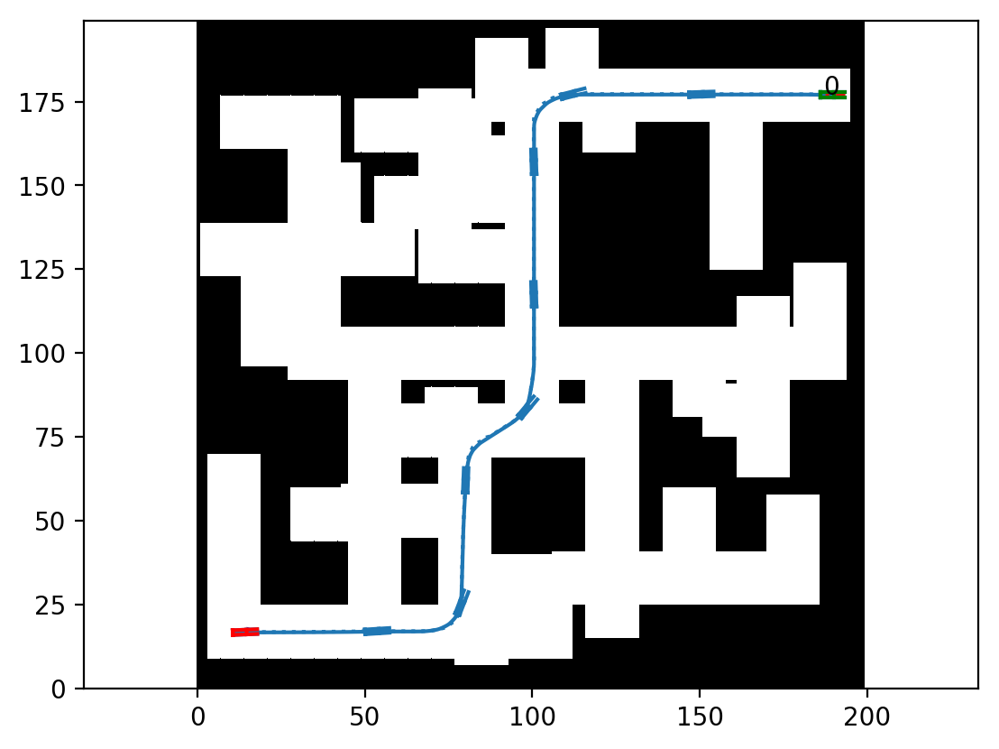

In [27]:
# Initialize result collections
runs = data["runs"]  # Extract benchmark runs from data
geos2WS = []         # Store 2-wheel steering results
geos4WS = []         # Store 4-wheel steering results
list_walls = []      # Store environment maps

# Process each benchmark environment
k = 0
for i in runs:
    k += 1
    print("Run n°", k)
    
    # Process environment data
    walls, X, walls_dist, Dxy, Nxy = extract_env(i)
    
    # Build 3D configuration space with multi-ball approximation
    walls3, walls3_dist, walls3_dist_saturated = build_3d(balls_number, walls_dist, Nxy, Dxy)
    
    # Extract grid dimensions
    Nx = Nxy[0]
    Ny = Nxy[1]
    
    # Extract start and goal configurations
    seed = xp.r_[i["environment"]["start"], 0]  # Append state index 0
    tips = xp.r_[i["environment"]["goal"], 0]   # Append state index 0
    
    # Initialize Fast Marching solver
    hfmIn0 = Eikonal.dictIn({
        'model':'DubinsState4',               # 4D model (x,y,θ,state)
        'seed': seed,                         # Starting configuration
        'tips': [tips],                       # Target configuration
        'origin': (0, 0, 0, -0.5),            # Domain origin
        'gridScales': (Dxy[0], Dxy[1], 2*np.pi/Nθ, 1),  # Grid spacing
        'periodic': [False, False, True, False],  # Angular periodicity
        'exportActiveNeighs': True,           # Export control data
        'verbosity': 1,                       # Output level
        'nitermax_o': 4000,                   # Maximum iterations
        'exportGeodesicFlow': True,           # Export flow field
        'exportValues': True,                 # Export value function
    })
    
    # Run 2WS planning (with parameters tuned for comparison)
    _, hfmOut1 = run_controls(
        hfmIn0.copy(),                        # Fresh solver instance
        Two_WS_complex_state(Θ, wheelbase_zoom, rev_ratio=0.5),  # 2WS controls
        fm2=1,                                # Obstacle cost weighting
        saturation=1.,                        # Use saturated distance
        state_transition_costs=1              # Low state transition cost
    )
    
    # Run 4WS planning (with identical parameters)
    _, hfmOut2 = run_controls(
        hfmIn0.copy(),                        # Fresh solver instance
        Four_WS_complex_state(Θ, wheelbase_zoom, rev_ratio=0.5),  # 4WS controls
        fm2=1,                                # Obstacle cost weighting
        saturation=1.,                        # Use saturated distance
        state_transition_costs=1              # Low state transition cost
    )
    
    # Extract and store results
    path = hfmOut1['geodesics'][0].T         # Extract 2WS path
    geos2WS.append(path.get())               # Store in CPU memory
    
    path = hfmOut2['geodesics'][0].T         # Extract 4WS path
    geos4WS.append(path.get())               # Store in CPU memory
    
    list_walls.append(walls)                 # Store environment map

In [28]:
# Initialize containers for reformatted trajectories
ngeo2 = []  # Will hold 2WS trajectories in visualization format
ngeo4 = []  # Will hold 4WS trajectories in visualization format

# Process each trajectory pair
for i in range(len(geos2WS)):
    # Process 2WS trajectory
    # 1. Extract x,y coordinates and orientation
    # 2. Apply orientation adjustment (add π)
    # 3. Stack vertically and transpose to get (N,3) format
    ngeo = np.vstack((geos2WS[i][:,0], geos2WS[i][:,1], geos2WS[i][:,2]+np.pi)).T
    ngeo2.append(ngeo)
    
    # Process 4WS trajectory (same procedure)
    ngeo = np.vstack((geos4WS[i][:,0], geos4WS[i][:,1], geos4WS[i][:,2]+np.pi)).T
    ngeo4.append(ngeo)

### 5.4 Performance Evaluation

Following the execution of our algorithms on procedurally generated environments, we now quantitatively assess their performance using the same metrics established earlier. This evaluation provides statistical significance to our comparisons by analyzing how consistently different approaches perform across varied but systematically generated scenarios.

In [29]:
# Initialize placeholder variables
length_m = 0       # Not used in current implementation
max_curv_m = 0     # Not used in current implementation  
norm_curv_m = 0    # Not used in current implementation
aol_m = 0          # Not used in current implementation

# Create structured dictionary to store performance metrics
stats = {
    'StateHFM_2WS': {  # Metrics for 2-wheel steering implementation
        'path_length': [],              # Total trajectory length
        'aol': [],                      # Amount of linear motion (straightness)
        'normalized_curvature': [],     # Curvature normalized by path length
        'max_curvature': [],            # Maximum curvature along path
        'max_clearing_distance': [],    # Maximum distance to obstacles
        'mean_clearing_distance': [],   # Average distance to obstacles
        'median_clearing_distance': [], # Median distance to obstacles
        'min_clearing_distance': []     # Minimum distance to obstacles (safety metric)
    },
    'StateHFM_4WS': {  # Same metrics for 4-wheel steering implementation
        'path_length': [],
        'aol': [],
        'normalized_curvature': [],
        'max_curvature': [],
        'max_clearing_distance': [],
        'mean_clearing_distance': [],
        'median_clearing_distance': [],
        'min_clearing_distance': []
    }
}

# Process 2WS trajectories (using first 2 for quick analysis)
for i in range(len(geos2WS)):  # Limiting to first 2 environments for demonstration
    # Calculate path metrics
    length = compute_path_length(geos2WS[i])                             # Total length
    max_curv, norm_curv = compute_curvature(geos2WS[i])                  # Curvature metrics
    aol = compute_aol(geos2WS[i])                                        # Amount of linear motion
    clearings = compute_clearing_distances(path=geos2WS[i],              # Obstacle clearances
                                          binary_map=list_walls[i].T)
    
    # Store metrics in stats dictionary
    stats['StateHFM_2WS']['path_length'].append(length)
    stats['StateHFM_2WS']['aol'].append(aol)
    stats['StateHFM_2WS']['normalized_curvature'].append(norm_curv)
    stats['StateHFM_2WS']['max_curvature'].append(max_curv)
    stats['StateHFM_2WS']['max_clearing_distance'].append(np.max(clearings))
    stats['StateHFM_2WS']['min_clearing_distance'].append(np.min(clearings))
    stats['StateHFM_2WS']['mean_clearing_distance'].append(np.mean(clearings))
    stats['StateHFM_2WS']['median_clearing_distance'].append(np.median(clearings))

# Process 4WS trajectories (same procedure)
for i in range(len(geos4WS)):  # Limiting to first 2 environments for demonstration
    length = compute_path_length(geos4WS[i])
    max_curv, norm_curv = compute_curvature(geos4WS[i])
    aol = compute_aol(geos4WS[i])
    clearings = compute_clearing_distances(path=geos4WS[i], 
                                          binary_map=list_walls[i].T)
    
    stats['StateHFM_4WS']['path_length'].append(length)
    stats['StateHFM_4WS']['aol'].append(aol)
    stats['StateHFM_4WS']['normalized_curvature'].append(norm_curv)
    stats['StateHFM_4WS']['max_curvature'].append(max_curv)
    stats['StateHFM_4WS']['max_clearing_distance'].append(np.max(clearings))
    stats['StateHFM_4WS']['min_clearing_distance'].append(np.min(clearings))
    stats['StateHFM_4WS']['mean_clearing_distance'].append(np.mean(clearings))
    stats['StateHFM_4WS']['median_clearing_distance'].append(np.median(clearings))

Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RECKONING
Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RECKONING
Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RECKONING
Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RECKONING
Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RECKONING
Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RECKONING
Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RECKONING
Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RECKONING
Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RECKONING
Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RECKONING
Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RECKONING
Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RE

         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/acc

Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RECKONING
Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RECKONING
Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RECKONING
Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RECKONING
Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RECKONING
Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RECKONING
Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RECKONING
Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RECKONING
Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RECKONING
Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RECKONING
Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RECKONING
Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RE

         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/acc

Info:    Computing distances via DEAD_RECKONING
Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RECKONING
Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RECKONING
Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RECKONING
Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RECKONING
Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RECKONING
Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RECKONING
Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RECKONING
Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RECKONING
Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RECKONING
Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RECKONING
Evaluate Metric in geometric space 
Info:    Computing distances via DEAD_RECKONING


         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/accrobot/ompl-1.5.2/src/ompl/base/src/SpaceInformation.cpp
         at line 63 in /home/acc

Visualizing comparison_extend_functions_RC_procedural.json


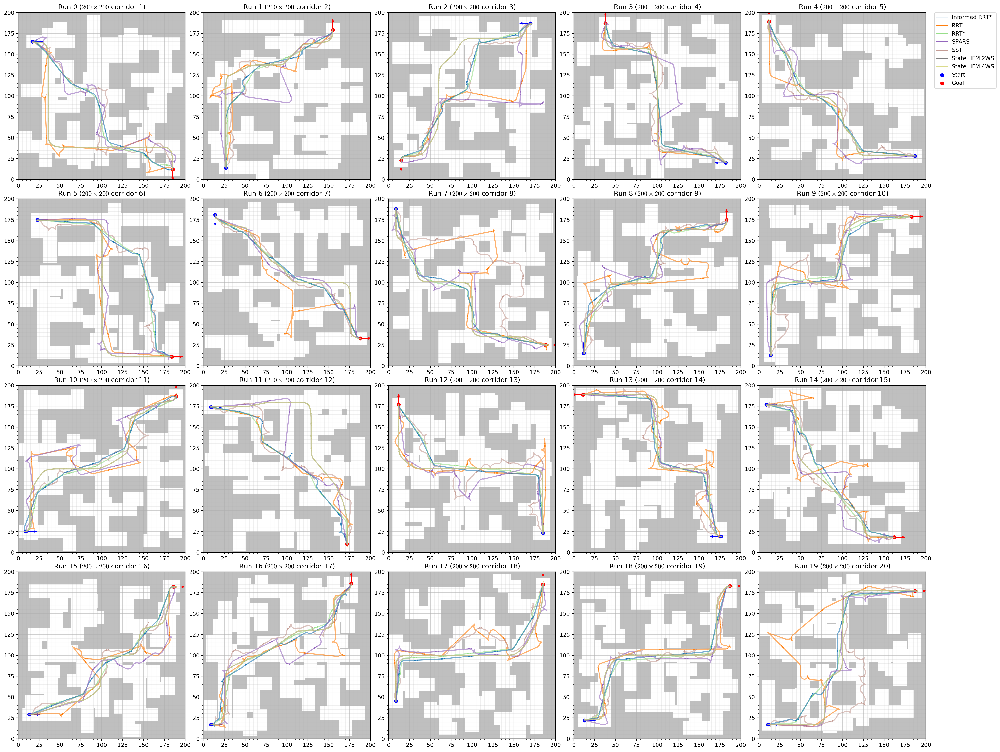

Visualizing comparison_extend_functions_RC_procedural.json...


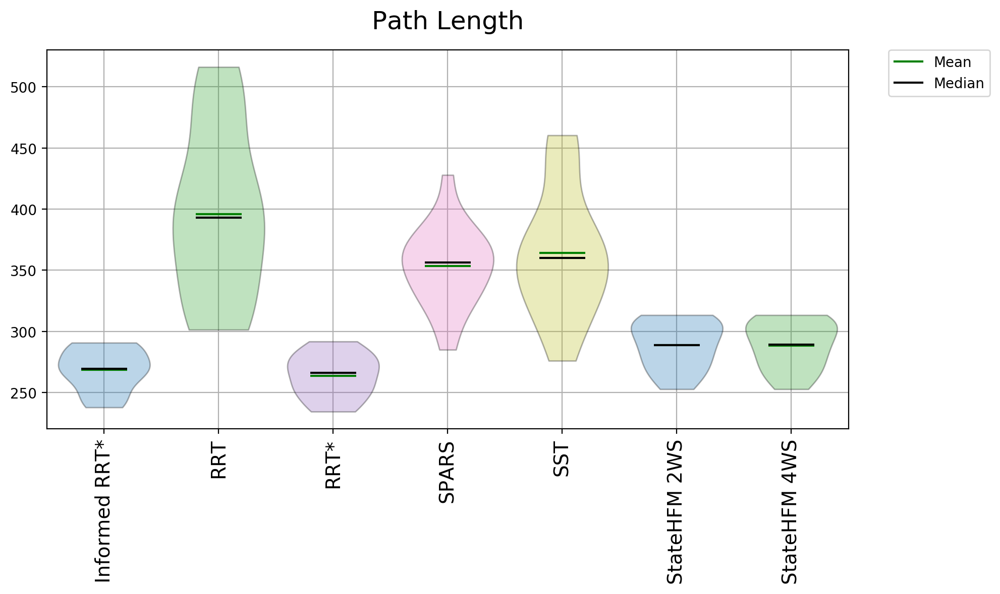

Visualizing comparison_extend_functions_RC_procedural.json...


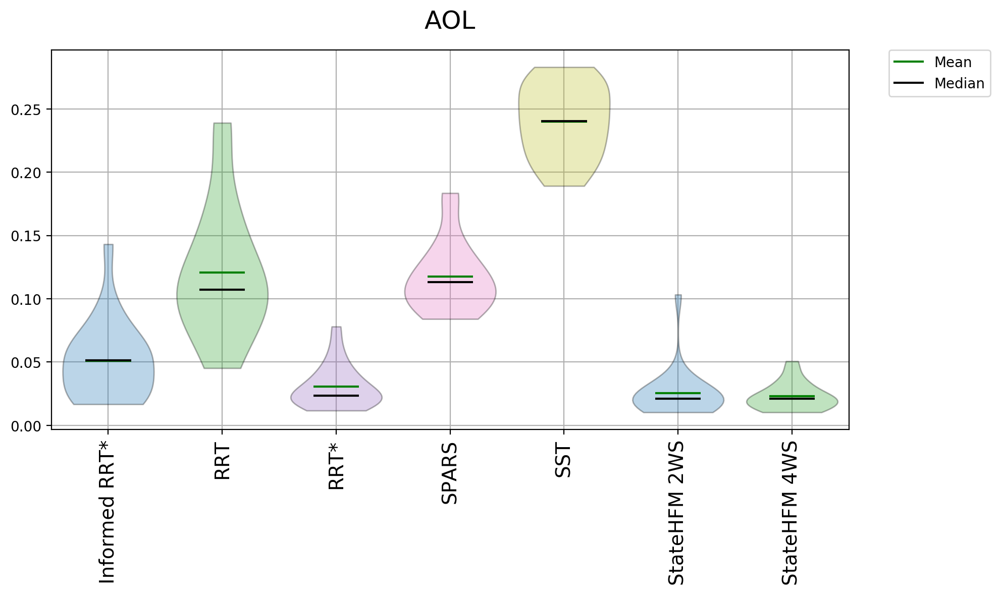

Visualizing comparison_extend_functions_RC_procedural.json...


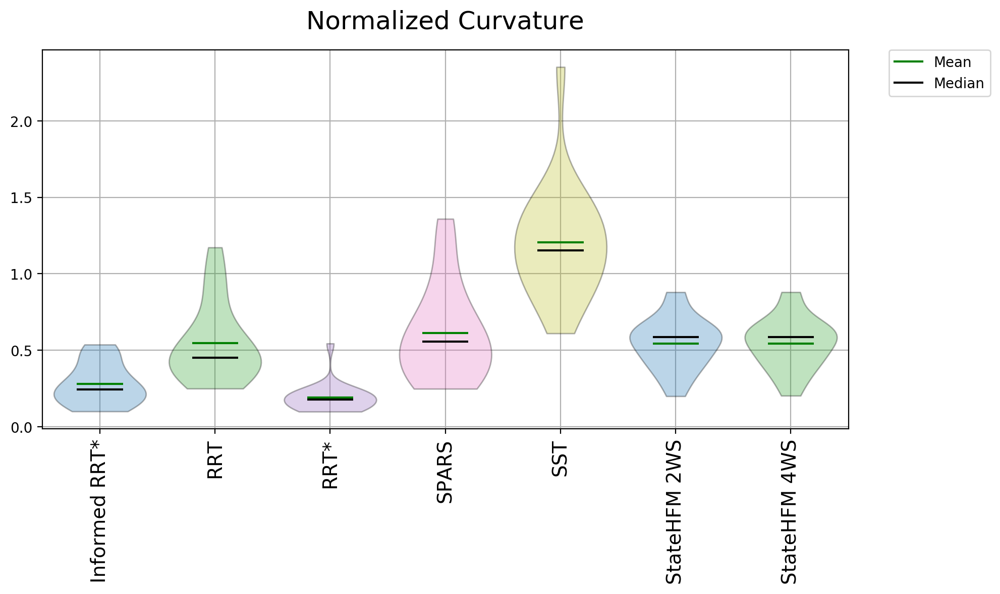

Visualizing comparison_extend_functions_RC_procedural.json...


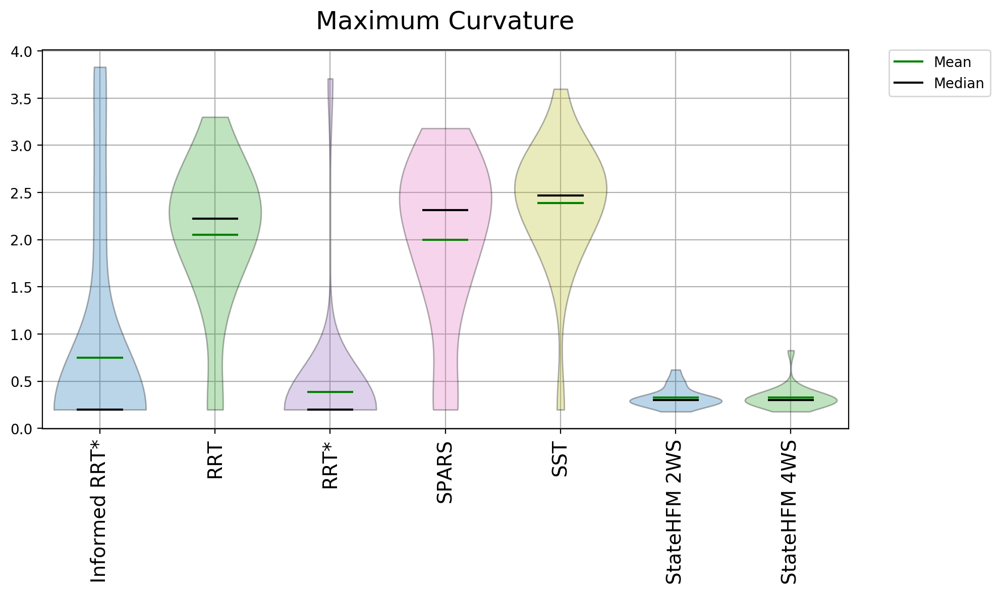

Visualizing comparison_extend_functions_RC_procedural.json...


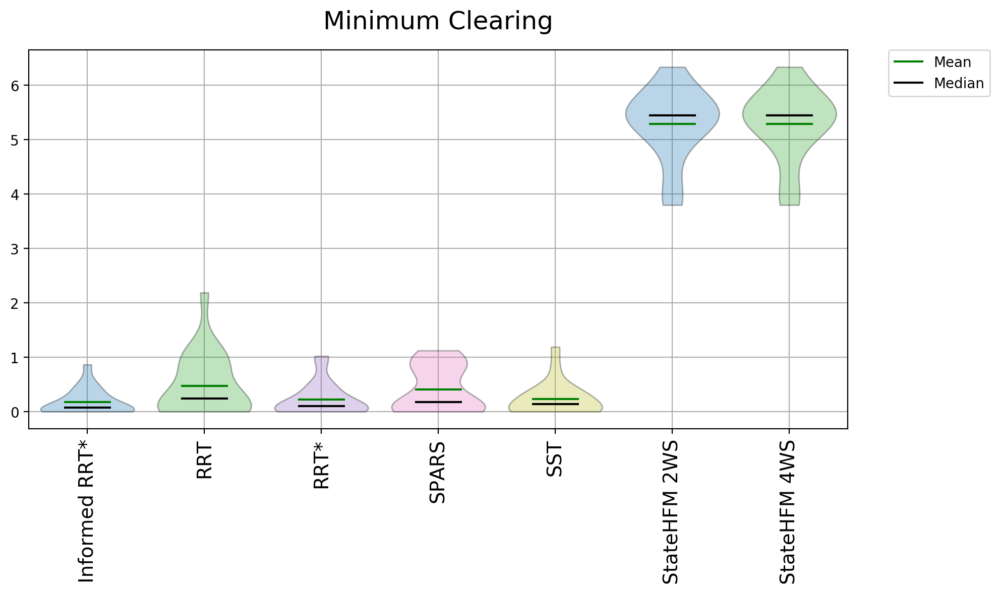

Visualizing comparison_extend_functions_RC_procedural.json...


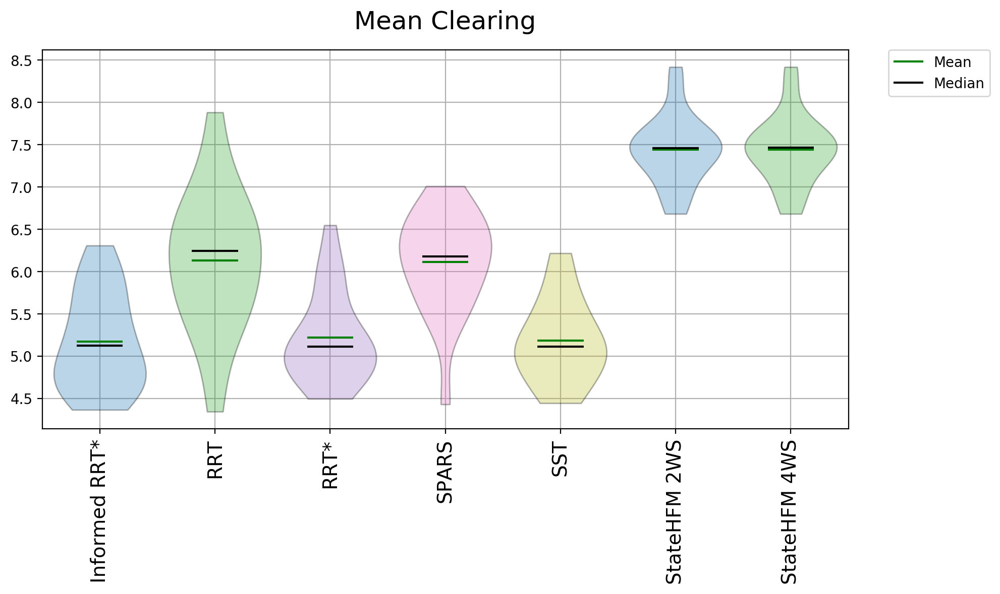

Visualizing comparison_extend_functions_RC_procedural.json...


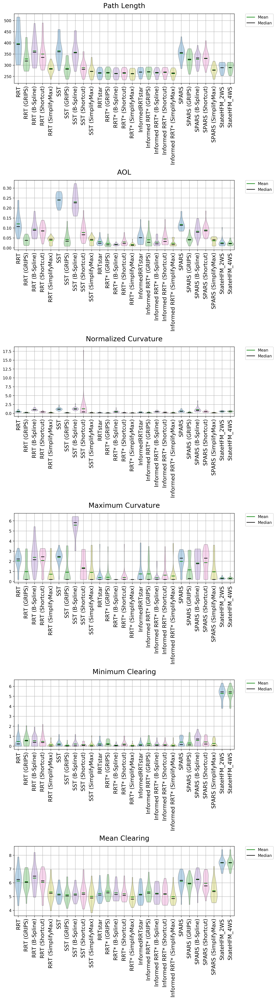

In [30]:
# Visualize trajectories from all planners in the environment
visualize(
    'comparison_extend_functions_RC_procedural.json',  # Benchmark results file
    additional_path=[ngeo2, ngeo4],         # Add our custom HFM paths
    plot_every_nth_polygon=60,              # Reduce density for clarity
    draw_start_goal_thetas=True             # Show orientation at endpoints
)

# Detailed analysis of path length performance
plot_planner_stats(
    'comparison_extend_functions_RC_procedural.json',
    custom_stats=stats,
    metrics='path_length',                  # Focus on path efficiency
    max_plots_per_line=1,
    combine_views=True,
    plot_violins=True,
    fig_width=10,
    fig_height=6
)

# Analysis of angle of inclination (AOL) - motion smoothness
plot_planner_stats(
    'comparison_extend_functions_RC_procedural.json',
    custom_stats=stats,
    metrics='aol',                          # Focus on path smoothness
    max_plots_per_line=1,
    combine_views=True,
    plot_violins=True,
    fig_width=10,
    fig_height=6
)

# Analysis of normalized curvature - balance of turns vs. straight segments
plot_planner_stats(
    'comparison_extend_functions_RC_procedural.json',
    custom_stats=stats,
    metrics='normalized_curvature',         # Focus on turn distribution
    max_plots_per_line=1,
    combine_views=True,
    plot_violins=True,
    fig_width=10,
    fig_height=6
)

# Analysis of maximum curvature - sharpest turns required
plot_planner_stats(
    'comparison_extend_functions_RC_procedural.json',
    custom_stats=stats,
    metrics='max_curvature',                # Focus on maneuverability requirements
    max_plots_per_line=1,
    combine_views=True,
    plot_violins=True,
    fig_width=10,
    fig_height=6
)

# Analysis of minimum clearing distance - safety margins
plot_planner_stats(
    'comparison_extend_functions_RC_procedural.json',
    custom_stats=stats,
    metrics='min_clearing_distance',        # Focus on collision safety
    max_plots_per_line=1,
    combine_views=True,
    plot_violins=True,
    fig_width=10,
    fig_height=6
)

# Analysis of mean clearing distance - overall obstacle avoidance
plot_planner_stats(
    'comparison_extend_functions_RC_procedural.json',
    custom_stats=stats,
    metrics='mean_clearing_distance',       # Focus on general obstacle avoidance
    max_plots_per_line=1,
    combine_views=True,
    plot_violins=True,
    fig_width=10,
    fig_height=6
)

# Comparison of post-smoothing performance
plot_smoother_stats(
    'comparison_extend_functions_RC_procedural.json',
    custom_stats=stats,
    # Compare across multiple metrics after smoothing
    metrics='path_length, aol, normalized_curvature, max_curvature, min_clearing_distance, mean_clearing_distance',
    max_plots_per_line=1,
    combine_views=True,
    plot_violins=True,
    fig_width=10,
    fig_height=6
)

# Display all figures
plt.show()

### 5.5 Comparative Results Analysis

The evaluation across procedurally generated environments further validates the advantages of our State-HFM approach. These randomized tests demonstrate consistent patterns that confirm our initial findings:

In path length metrics, State-HFM (both 2WS and 4WS) delivers competitive performance with median values comparable to optimized sampling-based approaches like Informed RRT*. The 4WS configuration consistently achieves slightly shorter paths than 2WS, highlighting the advantages of enhanced steering capabilities.

For path smoothness, State-HFM demonstrates remarkable performance with consistently low AOL values and balanced normalized curvature. Both 2WS and 4WS variants show significantly lower maximum curvature values compared to sampling-based methods, indicating more natural and executable trajectories without sharp turns.

The most striking advantage appears in obstacle clearance metrics, where both State-HFM variants dramatically outperform all sampling-based methods. The minimum clearing distances are approximately 3-4 times higher than the next best alternative, with 4WS showing a slight advantage over 2WS. This translates to substantially safer navigation in cluttered environments.

Mean clearing distances also favor State-HFM, demonstrating that this safety advantage is maintained throughout the entire trajectory rather than at isolated points. Importantly, these safety improvements come without significant compromises in path efficiency.

The consistency of these results across 20 different procedural environments confirms that State-HFM's advantages are generalizable rather than environment-specific.